In [58]:
# Dependencies
import tensorflow

#from tensorflow.math import reduce_prod
#from tensorflow.python.ops.math_ops import reduce_prod

import numpy as np

from sklearn.linear_model import LinearRegression 
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor 
from sklearn.neighbors import KNeighborsRegressor 
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor 
from sklearn.ensemble import GradientBoostingRegressor 
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neural_network import MLPRegressor

from sklearn.model_selection import train_test_split 
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score 
from sklearn.model_selection import GridSearchCV 
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_regression

from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense 
from tensorflow.keras.optimizers import SGD 
from tensorflow.keras.layers import LSTM
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

In [59]:
from statsmodels.tsa.arima_model import ARIMA 
import statsmodels.api as sm

In [60]:
# pandas, pandas_datareader, numpy and matplotlib
import numpy as np
import pandas as pd
#import pandas_datareader.data as web 
from matplotlib import pyplot

In [61]:
from pandas.plotting import scatter_matrix
import seaborn as sns
from sklearn.preprocessing import StandardScaler 
from pandas.plotting import scatter_matrix
from statsmodels.graphics.tsaplots import plot_acf

In [62]:
# stk_tickers = ['MSFT', 'IBM', 'GOOGL']
stk_tickers = ['ABBV', 'AMGN', 'AZN', 'BIIB', 'BMY', 'CRXT', 'GILD', 'GRFS','GSK', 'HCM', 'HZNP', 'JNJ', 'LLY', 'MRK','NVO','NVS', 'OGN','PFE','SNY','TSVT']
ccy_tickers = ['DEXJPUS', 'DEXUSUK']
idx_tickers = ['SP500', 'DJIA', 'VIXCLS']

In [63]:
!pip install pandas-datareader

In [64]:
import pandas_datareader.data as web

In [65]:
stk_data = web.DataReader(stk_tickers, 'yahoo')
ccy_data = web.DataReader(ccy_tickers, 'fred')
idx_data = web.DataReader(idx_tickers, 'fred')

In [66]:
return_period = 5 #Rendimiento Semanal

In [67]:
stk_data

Attributes   Adj Close                                                       \
Symbols           ABBV        AMGN        AZN        BIIB        BMY   CRXT   
Date                                                                          
2016-11-25   48.086952  125.893028  22.735601  305.200012  49.105755    NaN   
2016-11-28   47.252514  125.581367  22.425190  303.779999  48.700706    NaN   
2016-11-29   48.945225  126.386429  22.408405  302.769989  48.571438    NaN   
2016-11-30   48.317413  124.715736  21.930204  294.070007  48.640377    NaN   
2016-12-01   47.014118  123.261406  21.653353  295.779999  48.088821    NaN   
...                ...         ...        ...         ...        ...    ...   
2021-11-17  117.349998  205.820007  57.730000  258.380005  59.439999  4.940   
2021-11-18  117.070000  204.020004  56.709999  256.790009  59.040001  4.670   
2021-11-19  116.239998  206.080002  56.660000  257.190002  57.830002  4.390   
2021-11-22  115.650002  202.729996  56.549999  252.210007  57.040001  4.015   
2021-11-23  118.879997  204.529999  56.730000  254.149994  57.450001  5.740   

Attributes                                              ...     Volume  \
Symbols          GILD       GRFS        GSK        HCM  ...       HZNP   
Date                                                    ...              
2016-11-25  63.288387  13.906858  29.903080  12.570000  ...   630600.0   
2016-11-28  62.533348  14.014387  29.464455  13.000000  ...  2260700.0   
2016-11-29  62.810181  14.103991  29.449072  13.000000  ...  2596600.0   
2016-11-30  61.828648  14.005424  29.079697  13.840000  ...  5137500.0   
2016-12-01  61.107170  13.808291  28.802671  13.620000  ...  2652400.0   
...               ...        ...        ...        ...  ...        ...   
2021-11-17  67.459999  12.550000  42.027000  31.190001  ...  1080500.0   
2021-11-18  67.790001  12.060000  41.500000  30.110001  ...   949300.0   
2021-11-19  68.690002  11.880000  41.590000  30.719999  ...  1496300.0   
2021-11-22  69.970001  11.680000  41.290001  33.759998  ...  2287300.0   
2021-11-23  70.629997  11.590000  41.599998  32.110001  ...  1322928.0   

Attributes                                                            \
Symbols            JNJ         LLY         MRK        NVO        NVS   
Date                                                                   
2016-11-25   3433300.0   8620700.0   3669362.0  1964100.0  1975878.0   
2016-11-28   9065700.0  12507700.0   7806971.0  3515000.0  2530195.0   
2016-11-29   7799600.0   8930000.0  10516575.0  4347700.0  2042280.0   
2016-11-30  11178500.0   9085300.0  13132174.0  8117600.0  2443705.0   
2016-12-01   8143300.0   7168100.0   8802047.0  3971600.0  2679851.0   
...                ...         ...         ...        ...        ...   
2021-11-17   5414500.0   2873600.0  10286300.0   559100.0  1846300.0   
2021-11-18   6358700.0   1689200.0   9833600.0   886600.0  1590700.0   
2021-11-19   7620700.0   2786800.0  17581100.0   724900.0  2160100.0   
2021-11-22   7634500.0   1995400.0  10880200.0   671500.0  1853200.0   
2021-11-23   7735770.0   1986326.0  12131943.0  1003045.0  2306825.0   

Attributes                                              
Symbols           OGN         PFE        SNY      TSVT  
Date                                                    
2016-11-25        NaN  11017357.0   710700.0       NaN  
2016-11-28        NaN  18692901.0  1184400.0       NaN  
2016-11-29        NaN  22810879.0  2224800.0       NaN  
2016-11-30        NaN  40599553.0  1323100.0       NaN  
2016-12-01        NaN  32259146.0  1301400.0       NaN  
...               ...         ...        ...       ...  
2021-11-17  2008700.0  36889800.0  1017800.0  360800.0  
2021-11-18  2625800.0  32872600.0  1945200.0  547700.0  
2021-11-19  2631300.0  47936400.0  2197500.0  345500.0  
2021-11-22  2183200.0  27287900.0  2662600.0  391800.0  
2021-11-23  2011188.0  24475160.0  1075621.0  640458.0  

[1258 rows x 120 columns]

<AxesSubplot:xlabel='Date'>

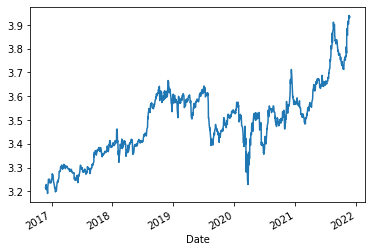

In [68]:
np.log(stk_data.loc[:, ('Adj Close', 'PFE')]).plot()

<AxesSubplot:xlabel='Date'>

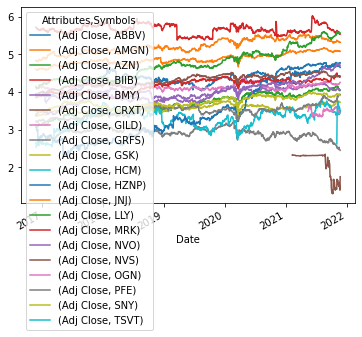

In [69]:
np.log(stk_data.loc[:, ('Adj Close', stk_tickers)]).plot()

In [70]:
#%matplotlib 

<ipython-input-71-415a31f2efe4>:17: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout(pad=5)


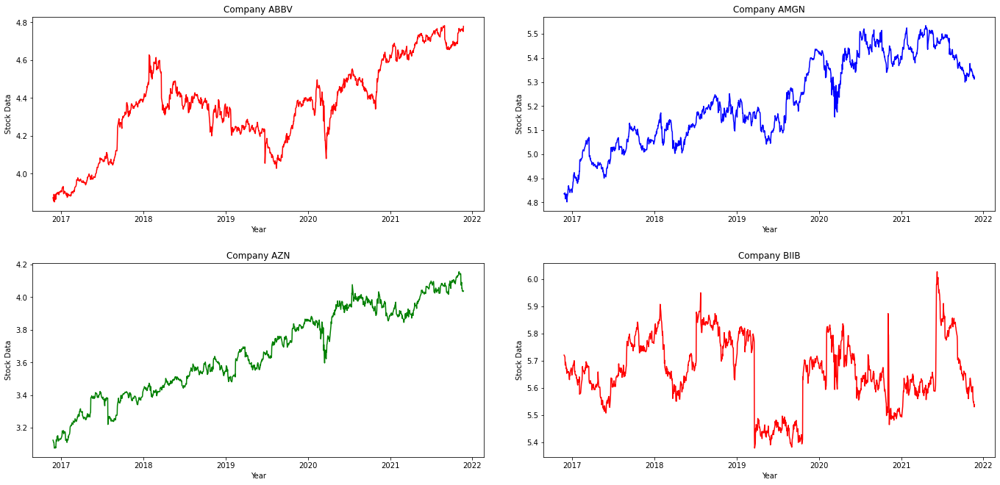

In [71]:
import matplotlib.pyplot as plt
# Tickers change
def test(to_plot,ax, r_count, c_count, c,s):
    #fig,ax = plt.subplots(1,2)
    #plt.subplot(1,2,2)
    #plt.plot(month, customer1, color="red", label="Customer 1", marker="o")
    ax[r_count,c_count].plot(p.index, p.values, color=c)
    ax[r_count,c_count].set_xlabel("Year")
    # ax[r_count,c_count].xticks(rotation=90)
    ax[r_count,c_count].set_ylabel("Stock Data")
    ax[r_count,c_count].set_title(f"Company {s}")
    #plt.show()

rows= 2
cols= 2    
fig,ax = plt.subplots(rows,cols, constrained_layout=True, figsize=(20,10))
fig.tight_layout(pad=5)
#fig.autofmt_xdate(rotation=90)
colors= ["red", "blue", "green"]
r_count=0
c_count=0

for i, s in enumerate(stk_tickers[:4]):
    p= np.log(stk_data.loc[:, ('Adj Close', s)])
    test(p, ax, r_count, c_count, colors[i%len(colors)], s)
    if c_count >= cols-1:
        c_count=0
        r_count+=1
    else:
        c_count+=1
#     print(i,s,p)
#     print(p.values)

#plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

<ipython-input-72-2c9713371a8b>:17: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout(pad=5)


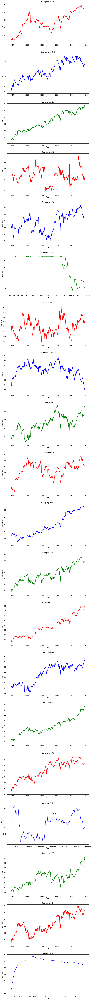

In [72]:
import matplotlib.pyplot as plt
# Tickers change
def test(to_plot,ax, i, c,s):
    #fig,ax = plt.subplots(1,2)
    #plt.subplot(1,2,2)
    #plt.plot(month, customer1, color="red", label="Customer 1", marker="o")
    ax[i].plot(p.index, p.values, color=c)
    ax[i].set_xlabel("Year")
    # ax[r_count,c_count].xticks(rotation=90)
    ax[i].set_ylabel("Stock Data")
    ax[i].set_title(f"Company {s}")
    #plt.show()

# rows= 2
# cols= 2    
fig,ax = plt.subplots(len(stk_tickers), 1, constrained_layout=True, figsize=(10,100))
fig.tight_layout(pad=5)
#fig.autofmt_xdate(rotation=90)
colors= ["red", "blue", "green"]
# r_count=0
# c_count=0

for i, s in enumerate(stk_tickers):
    p= np.log(stk_data.loc[:, ('Adj Close', s)])
    test(p, ax, i, colors[i%len(colors)], s)
#     if c_count >= cols-1:
#         c_count=0
#         r_count+=1
#     else:
#         c_count+=1
#     print(i,s,p)
#     print(p.values)

#plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

In [73]:
np.log(stk_data.loc[:, ('Adj Close', 'PFE')]).diff(5).shift(-5)
# Generate variable Y: is the weekly performance in t+1
#Shift -5: Gives the data plus 5 periods. The base for lower to higher times
# To make it supervised, shify -5 gives the data t+5 in t

Date
2016-11-25   -0.001895
2016-11-28    0.001584
2016-11-29   -0.011342
2016-11-30   -0.030004
2016-12-01   -0.016667
                ...   
2021-11-17         NaN
2021-11-18         NaN
2021-11-19         NaN
2021-11-22         NaN
2021-11-23         NaN
Name: (Adj Close, PFE), Length: 1258, dtype: float64

In [74]:
# This is for every ticker period

for i in stk_data:
     print(np.log(stk_data.loc[:, ('Adj Close', i)]).diff(5).shift(-5))

Attributes Adj Close
Symbols         ABBV
Date                
2016-11-25 -0.018009
2016-11-28  0.023273
2016-11-29  0.000487
2016-11-30 -0.013412
2016-12-01  0.028987
...              ...
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN
2021-11-22       NaN
2021-11-23       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols         AMGN
Date                
2016-11-25 -0.009812
2016-11-28  0.001515
2016-11-29 -0.006114
2016-11-30 -0.020193
2016-12-01 -0.012722
...              ...
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN
2021-11-22       NaN
2021-11-23       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols          AZN
Date                
2016-11-25 -0.045677
2016-11-28 -0.034637
2016-11-29 -0.026557
2016-11-30 -0.011156
2016-12-01  0.017666
...              ...
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN
2021-11-22       NaN
2021-11-23       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols         BIIB
D

Attributes Adj Close
Symbols         GILD
Date                
2016-11-25 -0.040856
2016-11-28 -0.029682
2016-11-29 -0.032581
2016-11-30 -0.012562
2016-12-01 -0.011321
...              ...
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN
2021-11-22       NaN
2021-11-23       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols         GRFS
Date                
2016-11-25 -0.024129
2016-11-28 -0.045901
2016-11-29 -0.059077
2016-11-30 -0.058227
2016-12-01 -0.031764
...              ...
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN
2021-11-22       NaN
2021-11-23       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols          GSK
Date                
2016-11-25 -0.030306
2016-11-28 -0.016325
2016-11-29 -0.015272
2016-11-30 -0.006371
2016-12-01 -0.001069
...              ...
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN
2021-11-22       NaN
2021-11-23       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols          HCM
D

Attributes Adj Close
Symbols          NVO
Date                
2016-11-25  0.056067
2016-11-28  0.056168
2016-11-29  0.074762
2016-11-30  0.046520
2016-12-01  0.041454
...              ...
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN
2021-11-22       NaN
2021-11-23       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols          NVS
Date                
2016-11-25 -0.020473
2016-11-28 -0.001594
2016-11-29  0.000000
2016-11-30 -0.002038
2016-12-01 -0.002365
...              ...
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN
2021-11-22       NaN
2021-11-23       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols          OGN
Date                
2016-11-25       NaN
2016-11-28       NaN
2016-11-29       NaN
2016-11-30       NaN
2016-12-01       NaN
...              ...
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN
2021-11-22       NaN
2021-11-23       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols          PFE
D

<AxesSubplot:xlabel='Date'>

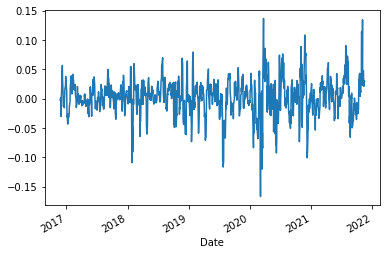

In [75]:
np.log(stk_data.loc[:, ('Adj Close', 'PFE')]).diff(5).shift(-5).plot()

<ipython-input-76-abf24140dc9a>:11: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout(pad=5)


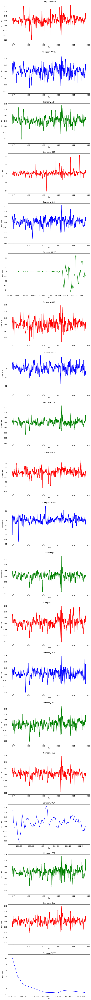

In [76]:
import matplotlib.pyplot as plt
# Tickers change
def test2(to_plot,ax, i, c,s):
    ax[i].plot(p.index, p.values, color=c)
    ax[i].set_xlabel("Year")
    ax[i].set_ylabel("Stock Data")
    ax[i].set_title(f"Company {s}")
    

fig,ax = plt.subplots(len(stk_tickers), 1, constrained_layout=True, figsize=(10,100))
fig.tight_layout(pad=5)
colors= ["red", "blue", "green"]

for i, s in enumerate(stk_tickers):
    p= np.log(stk_data.loc[:, ('Adj Close', s)]).diff(5).shift(-5)
    test2(p, ax, i, colors[i%len(colors)], s)
plt.show()

In [77]:
# All stocks stk_tickers
Y = np.log(stk_data.loc[:, ('Adj Close', stk_tickers)]).diff(return_period).shift(-return_period)

In [78]:
Y

Attributes Adj Close                                                         \
Symbols         ABBV      AMGN       AZN      BIIB       BMY CRXT      GILD   
Date                                                                          
2016-11-25 -0.018009 -0.009812 -0.045677 -0.026596 -0.018063  NaN -0.040856   
2016-11-28  0.023273  0.001515 -0.034637 -0.045664 -0.017134  NaN -0.029682   
2016-11-29  0.000487 -0.006114 -0.026557 -0.039100 -0.005873  NaN -0.032581   
2016-11-30 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491  NaN -0.012562   
2016-12-01  0.028987 -0.012722  0.017666 -0.021322 -0.010268  NaN -0.011321   
...              ...       ...       ...       ...       ...  ...       ...   
2021-11-17       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-18       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-19       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-22       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-23       NaN       NaN       NaN       NaN       NaN  NaN       NaN   

Attributes                                                              \
Symbols         GRFS       GSK       HCM      HZNP       JNJ       LLY   
Date                                                                     
2016-11-25 -0.024129 -0.030306  0.133134 -0.076868 -0.019197 -0.020610   
2016-11-28 -0.045901 -0.016325  0.134396 -0.073963 -0.010575  0.000892   
2016-11-29 -0.059077 -0.015272  0.139093 -0.040723 -0.003741  0.009634   
2016-11-30 -0.058227 -0.006371  0.066388 -0.020924 -0.001799  0.003866   
2016-12-01 -0.031764 -0.001069  0.061919 -0.256770 -0.003507  0.018324   
...              ...       ...       ...       ...       ...       ...   
2021-11-17       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-18       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-19       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-22       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-23       NaN       NaN       NaN       NaN       NaN       NaN   

Attributes                                                             
Symbols          MRK       NVO       NVS OGN       PFE       SNY TSVT  
Date                                                                   
2016-11-25 -0.017513  0.056067 -0.020473 NaN -0.001895  0.004508  NaN  
2016-11-28 -0.025401  0.056168 -0.001594 NaN  0.001584  0.029268  NaN  
2016-11-29 -0.031194  0.074762  0.000000 NaN -0.011342  0.005426  NaN  
2016-11-30 -0.018640  0.046520 -0.002038 NaN -0.030004  0.007929  NaN  
2016-12-01 -0.010589  0.041454 -0.002365 NaN -0.016667  0.001258  NaN  
...              ...       ...       ...  ..       ...       ...  ...  
2021-11-17       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-18       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-19       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-22       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-23       NaN       NaN       NaN NaN       NaN       NaN  NaN  

[1258 rows x 20 columns]

In [79]:
# Y.columns = Y.columns[-1]+'_pred'
#X = X.set_axis(X_colnames, axis=1, inplace=False)
list_names=[]
for i in range(0,len(Y.columns)):
    list_names.append(stk_tickers[i]+'_pred')
list_names

['ABBV_pred',
 'AMGN_pred',
 'AZN_pred',
 'BIIB_pred',
 'BMY_pred',
 'CRXT_pred',
 'GILD_pred',
 'GRFS_pred',
 'GSK_pred',
 'HCM_pred',
 'HZNP_pred',
 'JNJ_pred',
 'LLY_pred',
 'MRK_pred',
 'NVO_pred',
 'NVS_pred',
 'OGN_pred',
 'PFE_pred',
 'SNY_pred',
 'TSVT_pred']

In [80]:
Y = Y.set_axis(list_names, axis=1, inplace=False)
Y

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,HZNP_pred,JNJ_pred,LLY_pred,MRK_pred,NVO_pred,NVS_pred,OGN_pred,PFE_pred,SNY_pred,TSVT_pred
Date,,,,,,,,,,,,,,,,,,,,
2016-11-25,-0.018009,-0.009812,-0.045677,-0.026596,-0.018063,NaN,-0.040856,-0.024129,-0.030306,0.133134,-0.076868,-0.019197,-0.020610,-0.017513,0.056067,-0.020473,NaN,-0.001895,0.004508,NaN
2016-11-28,0.023273,0.001515,-0.034637,-0.045664,-0.017134,NaN,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000892,-0.025401,0.056168,-0.001594,NaN,0.001584,0.029268,NaN
2016-11-29,0.000487,-0.006114,-0.026557,-0.039100,-0.005873,NaN,-0.032581,-0.059077,-0.015272,0.139093,-0.040723,-0.003741,0.009634,-0.031194,0.074762,0.000000,NaN,-0.011342,0.005426,NaN
2016-11-30,-0.013412,-0.020193,-0.011156,-0.030277,-0.021491,NaN,-0.012562,-0.058227,-0.006371,0.066388,-0.020924,-0.001799,0.003866,-0.018640,0.046520,-0.002038,NaN,-0.030004,0.007929,NaN
2016-12-01,0.028987,-0.012722,0.017666,-0.021322,-0.010268,NaN,-0.011321,-0.031764,-0.001069,0.061919,-0.256770,-0.003507,0.018324,-0.010589,0.041454,-0.002365,NaN,-0.016667,0.001258,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [81]:
Y

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,HZNP_pred,JNJ_pred,LLY_pred,MRK_pred,NVO_pred,NVS_pred,OGN_pred,PFE_pred,SNY_pred,TSVT_pred
Date,,,,,,,,,,,,,,,,,,,,
2016-11-25,-0.018009,-0.009812,-0.045677,-0.026596,-0.018063,NaN,-0.040856,-0.024129,-0.030306,0.133134,-0.076868,-0.019197,-0.020610,-0.017513,0.056067,-0.020473,NaN,-0.001895,0.004508,NaN
2016-11-28,0.023273,0.001515,-0.034637,-0.045664,-0.017134,NaN,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000892,-0.025401,0.056168,-0.001594,NaN,0.001584,0.029268,NaN
2016-11-29,0.000487,-0.006114,-0.026557,-0.039100,-0.005873,NaN,-0.032581,-0.059077,-0.015272,0.139093,-0.040723,-0.003741,0.009634,-0.031194,0.074762,0.000000,NaN,-0.011342,0.005426,NaN
2016-11-30,-0.013412,-0.020193,-0.011156,-0.030277,-0.021491,NaN,-0.012562,-0.058227,-0.006371,0.066388,-0.020924,-0.001799,0.003866,-0.018640,0.046520,-0.002038,NaN,-0.030004,0.007929,NaN
2016-12-01,0.028987,-0.012722,0.017666,-0.021322,-0.010268,NaN,-0.011321,-0.031764,-0.001069,0.061919,-0.256770,-0.003507,0.018324,-0.010589,0.041454,-0.002365,NaN,-0.016667,0.001258,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [82]:
X1 = np.log(stk_data.loc[:, ('Adj Close', stk_tickers)]).diff(return_period)
X1.columns = X1.columns.droplevel()

In [83]:
X1

Symbols,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,HZNP,JNJ,LLY,MRK,NVO,NVS,OGN,PFE,SNY,TSVT
Date,,,,,,,,,,,,,,,,,,,,
2016-11-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-17,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,-0.001017,-0.006045,-0.009957,-0.016926,0.014970,-0.015388,-0.105876,0.037045,-0.006449,-0.128452
2021-11-18,0.003766,-0.027930,-0.103914,-0.037378,-0.002537,-0.006403,0.005325,0.000830,-0.028474,-0.014180,-0.008916,-0.004056,-0.001721,-0.011612,0.014183,-0.010558,-0.094159,0.024216,-0.027135,-0.140412
2021-11-19,-0.006261,-0.017080,-0.037073,-0.050198,-0.027291,-0.061830,0.017772,-0.008382,-0.029310,-0.010685,-0.024695,-0.012931,0.004036,-0.040078,0.006785,-0.010113,-0.066578,0.021288,-0.002761,-0.059876


In [84]:
X2 = np.log(ccy_data).diff(return_period)

In [85]:
X2

,DEXJPUS,DEXUSUK
DATE,,
2016-11-24,NaN,NaN
2016-11-25,NaN,NaN
2016-11-28,NaN,NaN
2016-11-29,NaN,NaN
2016-11-30,NaN,NaN
...,...,...
2021-11-15,0.007133,-0.008813
2021-11-16,0.015386,-0.009044
2021-11-17,0.003856,0.001335


In [86]:
X3 = np.log(idx_data).diff(return_period)

In [87]:
X3

,SP500,DJIA,VIXCLS
DATE,,,
2016-11-24,NaN,NaN,NaN
2016-11-25,NaN,NaN,NaN
2016-11-28,NaN,NaN,NaN
2016-11-29,NaN,NaN,NaN
2016-11-30,NaN,NaN,NaN
...,...,...,...
2021-11-17,0.008990,-0.004135,-0.090463
2021-11-18,0.011818,-0.001401,-0.003972
2021-11-19,0.003221,-0.013900,0.094808


In [88]:
# Generates lags by a week, 3 weeks, 6 weeks, and 12 weeks 
X4=[]
for i in stk_tickers:
    temp = pd.concat([np.log(stk_data.loc[:, ('Adj Close', i)]).diff(j)
               for j in [return_period, return_period*3,return_period*6, return_period*12]], axis=1).dropna()
    X4.append(temp)

In [89]:
# Rename columns
for i in range(0,len(X4)):
    X4[i].columns= X4[i].columns.droplevel()
    X4[i].index.name = None
    X4[i].columns = [f'{stk_tickers[i]}_DT', f'{stk_tickers[i]}_3DT', f'{stk_tickers[i]}_6DT', f'{stk_tickers[i]}_12DT']

In [90]:
X4[0].head()

,ABBV_DT,ABBV_3DT,ABBV_6DT,ABBV_12DT
2017-02-23,0.004693,0.017097,-0.023771,0.033397
2017-02-24,0.009873,0.019516,0.015419,0.053321
2017-02-27,0.007259,0.025227,0.015223,0.020216
2017-02-28,0.000162,0.019431,-0.002423,0.027000
2017-03-01,0.023675,0.036798,0.015559,0.070226


In [91]:
temp2 = X4[0]
temp2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1198 entries, 2017-02-23 to 2021-11-23
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ABBV_DT    1198 non-null   float64
 1   ABBV_3DT   1198 non-null   float64
 2   ABBV_6DT   1198 non-null   float64
 3   ABBV_12DT  1198 non-null   float64
dtypes: float64(4)
memory usage: 46.8 KB


In [92]:
# TEST 2
temp3= pd.DataFrame()
temp2= pd.DataFrame()
for i in range(0,len(X4)):
    temp2= X4[i]
    temp3= pd.concat([temp3,temp2], axis=1)
#     temp2 = pd.concat(temp2, X4[i], axis=1)


In [93]:
X4 = temp3
X4.head()

,ABBV_DT,ABBV_3DT,ABBV_6DT,ABBV_12DT,AMGN_DT,AMGN_3DT,AMGN_6DT,AMGN_12DT,AZN_DT,AZN_3DT,...,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT,TSVT_DT,TSVT_3DT,TSVT_6DT,TSVT_12DT
2017-02-23,0.004693,0.017097,-0.023771,0.033397,0.012840,0.092877,0.098592,0.186291,0.022966,0.093765,...,0.028507,0.082259,-0.019567,0.039098,0.034948,0.064868,NaN,NaN,NaN,NaN
2017-02-24,0.009873,0.019516,0.015419,0.053321,0.014135,0.096596,0.115319,0.191926,0.020307,0.095559,...,0.052772,0.092858,-0.019481,0.052650,0.045762,0.072092,NaN,NaN,NaN,NaN
2017-02-27,0.007259,0.025227,0.015223,0.020216,0.016256,0.056933,0.132351,0.194489,0.007176,0.083262,...,0.060386,0.081466,-0.005576,0.054831,0.055077,0.059519,NaN,NaN,NaN,NaN
2017-02-28,0.000162,0.019431,-0.002423,0.027000,0.019390,0.064889,0.129739,0.210065,0.008581,0.073440,...,0.058165,0.069919,0.008616,0.059466,0.039249,0.070352,NaN,NaN,NaN,NaN
2017-03-01,0.023675,0.036798,0.015559,0.070226,0.032096,0.073089,0.147870,0.231434,0.013737,0.069455,...,0.081165,0.100057,0.022326,0.077191,0.059705,0.090446,NaN,NaN,NaN,NaN


In [94]:
X4

,ABBV_DT,ABBV_3DT,ABBV_6DT,ABBV_12DT,AMGN_DT,AMGN_3DT,AMGN_6DT,AMGN_12DT,AZN_DT,AZN_3DT,...,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT,TSVT_DT,TSVT_3DT,TSVT_6DT,TSVT_12DT
2017-02-23,0.004693,0.017097,-0.023771,0.033397,0.012840,0.092877,0.098592,0.186291,0.022966,0.093765,...,0.028507,0.082259,-0.019567,0.039098,0.034948,0.064868,NaN,NaN,NaN,NaN
2017-02-24,0.009873,0.019516,0.015419,0.053321,0.014135,0.096596,0.115319,0.191926,0.020307,0.095559,...,0.052772,0.092858,-0.019481,0.052650,0.045762,0.072092,NaN,NaN,NaN,NaN
2017-02-27,0.007259,0.025227,0.015223,0.020216,0.016256,0.056933,0.132351,0.194489,0.007176,0.083262,...,0.060386,0.081466,-0.005576,0.054831,0.055077,0.059519,NaN,NaN,NaN,NaN
2017-02-28,0.000162,0.019431,-0.002423,0.027000,0.019390,0.064889,0.129739,0.210065,0.008581,0.073440,...,0.058165,0.069919,0.008616,0.059466,0.039249,0.070352,NaN,NaN,NaN,NaN
2017-03-01,0.023675,0.036798,0.015559,0.070226,0.032096,0.073089,0.147870,0.231434,0.013737,0.069455,...,0.081165,0.100057,0.022326,0.077191,0.059705,0.090446,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-17,0.005126,0.079333,0.082932,-0.007610,-0.026915,0.004675,-0.011650,-0.077978,-0.089578,-0.067641,...,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335,NaN,NaN,NaN,NaN
2021-11-18,0.003766,0.065296,0.066464,-0.015997,-0.027930,-0.006961,-0.016330,-0.074250,-0.103914,-0.092244,...,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587,NaN,NaN,NaN,NaN
2021-11-19,-0.006261,0.013599,0.056557,-0.023112,-0.017080,0.004051,-0.005470,-0.063662,-0.037073,-0.096176,...,0.188309,0.078436,-0.002761,0.003958,0.032520,-0.023618,NaN,NaN,NaN,NaN
2021-11-22,-0.010237,0.007290,0.059053,-0.021367,-0.022774,-0.025871,-0.011033,-0.085949,-0.055546,-0.099401,...,0.205382,0.102879,-0.022362,-0.026268,0.026155,-0.036546,NaN,NaN,NaN,NaN


In [95]:
X = pd.concat([X1, X2, X3, X4], axis=1)

In [96]:
len(X)

1304

In [97]:
X=X.dropna(axis=1, how='all')

In [98]:
X

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-17,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,...,-0.003635,-0.006353,0.037045,0.177511,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335
2021-11-18,0.003766,-0.027930,-0.103914,-0.037378,-0.002537,-0.006403,0.005325,0.000830,-0.028474,-0.014180,...,-0.038490,-0.052400,0.024216,0.183195,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587
2021-11-19,-0.006261,-0.017080,-0.037073,-0.050198,-0.027291,-0.061830,0.017772,-0.008382,-0.029310,-0.010685,...,-0.032472,-0.074264,0.021288,0.158373,0.188309,0.078436,-0.002761,0.003958,0.032520,-0.023618
2021-11-22,-0.010237,-0.022774,-0.055546,-0.074878,-0.044238,-0.105111,0.040393,-0.012761,-0.032158,0.081105,...,-0.039529,-0.070364,0.030741,0.168505,0.205382,0.102879,-0.022362,-0.026268,0.026155,-0.036546


In [99]:
X_colnames=X.columns
X_colnames

Index(['ABBV', 'AMGN', 'AZN', 'BIIB', 'BMY', 'CRXT', 'GILD', 'GRFS', 'GSK',
       'HCM',
       ...
       'OGN_6DT', 'OGN_12DT', 'PFE_DT', 'PFE_3DT', 'PFE_6DT', 'PFE_12DT',
       'SNY_DT', 'SNY_3DT', 'SNY_6DT', 'SNY_12DT'],
      dtype='object', length=101)

In [100]:
X_rows= X.axes[0].tolist()
X_rows

[Timestamp('2016-11-24 00:00:00', freq='B'),
 Timestamp('2016-11-25 00:00:00', freq='B'),
 Timestamp('2016-11-28 00:00:00', freq='B'),
 Timestamp('2016-11-29 00:00:00', freq='B'),
 Timestamp('2016-11-30 00:00:00', freq='B'),
 Timestamp('2016-12-01 00:00:00', freq='B'),
 Timestamp('2016-12-02 00:00:00', freq='B'),
 Timestamp('2016-12-05 00:00:00', freq='B'),
 Timestamp('2016-12-06 00:00:00', freq='B'),
 Timestamp('2016-12-07 00:00:00', freq='B'),
 Timestamp('2016-12-08 00:00:00', freq='B'),
 Timestamp('2016-12-09 00:00:00', freq='B'),
 Timestamp('2016-12-12 00:00:00', freq='B'),
 Timestamp('2016-12-13 00:00:00', freq='B'),
 Timestamp('2016-12-14 00:00:00', freq='B'),
 Timestamp('2016-12-15 00:00:00', freq='B'),
 Timestamp('2016-12-16 00:00:00', freq='B'),
 Timestamp('2016-12-19 00:00:00', freq='B'),
 Timestamp('2016-12-20 00:00:00', freq='B'),
 Timestamp('2016-12-21 00:00:00', freq='B'),
 Timestamp('2016-12-22 00:00:00', freq='B'),
 Timestamp('2016-12-23 00:00:00', freq='B'),
 Timestamp

In [101]:
Y_colnames=Y.columns
Y_colnames

Index(['ABBV_pred', 'AMGN_pred', 'AZN_pred', 'BIIB_pred', 'BMY_pred',
       'CRXT_pred', 'GILD_pred', 'GRFS_pred', 'GSK_pred', 'HCM_pred',
       'HZNP_pred', 'JNJ_pred', 'LLY_pred', 'MRK_pred', 'NVO_pred', 'NVS_pred',
       'OGN_pred', 'PFE_pred', 'SNY_pred', 'TSVT_pred'],
      dtype='object')

In [102]:
Y_rows= Y.axes[0].tolist()
Y_rows

[Timestamp('2016-11-25 00:00:00'),
 Timestamp('2016-11-28 00:00:00'),
 Timestamp('2016-11-29 00:00:00'),
 Timestamp('2016-11-30 00:00:00'),
 Timestamp('2016-12-01 00:00:00'),
 Timestamp('2016-12-02 00:00:00'),
 Timestamp('2016-12-05 00:00:00'),
 Timestamp('2016-12-06 00:00:00'),
 Timestamp('2016-12-07 00:00:00'),
 Timestamp('2016-12-08 00:00:00'),
 Timestamp('2016-12-09 00:00:00'),
 Timestamp('2016-12-12 00:00:00'),
 Timestamp('2016-12-13 00:00:00'),
 Timestamp('2016-12-14 00:00:00'),
 Timestamp('2016-12-15 00:00:00'),
 Timestamp('2016-12-16 00:00:00'),
 Timestamp('2016-12-19 00:00:00'),
 Timestamp('2016-12-20 00:00:00'),
 Timestamp('2016-12-21 00:00:00'),
 Timestamp('2016-12-22 00:00:00'),
 Timestamp('2016-12-23 00:00:00'),
 Timestamp('2016-12-27 00:00:00'),
 Timestamp('2016-12-28 00:00:00'),
 Timestamp('2016-12-29 00:00:00'),
 Timestamp('2016-12-30 00:00:00'),
 Timestamp('2017-01-03 00:00:00'),
 Timestamp('2017-01-04 00:00:00'),
 Timestamp('2017-01-05 00:00:00'),
 Timestamp('2017-01-

In [103]:
# Missing data
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy="mean")
imputer.fit(X)
X= imputer.transform(X)
Y= imputer.fit_transform(Y)

# X_imputed_df = pd.DataFrame(X_imputed, columns = X_train.columns)

In [104]:
X= pd.DataFrame(X)

In [105]:
X

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
0,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
1,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
3,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
4,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1299,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,...,-0.003635,-0.006353,0.037045,0.177511,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335
1300,0.003766,-0.027930,-0.103914,-0.037378,-0.002537,-0.006403,0.005325,0.000830,-0.028474,-0.014180,...,-0.038490,-0.052400,0.024216,0.183195,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587
1301,-0.006261,-0.017080,-0.037073,-0.050198,-0.027291,-0.061830,0.017772,-0.008382,-0.029310,-0.010685,...,-0.032472,-0.074264,0.021288,0.158373,0.188309,0.078436,-0.002761,0.003958,0.032520,-0.023618
1302,-0.010237,-0.022774,-0.055546,-0.074878,-0.044238,-0.105111,0.040393,-0.012761,-0.032158,0.081105,...,-0.039529,-0.070364,0.030741,0.168505,0.205382,0.102879,-0.022362,-0.026268,0.026155,-0.036546


In [106]:
Y= pd.DataFrame(Y)

In [107]:
Y

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.018009,-0.009812,-0.045677,-0.026596,-0.018063,-0.019701,-0.040856,-0.024129,-0.030306,0.133134,-0.076868,-0.019197,-0.020610,-0.017513,0.056067,-0.020473,-0.004308,-0.001895,0.004508,0.083126
1,0.023273,0.001515,-0.034637,-0.045664,-0.017134,-0.019701,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000892,-0.025401,0.056168,-0.001594,-0.004308,0.001584,0.029268,0.083126
2,0.000487,-0.006114,-0.026557,-0.039100,-0.005873,-0.019701,-0.032581,-0.059077,-0.015272,0.139093,-0.040723,-0.003741,0.009634,-0.031194,0.074762,0.000000,-0.004308,-0.011342,0.005426,0.083126
3,-0.013412,-0.020193,-0.011156,-0.030277,-0.021491,-0.019701,-0.012562,-0.058227,-0.006371,0.066388,-0.020924,-0.001799,0.003866,-0.018640,0.046520,-0.002038,-0.004308,-0.030004,0.007929,0.083126
4,0.028987,-0.012722,0.017666,-0.021322,-0.010268,-0.019701,-0.011321,-0.031764,-0.001069,0.061919,-0.256770,-0.003507,0.018324,-0.010589,0.041454,-0.002365,-0.004308,-0.016667,0.001258,0.083126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1253,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,0.006564,0.001961,0.005840,0.001942,0.005336,0.001845,-0.004308,0.002859,0.001701,0.083126
1254,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,0.006564,0.001961,0.005840,0.001942,0.005336,0.001845,-0.004308,0.002859,0.001701,0.083126
1255,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,0.006564,0.001961,0.005840,0.001942,0.005336,0.001845,-0.004308,0.002859,0.001701,0.083126
1256,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,0.006564,0.001961,0.005840,0.001942,0.005336,0.001845,-0.004308,0.002859,0.001701,0.083126


In [108]:
# test = pd.DataFrame(X, index=X_rows, columns=X_colnames)

X = X.set_axis(X_colnames, axis=1, inplace=False)
X = X.set_axis(X_rows, axis=0, inplace=False)
X

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-24,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-11-25,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-11-28,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-11-29,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-11-30,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-17,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,...,-0.003635,-0.006353,0.037045,0.177511,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335
2021-11-18,0.003766,-0.027930,-0.103914,-0.037378,-0.002537,-0.006403,0.005325,0.000830,-0.028474,-0.014180,...,-0.038490,-0.052400,0.024216,0.183195,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587
2021-11-19,-0.006261,-0.017080,-0.037073,-0.050198,-0.027291,-0.061830,0.017772,-0.008382,-0.029310,-0.010685,...,-0.032472,-0.074264,0.021288,0.158373,0.188309,0.078436,-0.002761,0.003958,0.032520,-0.023618
2021-11-22,-0.010237,-0.022774,-0.055546,-0.074878,-0.044238,-0.105111,0.040393,-0.012761,-0.032158,0.081105,...,-0.039529,-0.070364,0.030741,0.168505,0.205382,0.102879,-0.022362,-0.026268,0.026155,-0.036546


In [109]:
Y = Y.set_axis(Y_colnames, axis=1, inplace=False)
Y = Y.set_axis(Y_rows, axis=0, inplace=False)
Y

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,HZNP_pred,JNJ_pred,LLY_pred,MRK_pred,NVO_pred,NVS_pred,OGN_pred,PFE_pred,SNY_pred,TSVT_pred
2016-11-25,-0.018009,-0.009812,-0.045677,-0.026596,-0.018063,-0.019701,-0.040856,-0.024129,-0.030306,0.133134,-0.076868,-0.019197,-0.020610,-0.017513,0.056067,-0.020473,-0.004308,-0.001895,0.004508,0.083126
2016-11-28,0.023273,0.001515,-0.034637,-0.045664,-0.017134,-0.019701,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000892,-0.025401,0.056168,-0.001594,-0.004308,0.001584,0.029268,0.083126
2016-11-29,0.000487,-0.006114,-0.026557,-0.039100,-0.005873,-0.019701,-0.032581,-0.059077,-0.015272,0.139093,-0.040723,-0.003741,0.009634,-0.031194,0.074762,0.000000,-0.004308,-0.011342,0.005426,0.083126
2016-11-30,-0.013412,-0.020193,-0.011156,-0.030277,-0.021491,-0.019701,-0.012562,-0.058227,-0.006371,0.066388,-0.020924,-0.001799,0.003866,-0.018640,0.046520,-0.002038,-0.004308,-0.030004,0.007929,0.083126
2016-12-01,0.028987,-0.012722,0.017666,-0.021322,-0.010268,-0.019701,-0.011321,-0.031764,-0.001069,0.061919,-0.256770,-0.003507,0.018324,-0.010589,0.041454,-0.002365,-0.004308,-0.016667,0.001258,0.083126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-17,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,0.006564,0.001961,0.005840,0.001942,0.005336,0.001845,-0.004308,0.002859,0.001701,0.083126
2021-11-18,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,0.006564,0.001961,0.005840,0.001942,0.005336,0.001845,-0.004308,0.002859,0.001701,0.083126
2021-11-19,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,0.006564,0.001961,0.005840,0.001942,0.005336,0.001845,-0.004308,0.002859,0.001701,0.083126
2021-11-22,0.003563,0.001962,0.003749,-0.000641,0.000714,-0.019701,0.000401,-0.000623,0.001394,0.003478,0.006564,0.001961,0.005840,0.001942,0.005336,0.001845,-0.004308,0.002859,0.001701,0.083126


In [110]:
# "Starts:finishes:leaps" 
# This will leave just weeks
dataset = pd.concat([Y, X], axis=1).dropna().iloc[::return_period, :]

In [111]:
dataset
# Now only 225 observations (just weeks)

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-25,-0.018009,-0.009812,-0.045677,-0.026596,-0.018063,-0.019701,-0.040856,-0.024129,-0.030306,0.133134,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-12-02,0.034888,-0.003896,0.047889,-0.032210,0.019115,-0.019701,0.003859,-0.007987,0.002384,-0.025389,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-12-09,0.010989,0.040440,0.025447,-0.004772,0.027323,-0.019701,0.025492,0.049945,0.019652,0.002141,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-12-16,0.001927,-0.012259,-0.019939,0.003938,0.016747,-0.019701,-0.006227,0.020305,-0.004942,-0.012552,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-12-23,0.001122,0.021323,0.014541,0.014433,-0.002688,-0.019701,0.007037,0.011243,0.012696,0.076065,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-22,0.049427,-0.010908,0.009503,0.007075,0.013793,-0.007186,-0.035729,-0.048391,0.062383,-0.089360,...,0.051205,0.207079,0.039462,0.005343,-0.054774,0.008610,0.021667,0.041306,0.032576,-0.031742
2021-10-29,0.021653,0.032327,0.011318,0.044015,0.017820,0.203725,0.021952,-0.070301,0.027035,0.017855,...,0.076896,0.225961,0.013349,0.029936,-0.003423,-0.029732,0.010165,0.028562,0.041500,-0.002575
2021-11-05,-0.001794,-0.011196,-0.070420,-0.030051,-0.000336,-0.088081,0.017340,-0.019835,-0.002994,0.036069,...,0.074066,0.087966,0.114306,0.167116,0.109744,0.037328,0.016910,0.048741,0.067546,-0.000390
2021-11-12,-0.006261,-0.017080,-0.037073,-0.050198,-0.027291,-0.061830,0.017772,-0.008382,-0.029310,-0.010685,...,0.011040,-0.003554,0.022779,0.150434,0.155777,0.027618,-0.010190,0.016884,0.058190,-0.033317


In [112]:
Y = dataset.loc[:,Y.columns]

In [113]:
X = dataset.loc[:, X.columns]

In [114]:
dataset.head()

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-25,-0.018009,-0.009812,-0.045677,-0.026596,-0.018063,-0.019701,-0.040856,-0.024129,-0.030306,0.133134,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-12-02,0.034888,-0.003896,0.047889,-0.032210,0.019115,-0.019701,0.003859,-0.007987,0.002384,-0.025389,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-12-09,0.010989,0.040440,0.025447,-0.004772,0.027323,-0.019701,0.025492,0.049945,0.019652,0.002141,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-12-16,0.001927,-0.012259,-0.019939,0.003938,0.016747,-0.019701,-0.006227,0.020305,-0.004942,-0.012552,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858
2016-12-23,0.001122,0.021323,0.014541,0.014433,-0.002688,-0.019701,0.007037,0.011243,0.012696,0.076065,...,0.067354,0.078586,0.002713,0.007977,0.014573,0.028183,0.001469,0.004891,0.009892,0.019858


In [116]:
# Correlation matrix with all tickers
correlation = dataset.corr()
pyplot.figure(figsize=(150,150))
pyplot.title('Correlation Matrix')
sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='cubehelix')
plt.savefig("../readme_images/All_correlation_matrix150.png")

FileNotFoundError: [Errno 2] No such file or directory: '../readme_images/All_correlation_matrix150.png'

In [ ]:
# Plot all tickers
for i in stk_tickers:
    temp = dataset.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
    temp2 = dataset.filter(regex=i, axis=1)
    temp3 = pd.concat([temp, temp2], axis=1)
    
    correlation = temp3.corr()
    pyplot.figure(figsize=(15,15))
    pyplot.title('Correlation Matrix')
    sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='cubehelix')
    plt.savefig(f"../readme_images/{i}_correlation_matrix.png")

In [ ]:
# Plot all tickers
for i in stk_tickers:
    temp = dataset.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
    temp2 = dataset.filter(regex=i, axis=1)
    temp3 = pd.concat([temp, temp2], axis=1)
    
    pyplot.figure(figsize=(15,15))
    scatter_matrix(temp3,figsize=(12,12))
    plt.savefig(f"../readme_images/{i}_scatter_matrix.png")
    pyplot.show()    

In [ ]:
# ALL
# pyplot.figure(figsize=(150,150))
# scatter_matrix(dataset,figsize=(120,120))
# plt.savefig(f"../readme_images/scatter_matrix_all.png")
# pyplot.show()

#sns.set_theme(style="ticks")
# sns.pairplot(dataset, hue="tickers", palette="Set2", diag_kind="kde")
# plt.savefig(f"../readme_images/scatter_matrix_all.png")

g= sns.PairGrid(dataset, hue="ticker")
g.map_diag(sns.histoplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
plt.savefig(f"../readme_images/scatter_matrix_all.png")

FileNotFoundError: [Errno 2] No such file or directory: '../readme_images/ABBV_seasonality.png'

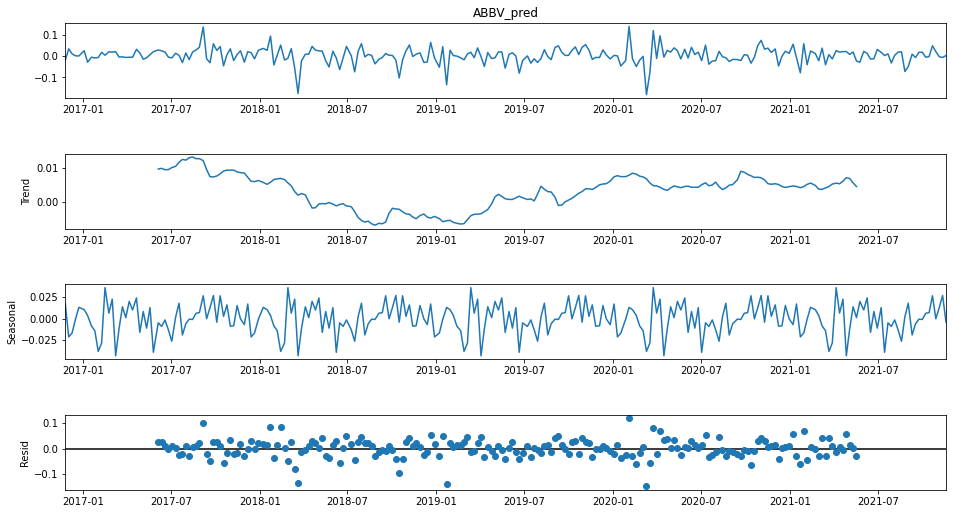

In [117]:
# Seasonality
for i in stk_tickers:
    res = sm.tsa.seasonal_decompose(Y.loc[:,i+'_pred'],period=52)
    fig = res.plot()
    fig.set_figheight(8)
    fig.set_figwidth(15)
    plt.savefig(f"../readme_images/{i}_seasonality.png")
    pyplot.show()

In [57]:
validation_size = 0.2
train_size = int(len(X) * (1-validation_size))
X_train, X_test = X[0:train_size], X[train_size:len(X)]
Y_train, Y_test = Y[0:train_size], Y[train_size:len(X)]

In [58]:
num_folds = 10
scoring = 'neg_mean_squared_error'

In [59]:
# Without the tuning hyperparameters
models = []
#models.append(('LR', LinearRegression()))
models.append(('LASSO', Lasso()))
models.append(('EN', ElasticNet()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('SVR', SVR()))

In [60]:
models.append(('MLP', MLPRegressor()))
# Boosting methods
models.append(('ABR', AdaBoostRegressor()))
models.append(('GBR', GradientBoostingRegressor())) 
# Bagging methods
models.append(('RFR', RandomForestRegressor()))
models.append(('ETR', ExtraTreesRegressor()))

In [61]:
from random import seed

In [62]:
import warnings
warnings.filterwarnings("ignore")

In [63]:
seed(1)

In [66]:
# for i in stk_tickers:
#     X_temp = X_train.filter(regex=i, axis=1)
#     Y_temp = Y_train.filter(regex=i, axis=1)
#     X_temp_test = X_test.filter(regex=i, axis=1)
#     Y_temp_test = Y_test.filter(regex=i, axis=1)
    
#     names = []
    
#     kfold_results = [] 
#     test_results = [] 
#     train_results = []
#     for name, model in models:
#         names.append(name)
#         ## k-fold analysis:
#         kfold = KFold(n_splits=num_folds)
#         #converted mean squared error to positive. The lower the better
#         cv_results = -1* cross_val_score(model, X_temp, Y_temp, cv=kfold, scoring=scoring)
#         kfold_results.append(cv_results)
#         # Full Training period
#         res = model.fit(X_temp, Y_temp)
#         train_result = mean_squared_error(res.predict(X_temp), Y_temp) 
#         train_results.append(train_result)
#         # Test results
#         test_result = mean_squared_error(res.predict(X_temp_test), Y_temp_test) 
#         test_results.append(test_result)
#     for j in range(0,1):
#         fig = pyplot.figure()
#         fig.suptitle(f'Algorithm Comparison: Kfold results {i}')
#         ax = fig.add_subplot(111)
#         pyplot.boxplot(kfold_results)
#         ax.set_xticklabels(names)
#         fig.set_size_inches(15,8)
#         pyplot.show()
#     for k in range(0,1):
#         fig = pyplot.figure()
#         ind = np.arange(len(names)) # the x locations for the groups
#         width = 0.35 # the width of the bars
#         fig.suptitle(f'Algorithm Comparison {i}')
#         ax = fig.add_subplot(111)
#         pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
#         pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
#         fig.set_size_inches(15,8)
#         pyplot.legend()
#         ax.set_xticks(ind)
#         ax.set_xticklabels(names)
#         pyplot.show()
    

In [64]:
#stk_idx_coin_tickers = stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']
#X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
X_test

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2020-11-19,0.020987,-0.047248,-0.050701,0.010133,-0.010574,-0.020242,0.010779,0.016798,-0.016291,-0.020505,...,0.070321,0.082645,0.015702,0.088291,0.043666,0.012706,-0.003140,0.111538,0.010273,-0.015020
2020-11-27,0.051048,0.000623,-0.026633,-0.000943,0.015343,-0.020242,-0.009945,-0.027442,-0.001886,0.041230,...,0.070321,0.082645,0.028332,0.075413,0.081258,0.063630,0.004902,0.015770,0.023149,0.012992
2020-12-04,0.022530,0.019383,0.021251,0.008537,-0.011806,-0.020242,0.025168,0.007994,0.011533,-0.081490,...,0.070321,0.082645,0.080229,0.124263,0.137695,0.186419,-0.001958,-0.000196,0.042023,0.006488
2020-12-11,-0.008801,-0.007928,0.009814,-0.018223,-0.025849,-0.020242,-0.013081,-0.005322,0.002397,-0.036609,...,0.070321,0.082645,0.019151,0.127712,0.216003,0.173277,-0.064761,-0.061817,0.049721,-0.084936
2020-12-18,-0.017933,0.004782,-0.077757,0.033360,0.038765,-0.020242,-0.016785,0.040267,-0.015550,0.009542,...,0.070321,0.082645,-0.087365,0.012014,0.087428,0.115123,0.006045,-0.060674,-0.044903,-0.054002
2020-12-28,-0.009620,-0.021410,-0.016669,-0.022157,-0.032199,-0.020242,-0.037773,-0.056405,-0.019646,-0.006351,...,0.070321,0.082645,-0.023088,-0.091302,0.032960,0.075121,-0.003956,-0.062672,-0.062868,-0.041481
2021-01-05,0.029057,0.018210,0.026380,0.009133,0.014956,-0.020242,0.053225,0.020929,0.037587,0.256767,...,0.070321,0.082645,0.009999,-0.100455,0.027257,0.070923,0.016758,0.018847,-0.042970,-0.032697
2021-01-12,0.030333,0.038036,-0.008120,0.081793,0.061131,-0.020242,0.034079,0.016329,-0.005856,-0.051985,...,0.070321,0.082645,-0.000269,-0.013358,-0.001344,0.079914,-0.008034,0.004768,-0.055905,-0.032756
2021-01-20,0.037169,0.064528,0.038042,0.010750,0.012455,-0.020242,0.090937,0.006769,0.014839,-0.043626,...,0.070321,0.082645,-0.018459,-0.008729,-0.100031,0.037664,0.031755,0.040480,-0.022192,0.019831
2021-01-27,-0.091331,-0.005165,-0.002684,-0.019163,-0.065979,-0.020242,-0.037616,-0.048920,0.004200,-0.056397,...,0.070321,0.082645,-0.007149,-0.025876,-0.126331,0.089672,-0.053077,-0.029356,-0.010509,0.039212


In [65]:
X

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-22,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-11-30,0.031240,-0.001803,-0.011033,-0.078579,-0.001947,-0.020242,-0.010259,0.012230,-0.006594,0.097842,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-07,-0.013412,-0.020193,-0.011156,-0.030277,-0.021491,-0.020242,-0.012562,-0.058226,-0.006371,0.066388,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-14,0.027620,0.051757,0.054210,0.003324,0.057340,-0.020242,0.045887,0.002058,0.010860,-0.002030,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-21,-0.003574,-0.017093,-0.008464,-0.011030,0.003243,-0.020242,-0.023386,0.074597,0.004469,-0.052864,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-20,0.010944,0.029281,0.002973,-0.062104,0.017371,-0.070479,-0.011451,-0.005772,0.016867,0.002485,...,0.022339,0.213650,0.032774,-0.016912,-0.083129,0.025507,0.017066,0.013960,-0.021580,-0.050681
2021-10-27,-0.000092,-0.014799,0.018628,-0.025148,-0.027586,-0.157876,-0.001347,-0.037601,0.024037,-0.045058,...,0.057620,0.199227,0.003964,0.022357,-0.041036,-0.061158,0.010546,0.028027,0.031977,-0.038196
2021-11-03,0.081206,0.054403,0.032806,0.072835,0.049557,0.066615,0.009540,-0.028965,0.074126,0.014180,...,0.120196,0.201490,0.042152,0.078891,0.019602,-0.072497,0.054566,0.082178,0.076801,0.028679
2021-11-10,-0.006999,-0.022814,-0.010869,-0.046338,0.000505,0.101352,-0.001336,-0.049951,-0.008073,-0.040156,...,0.075096,0.042966,0.098313,0.144430,0.127518,-0.019420,-0.019482,0.045630,0.059590,-0.023675


In [68]:
# ARIMA
#ya no es necesario meterle rezagos de MSFT
# X_train_ARIMA=X_train.loc[:, ['GOOGL', 'IBM', 'DEXJPUS', 'SP500', 'DJIA', 'VIXCLS']]
# X_test_ARIMA=X_test.loc[:, ['GOOGL', 'IBM', 'DEXJPUS', 'SP500', 'DJIA', 'VIXCLS']]

# X_train_ARIMA=X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
# X_test_ARIMA=X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]

# tr_len = len(X_train_ARIMA)
# te_len = len(X_test_ARIMA)
# #to_len = len(X)
# to_len = 0

In [69]:
# X_train_ARIMA

In [70]:
# X_train_ARIMA.index=pd.DatetimeIndex(X_train_ARIMA.index).to_period('W')

In [70]:
# stk_tickers[0]

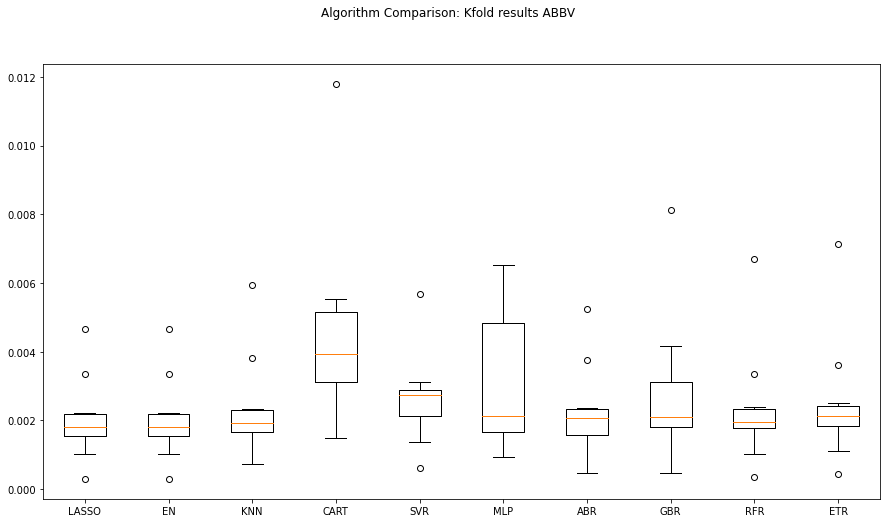

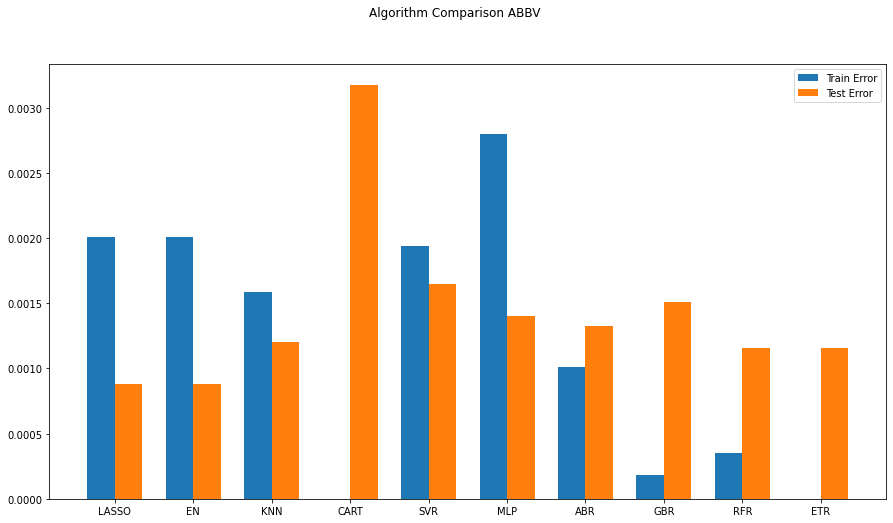

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0009304085458013881
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

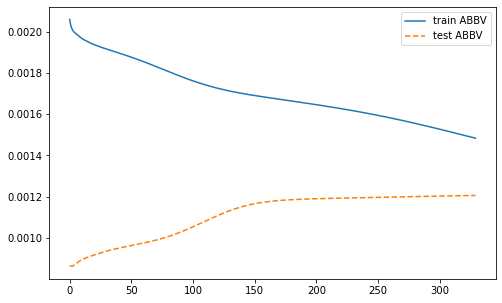

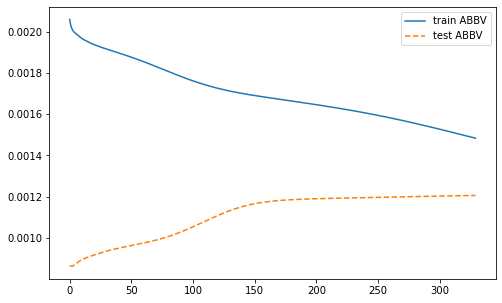

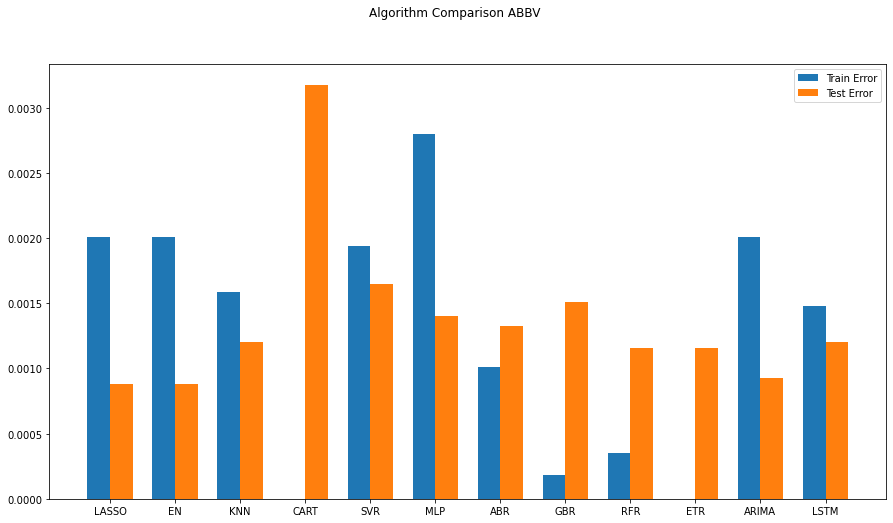

ARIMA(0, 0, 0) MSE=0.0019980
ARIMA(0, 0, 1) MSE=0.0019895
ARIMA(1, 0, 0) MSE=0.0019916
ARIMA(1, 0, 1) MSE=0.0019864
ARIMA(2, 0, 0) MSE=0.0019690
ARIMA(2, 0, 1) MSE=0.0019184
Best ARIMA(2, 0, 1) MSE=0.0019184
0.0009304085458013881


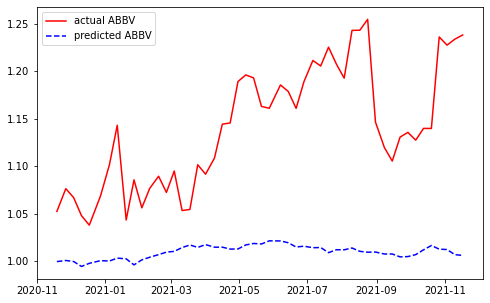

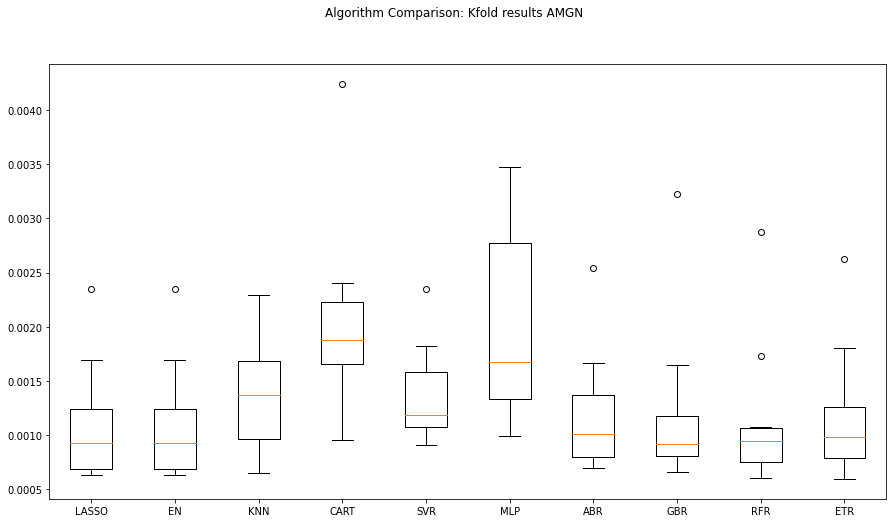

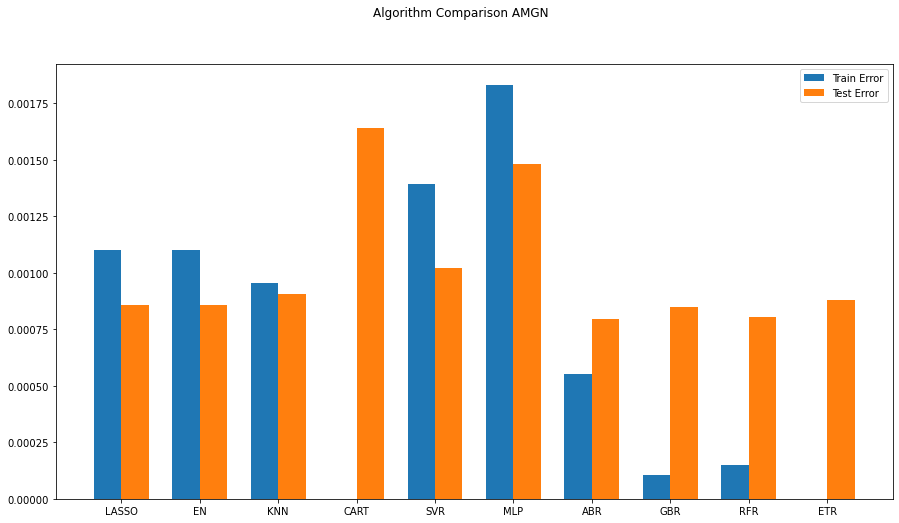

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0009199186645376742
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

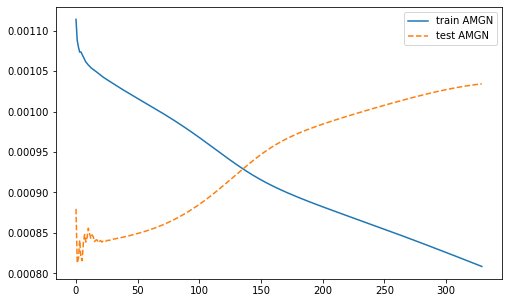

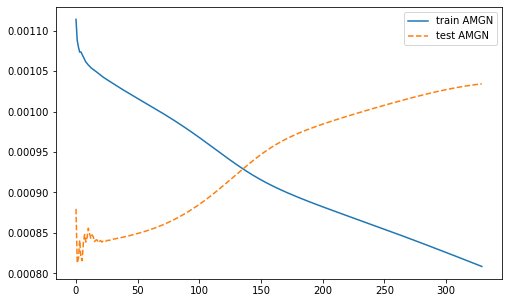

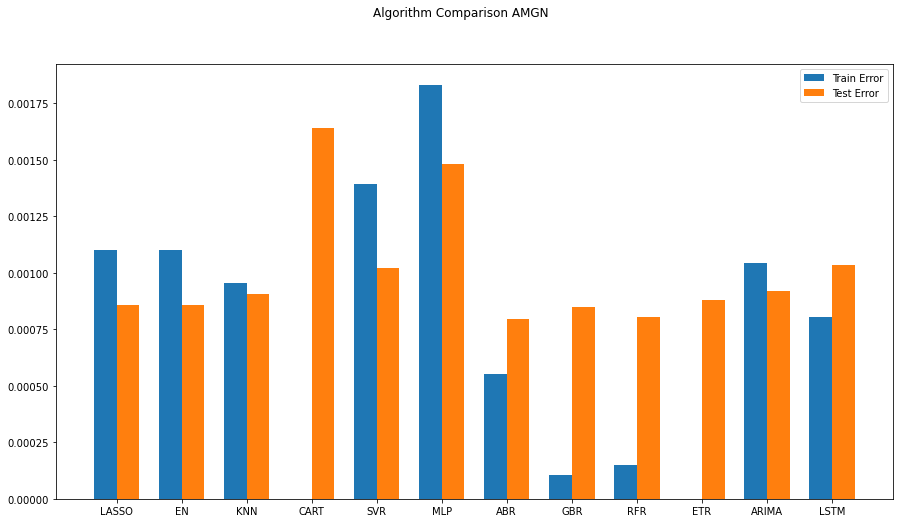

ARIMA(0, 0, 0) MSE=0.0010318
ARIMA(0, 0, 1) MSE=0.0010314
ARIMA(1, 0, 0) MSE=0.0010314
ARIMA(1, 0, 1) MSE=0.0010311
ARIMA(2, 0, 0) MSE=0.0010298
ARIMA(2, 0, 1) MSE=0.0010298
Best ARIMA(2, 0, 1) MSE=0.0010298
0.0009199186645376742


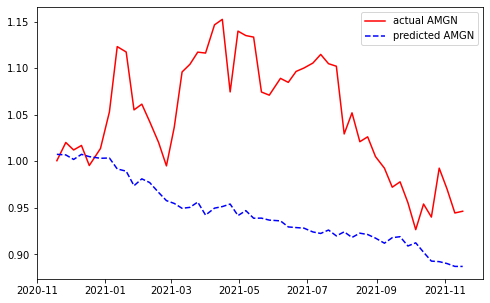

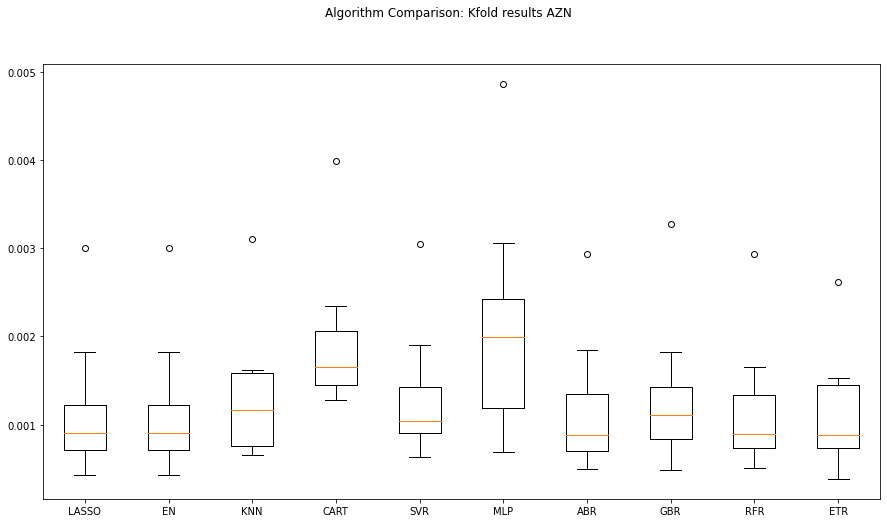

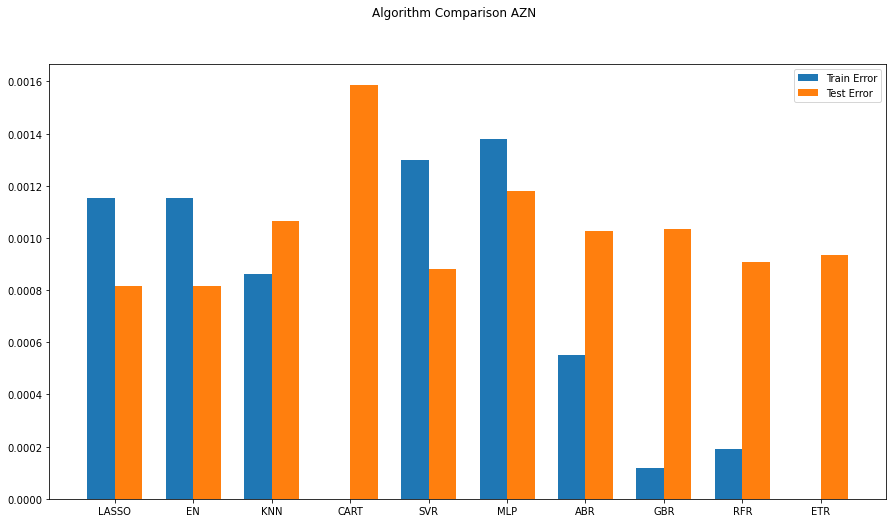

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0007901265408578227
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

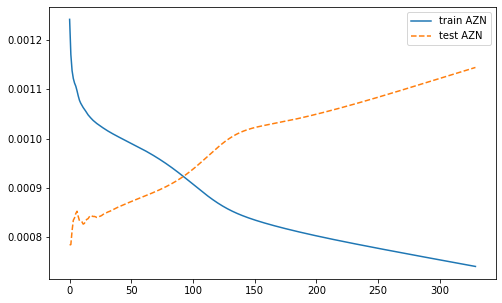

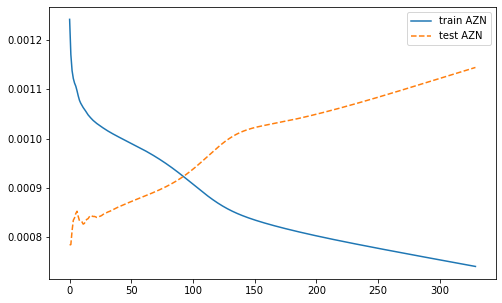

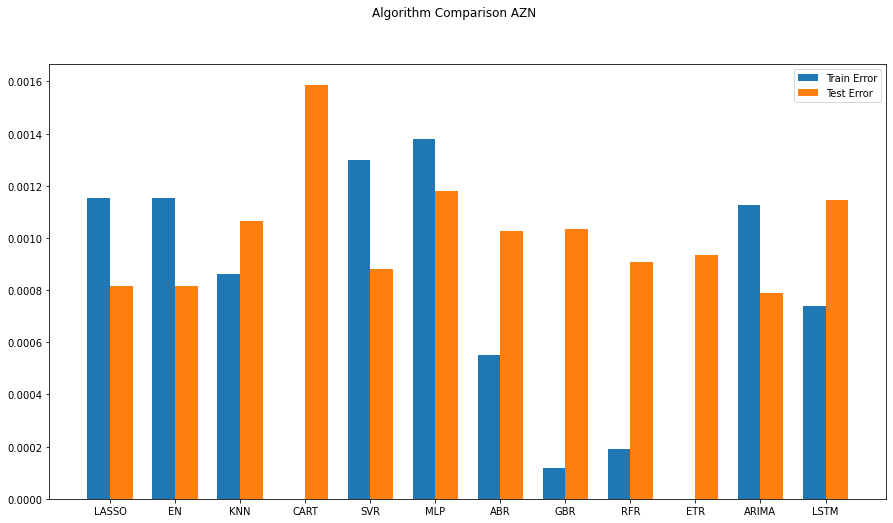

ARIMA(0, 0, 0) MSE=0.0010973
ARIMA(0, 0, 1) MSE=0.0010969
ARIMA(1, 0, 0) MSE=0.0010969
ARIMA(1, 0, 1) MSE=0.0010969
ARIMA(2, 0, 0) MSE=0.0010969
ARIMA(2, 0, 1) MSE=0.0010788
Best ARIMA(2, 0, 1) MSE=0.0010788
0.0007901265408578227


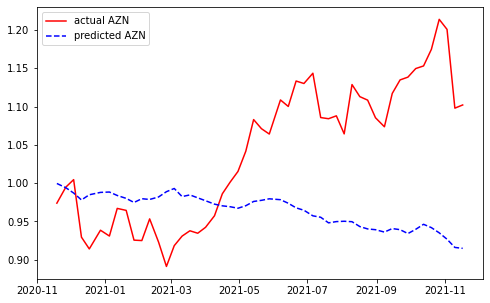

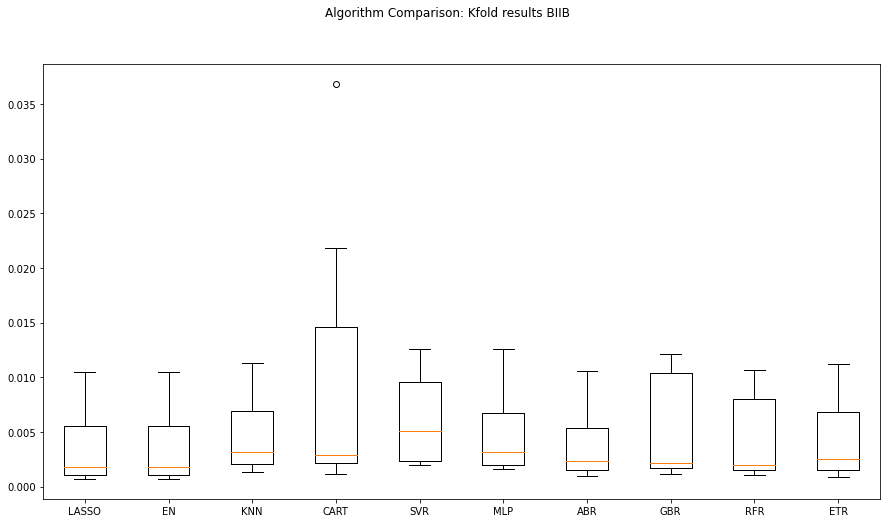

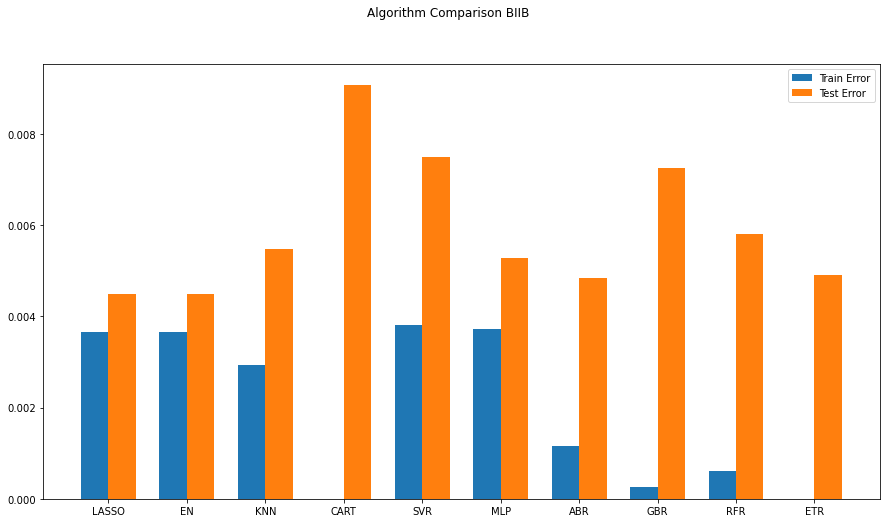

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.004352139745074246
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0

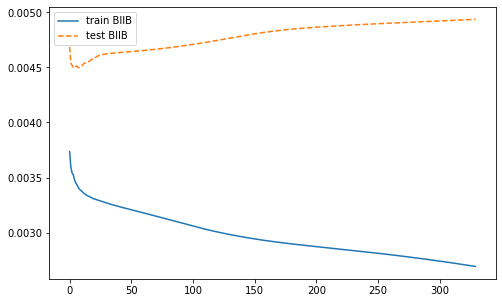

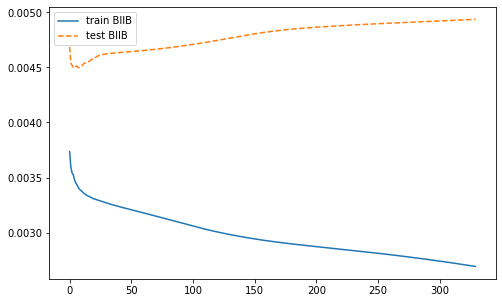

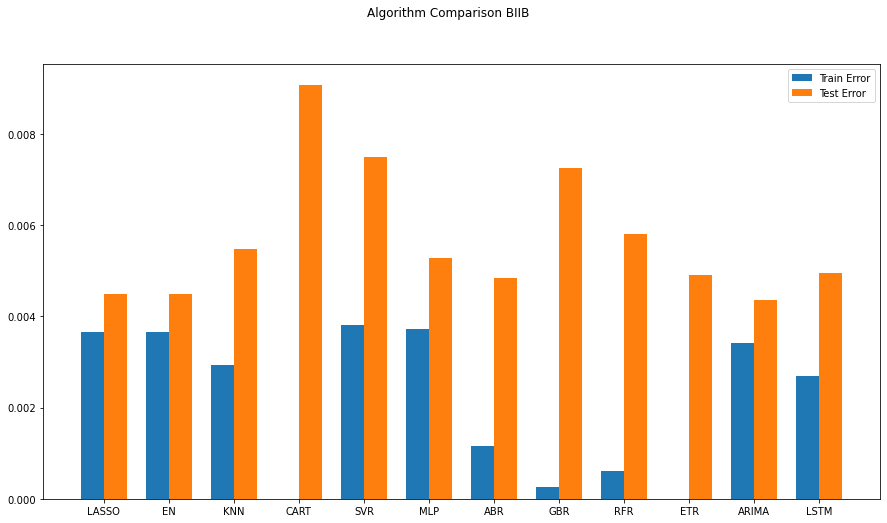

ARIMA(0, 0, 0) MSE=0.0035079
ARIMA(0, 0, 1) MSE=0.0033823
ARIMA(1, 0, 0) MSE=0.0034044
ARIMA(1, 0, 1) MSE=0.0033634
ARIMA(2, 0, 0) MSE=0.0033811
ARIMA(2, 0, 1) MSE=0.0033634
Best ARIMA(2, 0, 1) MSE=0.0033634
0.004352139745074246


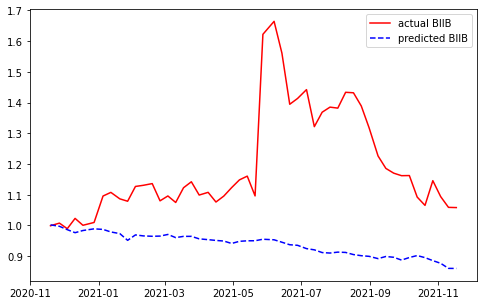

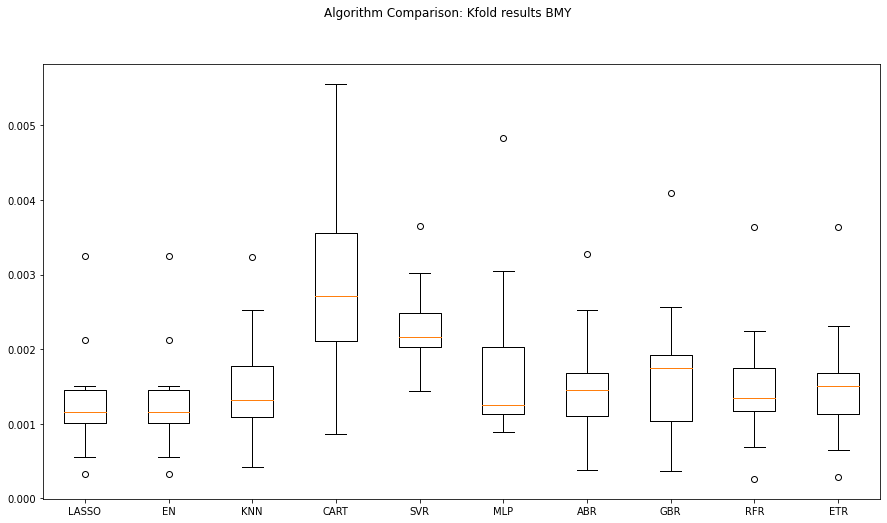

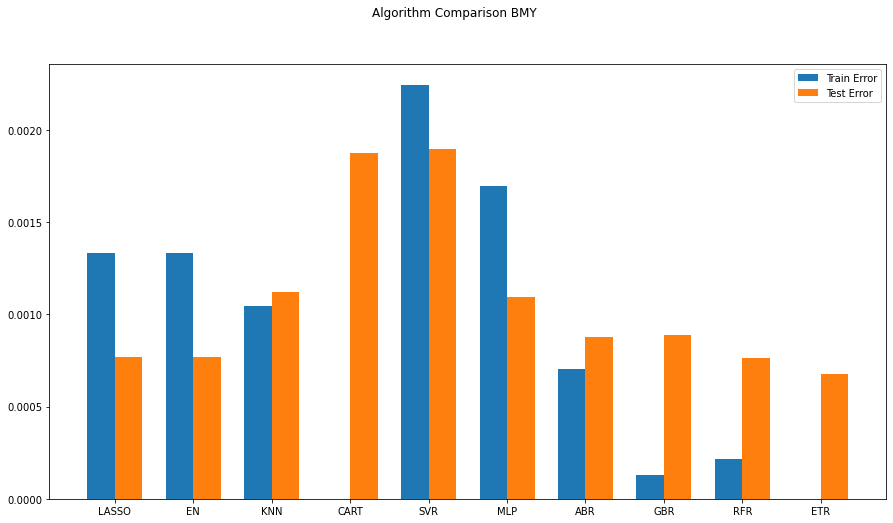

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0008096529142466541
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

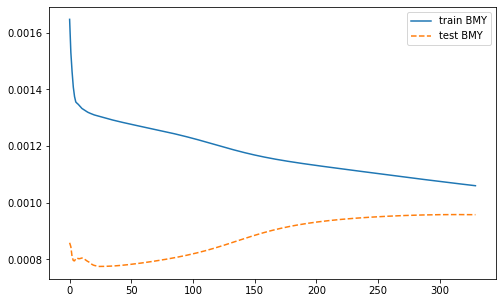

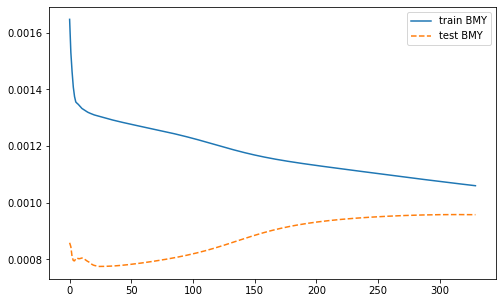

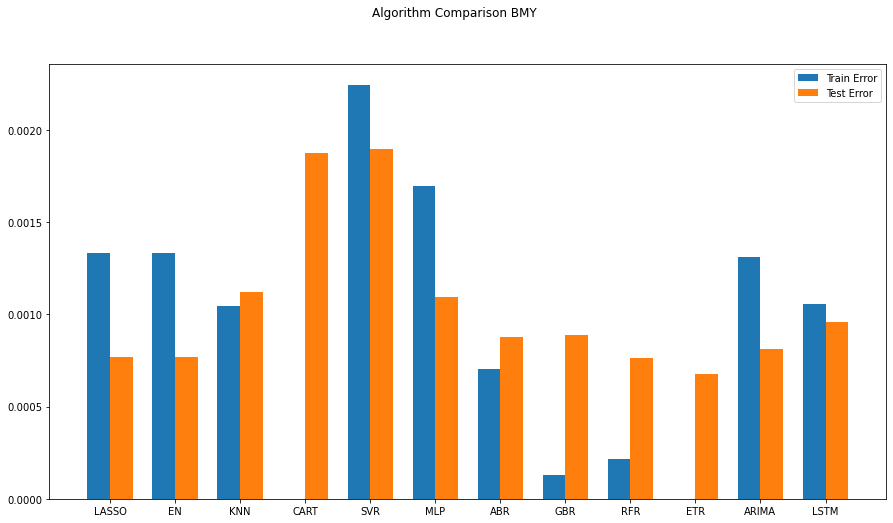

ARIMA(0, 0, 0) MSE=0.0013167
ARIMA(0, 0, 1) MSE=0.0013116
ARIMA(1, 0, 0) MSE=0.0013116
ARIMA(1, 0, 1) MSE=0.0013116
ARIMA(2, 0, 0) MSE=0.0013116
ARIMA(2, 0, 1) MSE=0.0012465
Best ARIMA(2, 0, 1) MSE=0.0012465
0.0008096529142466541


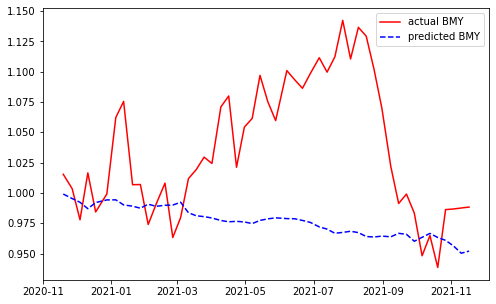

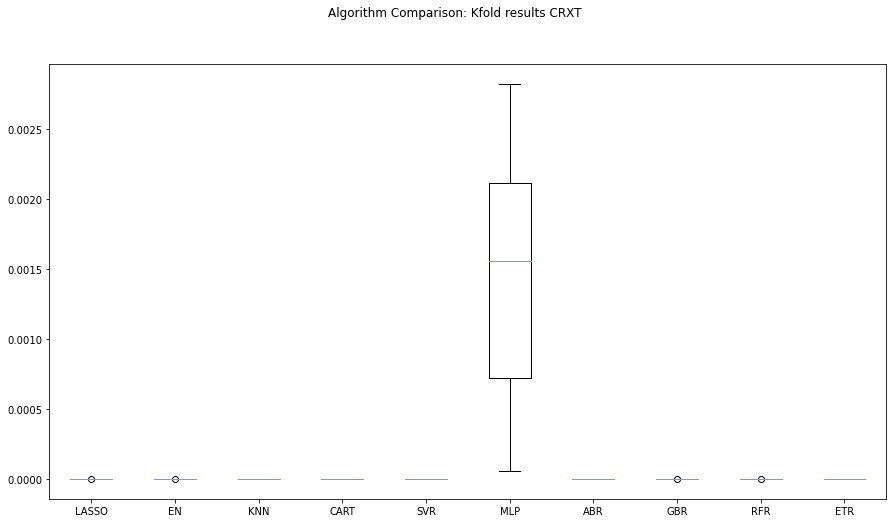

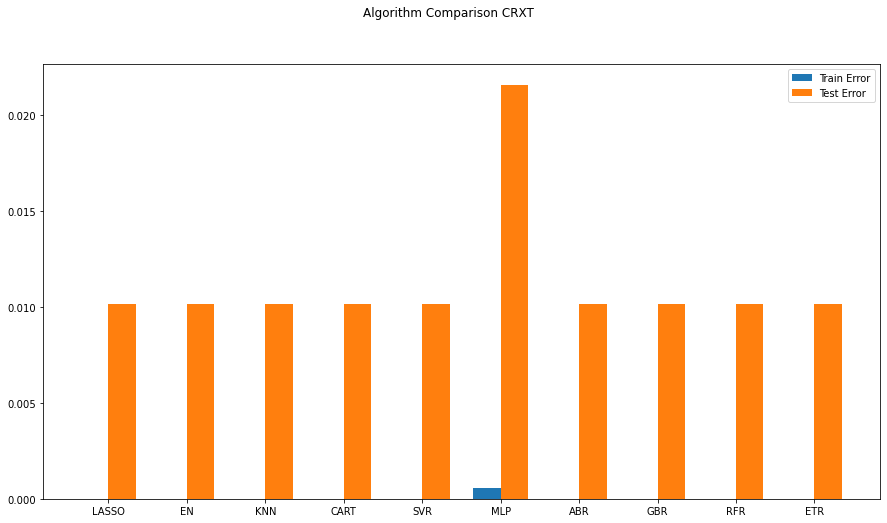

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.010181287084725004
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0

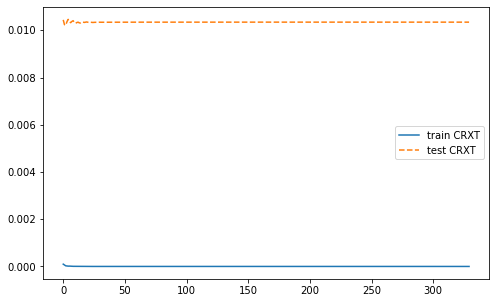

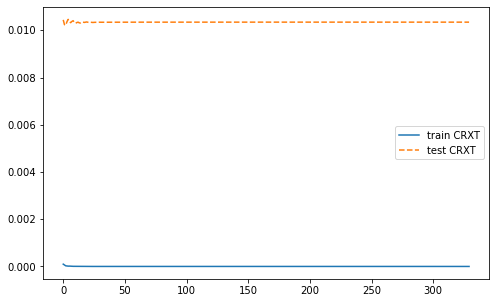

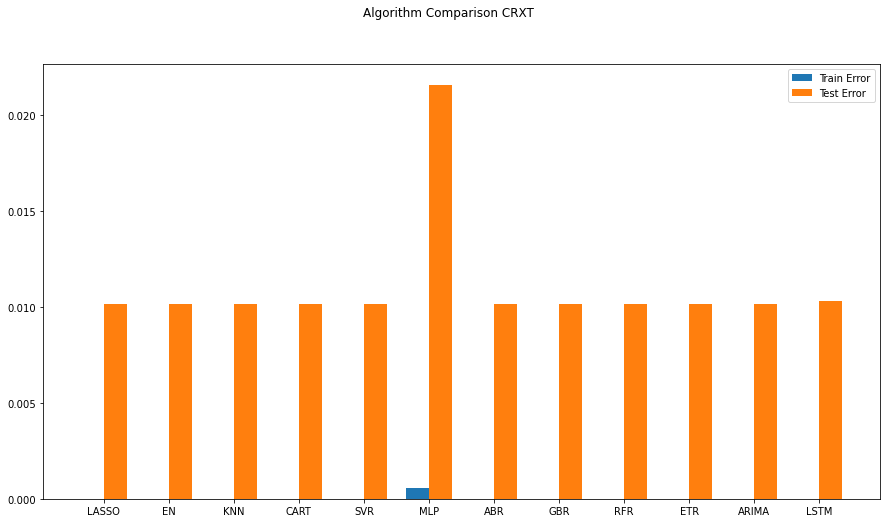

ARIMA(0, 0, 0) MSE=0.0000000
ARIMA(0, 0, 1) MSE=0.0000000
ARIMA(1, 0, 0) MSE=0.0000000
ARIMA(1, 0, 1) MSE=0.0000000
ARIMA(2, 0, 0) MSE=0.0000000
ARIMA(2, 0, 1) MSE=0.0000000
Best ARIMA(2, 0, 1) MSE=0.0000000
0.010181287084725004


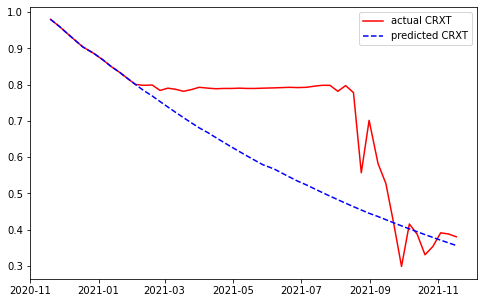

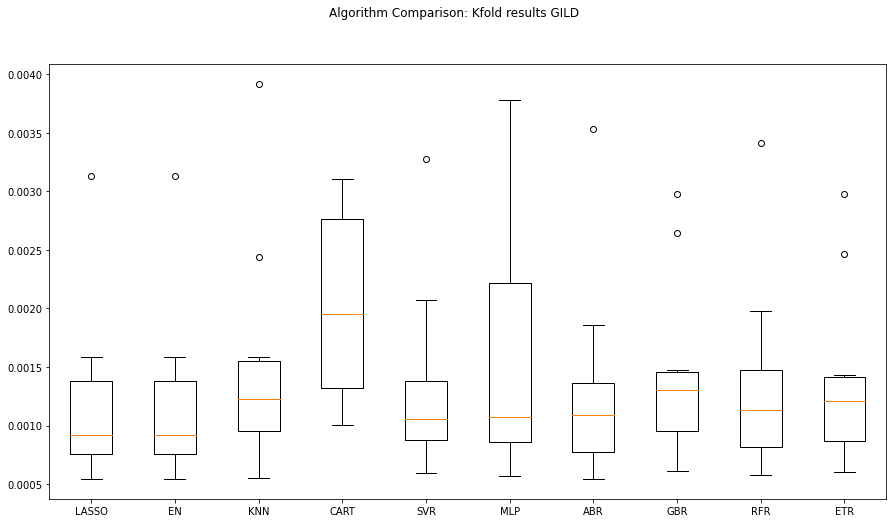

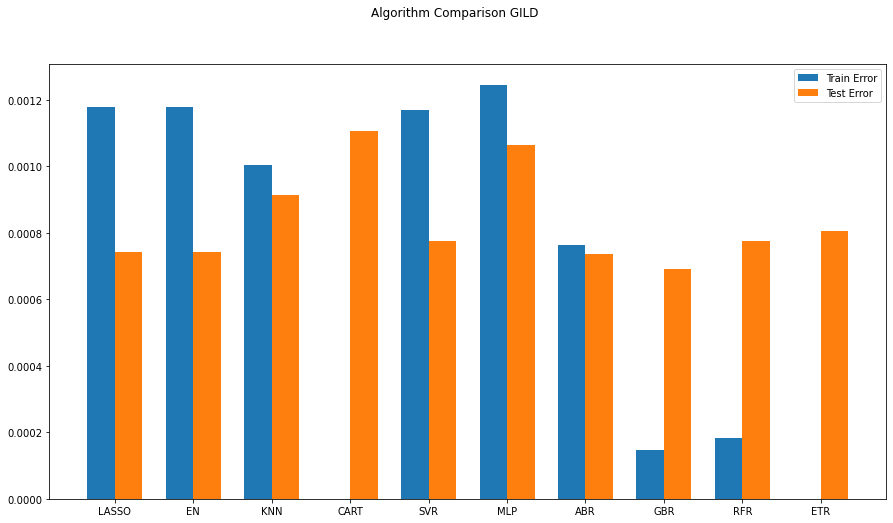

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0008518961312311188
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

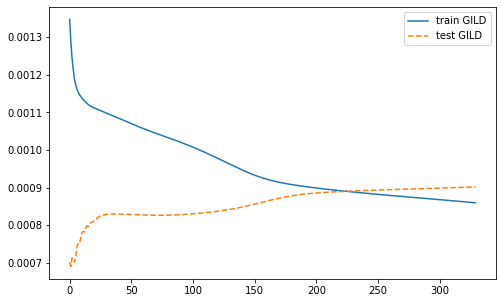

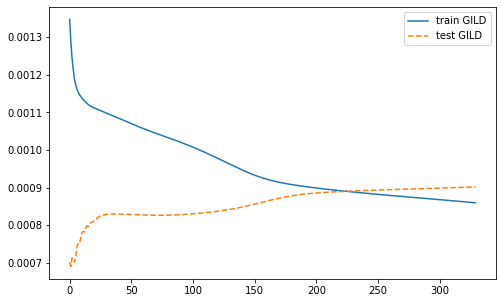

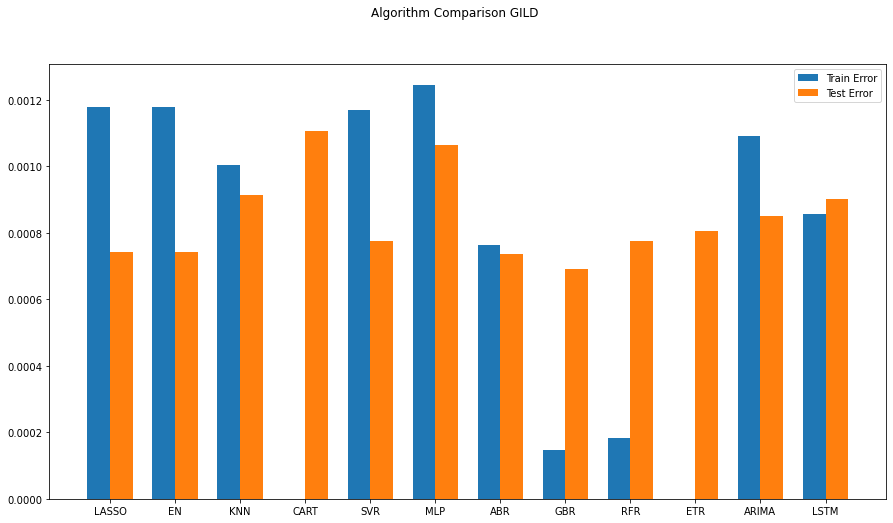

ARIMA(0, 0, 0) MSE=0.0011157
ARIMA(0, 0, 1) MSE=0.0010929
ARIMA(1, 0, 0) MSE=0.0010928
ARIMA(1, 0, 1) MSE=0.0010878
ARIMA(2, 0, 0) MSE=0.0010927
ARIMA(2, 0, 1) MSE=0.0010861
Best ARIMA(2, 0, 1) MSE=0.0010861
0.0008518961312311188


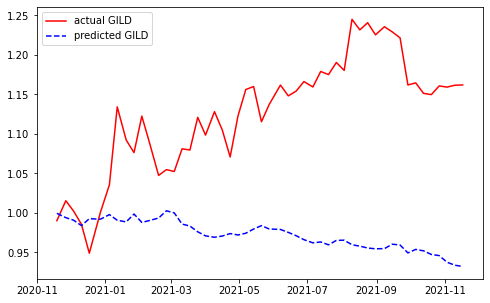

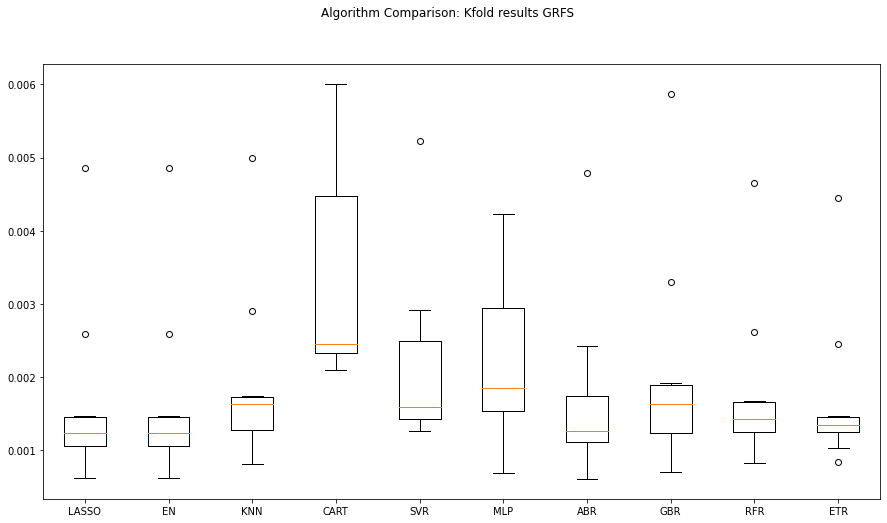

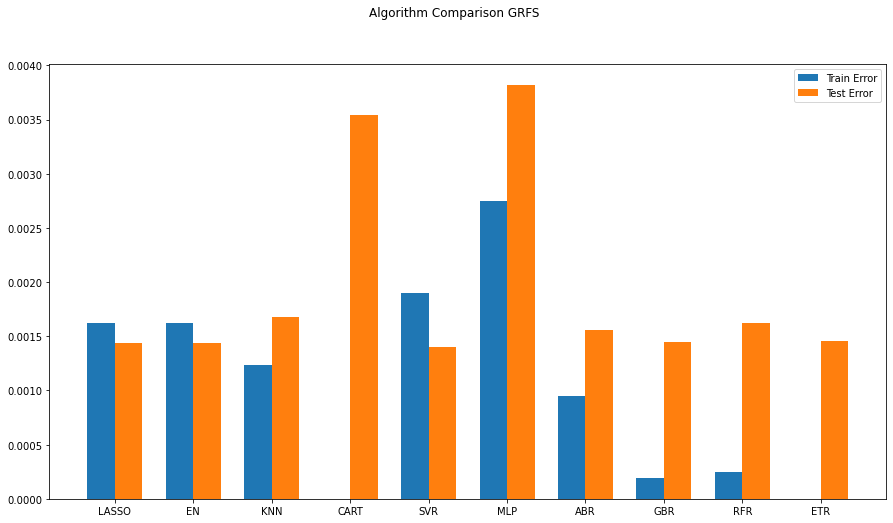

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0013710163320425045
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

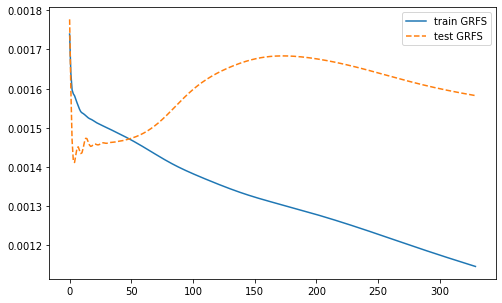

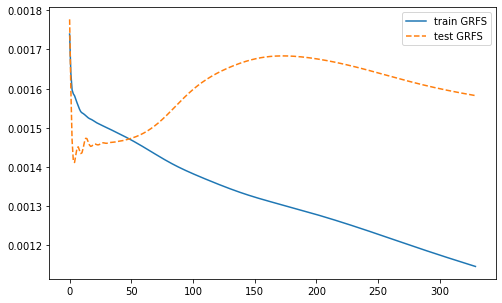

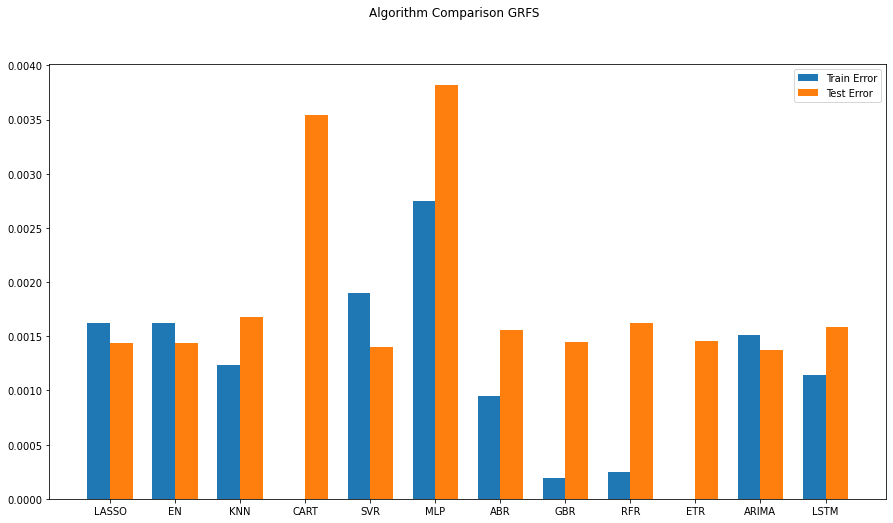

ARIMA(0, 0, 0) MSE=0.0015001
ARIMA(0, 0, 1) MSE=0.0015001
ARIMA(1, 0, 0) MSE=0.0015001
ARIMA(1, 0, 1) MSE=0.0014928
ARIMA(2, 0, 0) MSE=0.0014907
ARIMA(2, 0, 1) MSE=0.0014850
Best ARIMA(2, 0, 1) MSE=0.0014850
0.0013710163320425045


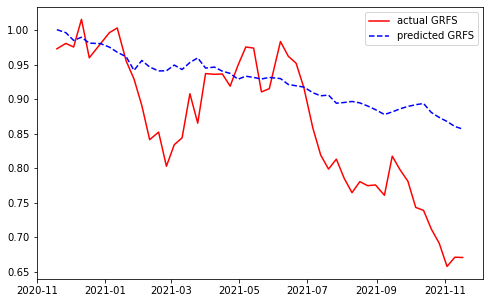

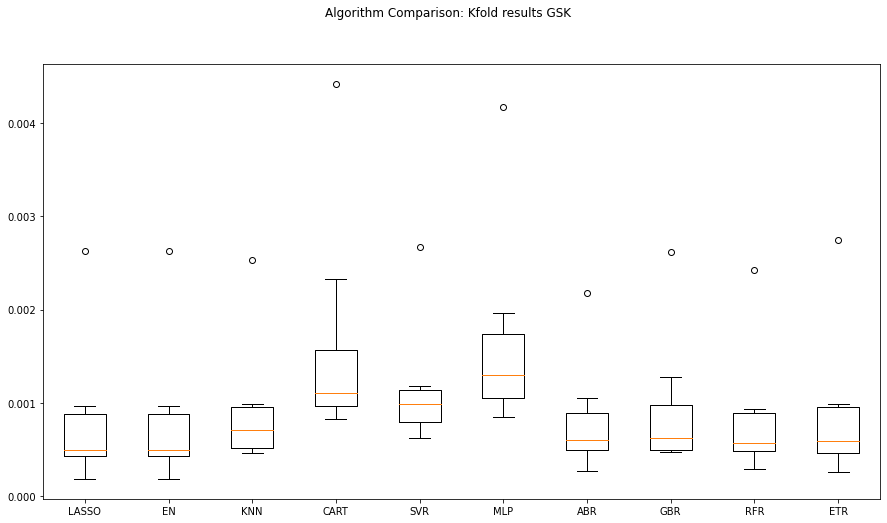

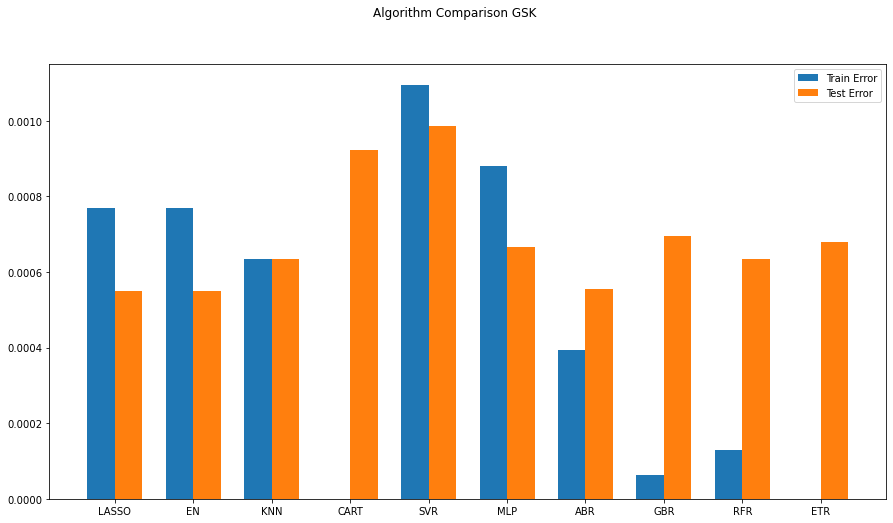

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0005692329544230782
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

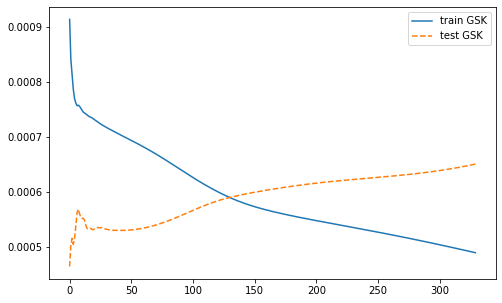

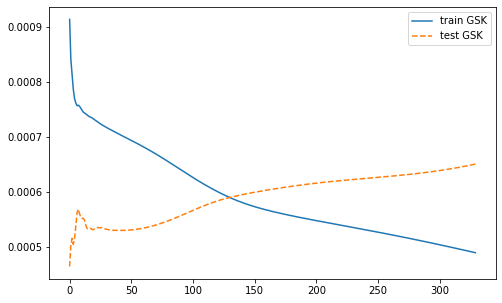

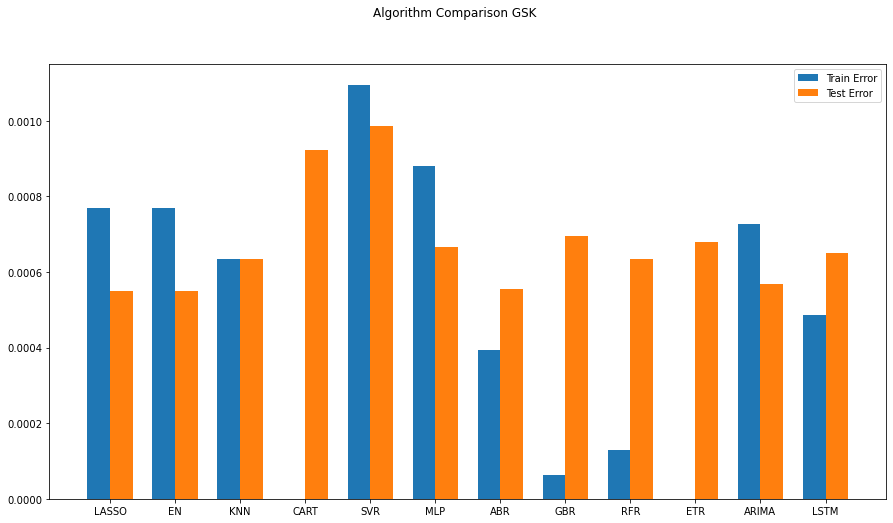

ARIMA(0, 0, 0) MSE=0.0007291
ARIMA(0, 0, 1) MSE=0.0007194
ARIMA(1, 0, 0) MSE=0.0007235
ARIMA(1, 0, 1) MSE=0.0006834
ARIMA(2, 0, 0) MSE=0.0007087
ARIMA(2, 0, 1) MSE=0.0006862
Best ARIMA(1, 0, 1) MSE=0.0006834
0.0005692329544230782


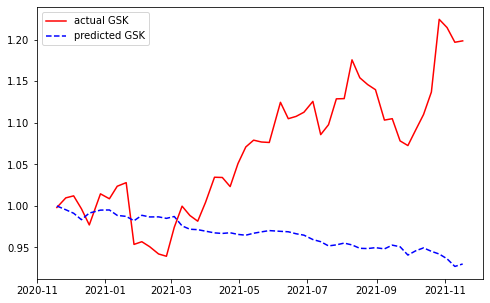

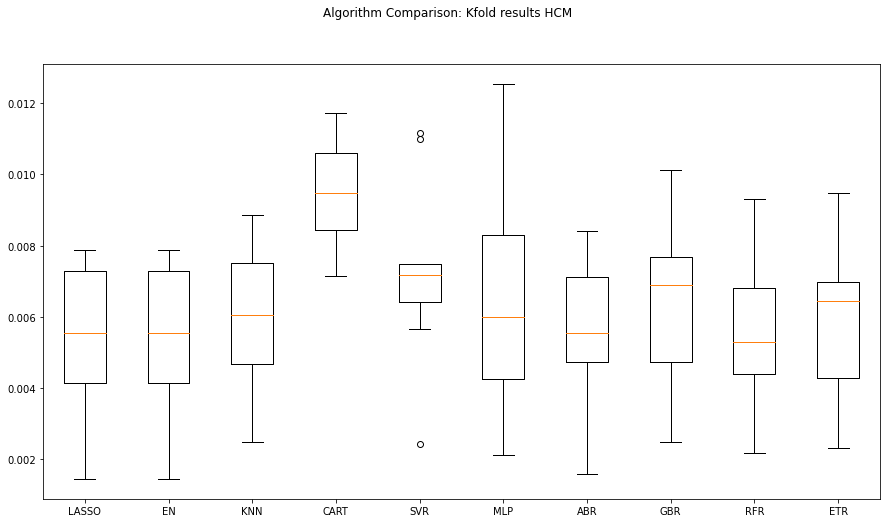

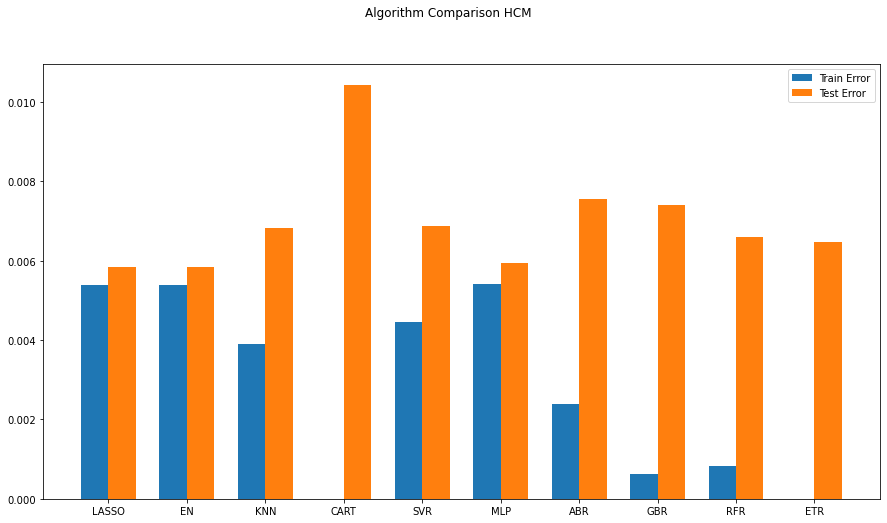

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.005671548973017903
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0

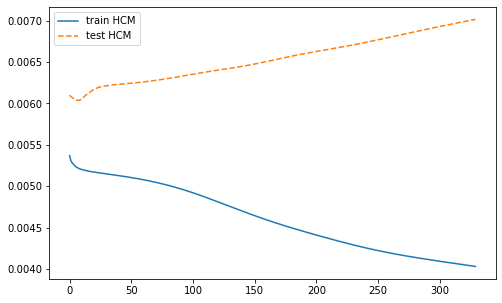

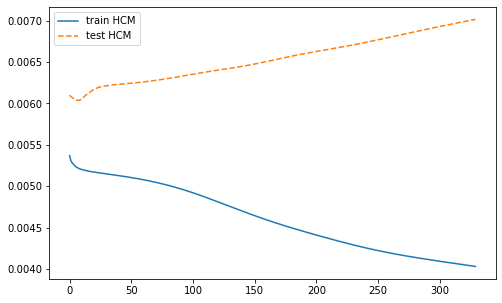

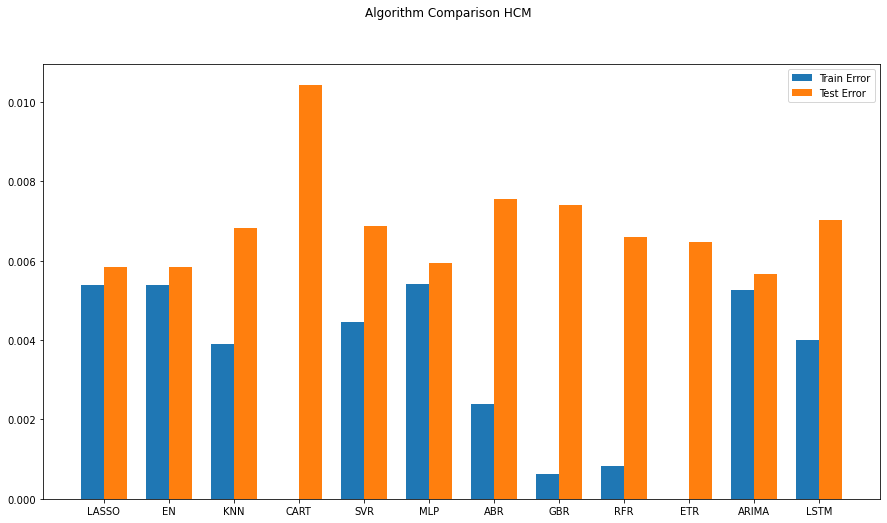

ARIMA(0, 0, 0) MSE=0.0052420
ARIMA(0, 0, 1) MSE=0.0052394
ARIMA(1, 0, 0) MSE=0.0052397
ARIMA(1, 0, 1) MSE=0.0052258
ARIMA(2, 0, 0) MSE=0.0052254
ARIMA(2, 0, 1) MSE=0.0051764
Best ARIMA(2, 0, 1) MSE=0.0051764
0.005671548973017903


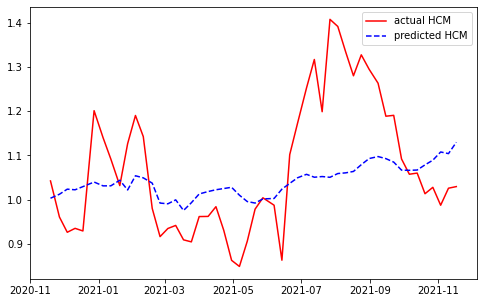

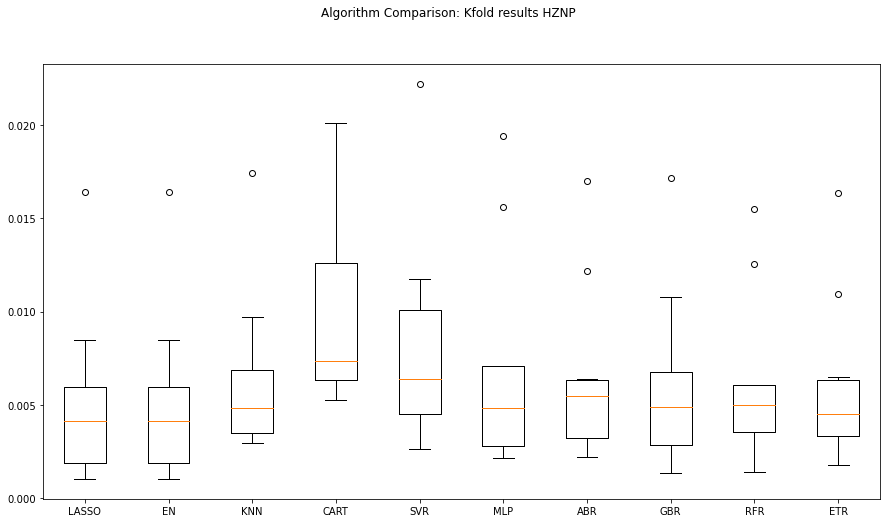

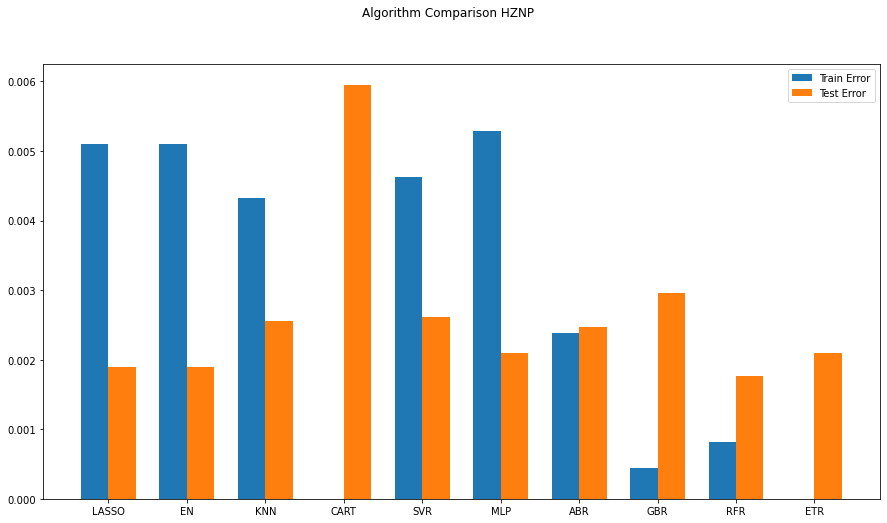

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.001971719992275273
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0

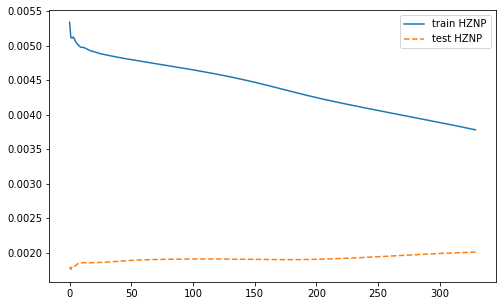

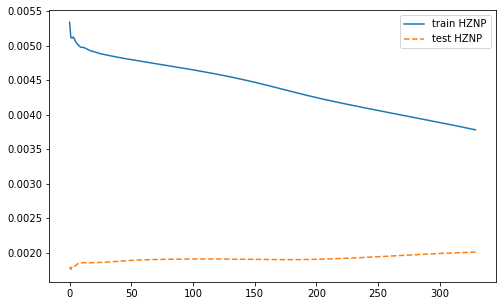

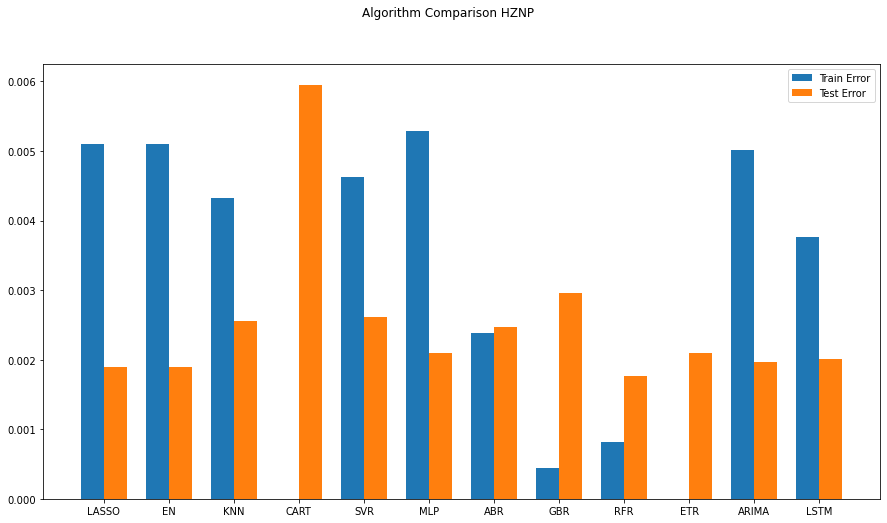

ARIMA(0, 0, 0) MSE=0.0050864
ARIMA(0, 0, 1) MSE=0.0049799
ARIMA(1, 0, 0) MSE=0.0049695
ARIMA(1, 0, 1) MSE=0.0049657
ARIMA(2, 0, 0) MSE=0.0049647
ARIMA(2, 0, 1) MSE=0.0049628
Best ARIMA(2, 0, 1) MSE=0.0049628
0.001971719992275273


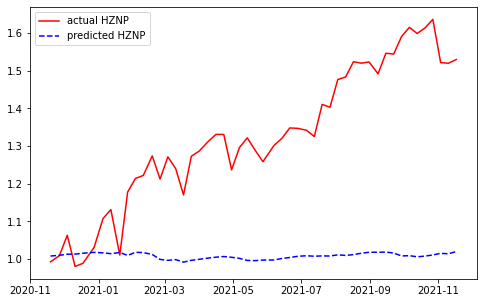

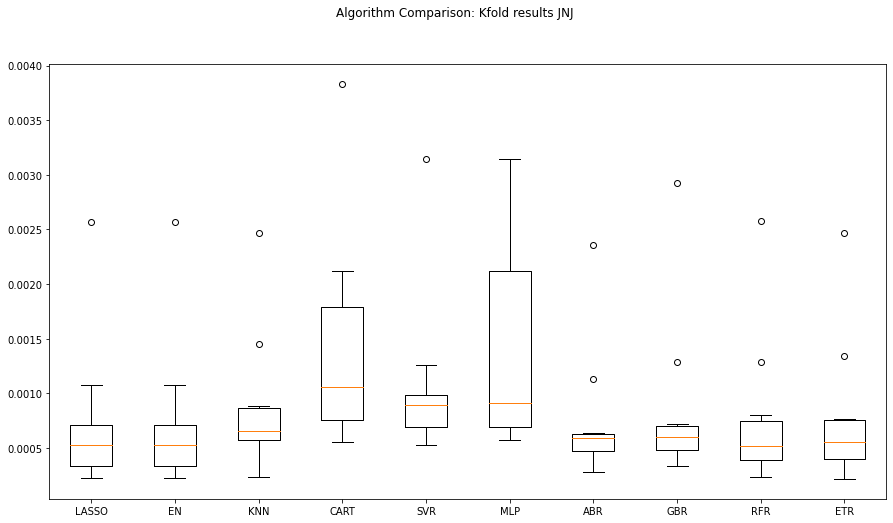

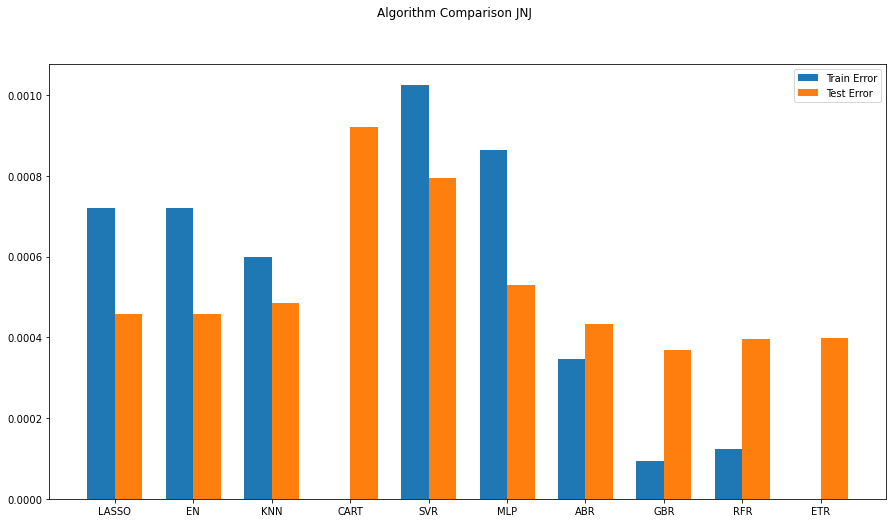

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.00048314739124651865
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ...

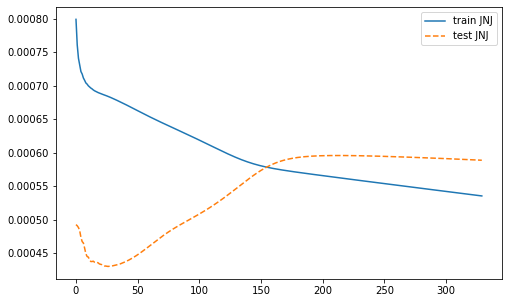

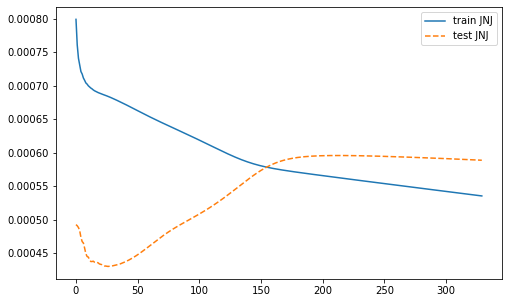

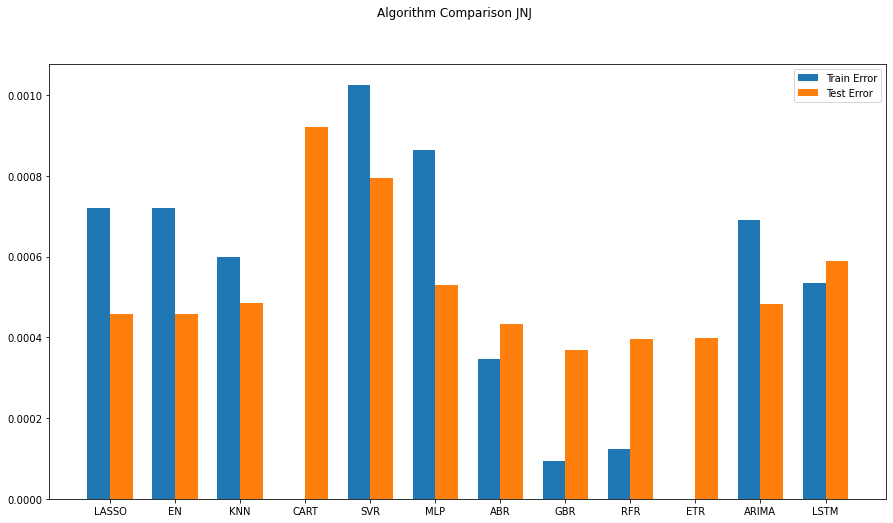

ARIMA(0, 0, 0) MSE=0.0006881
ARIMA(0, 0, 1) MSE=0.0006869
ARIMA(1, 0, 0) MSE=0.0006871
ARIMA(1, 0, 1) MSE=0.0006834
ARIMA(2, 0, 0) MSE=0.0006841
ARIMA(2, 0, 1) MSE=0.0006822
Best ARIMA(2, 0, 1) MSE=0.0006822
0.00048314739124651865


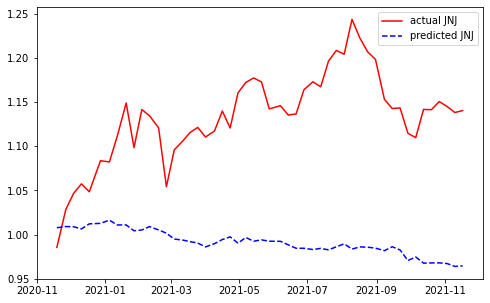

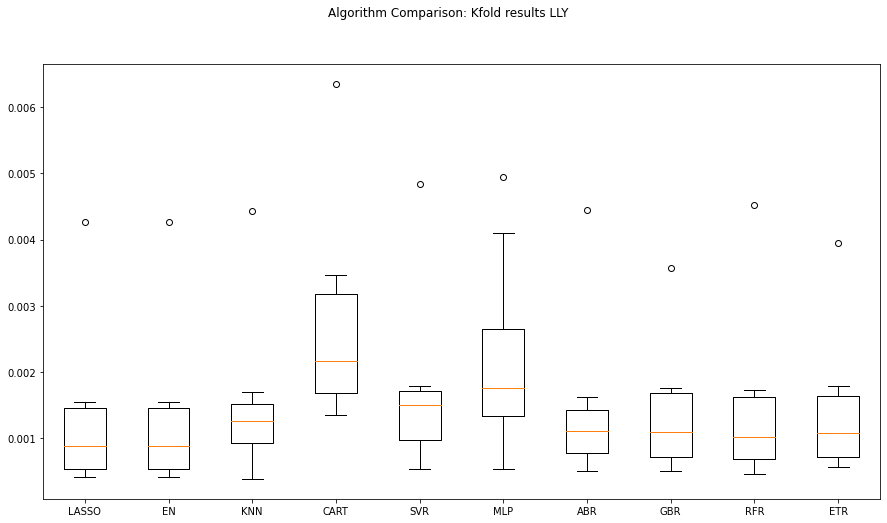

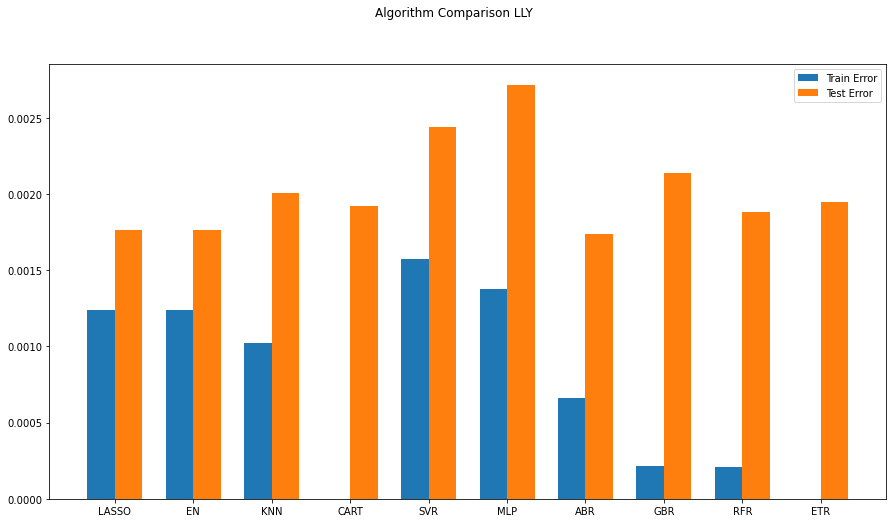

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0018514052761151706
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

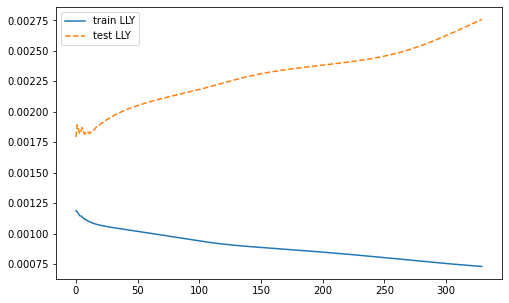

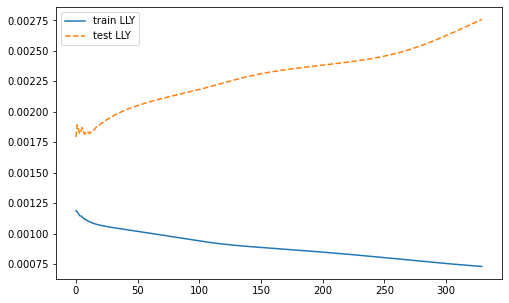

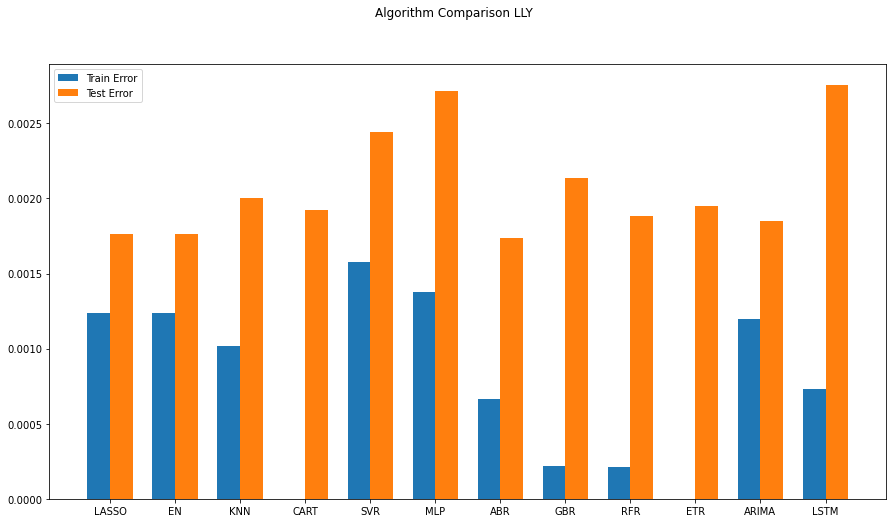

ARIMA(0, 0, 0) MSE=0.0012025
ARIMA(0, 0, 1) MSE=0.0011748
ARIMA(1, 0, 0) MSE=0.0011749
ARIMA(1, 0, 1) MSE=0.0011744
ARIMA(2, 0, 0) MSE=0.0011738
ARIMA(2, 0, 1) MSE=0.0011702
Best ARIMA(2, 0, 1) MSE=0.0011702
0.0018514052761151706


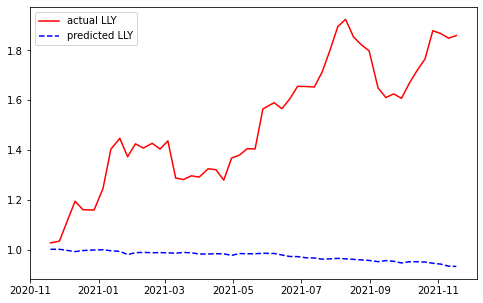

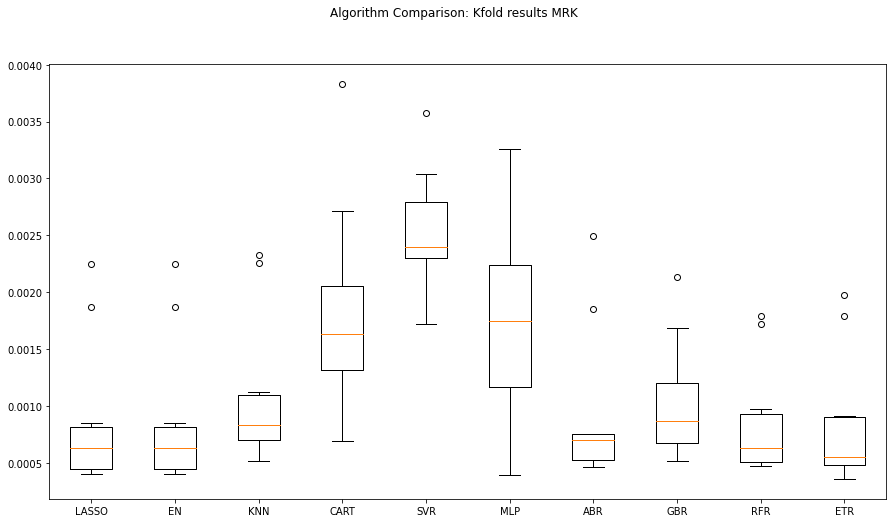

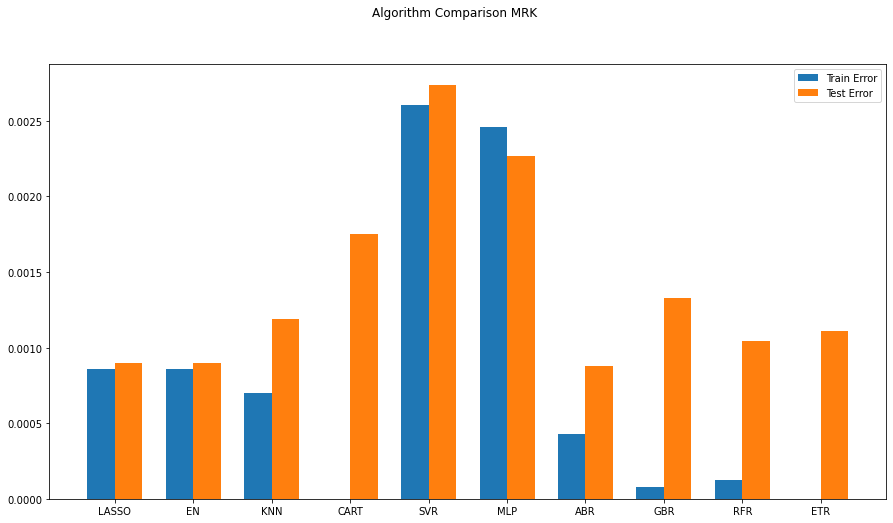

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0010140250642509954
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

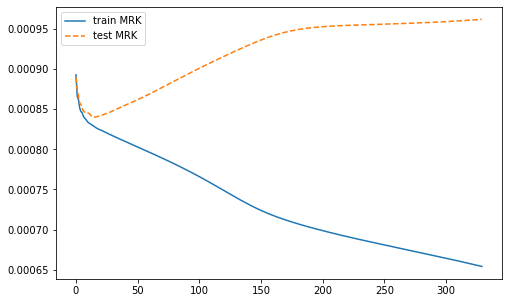

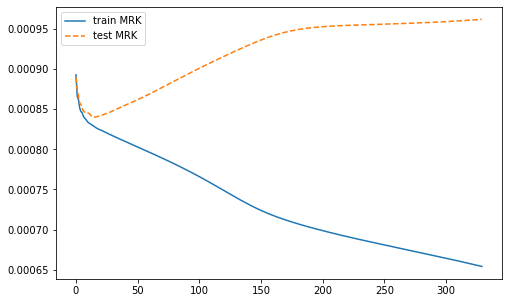

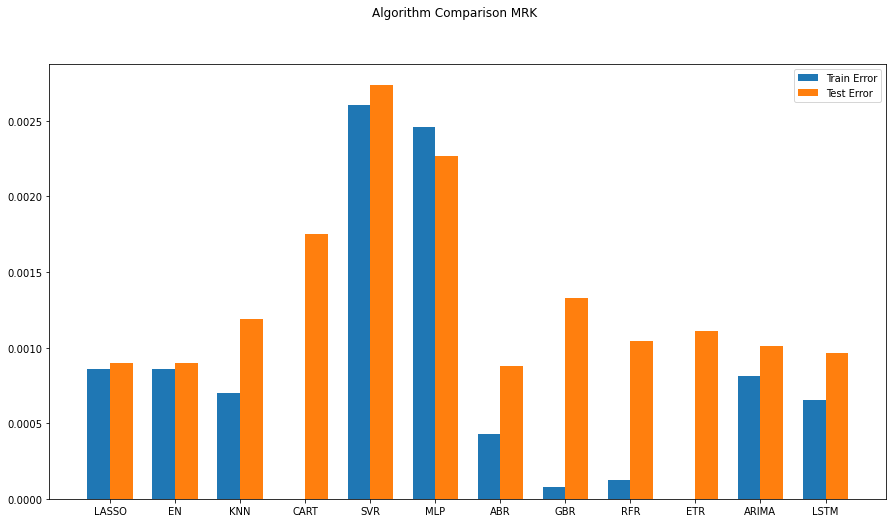

ARIMA(0, 0, 0) MSE=0.0008250
ARIMA(0, 0, 1) MSE=0.0008115
ARIMA(1, 0, 0) MSE=0.0008104
ARIMA(1, 0, 1) MSE=0.0008098
ARIMA(2, 0, 0) MSE=0.0008098
ARIMA(2, 0, 1) MSE=0.0008097
Best ARIMA(2, 0, 1) MSE=0.0008097
0.0010140250642509954


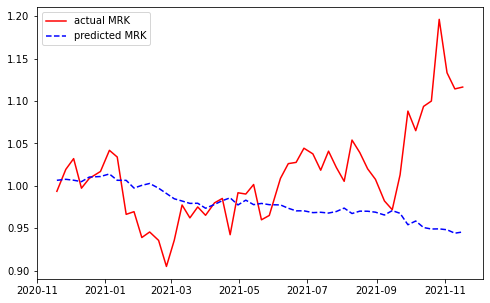

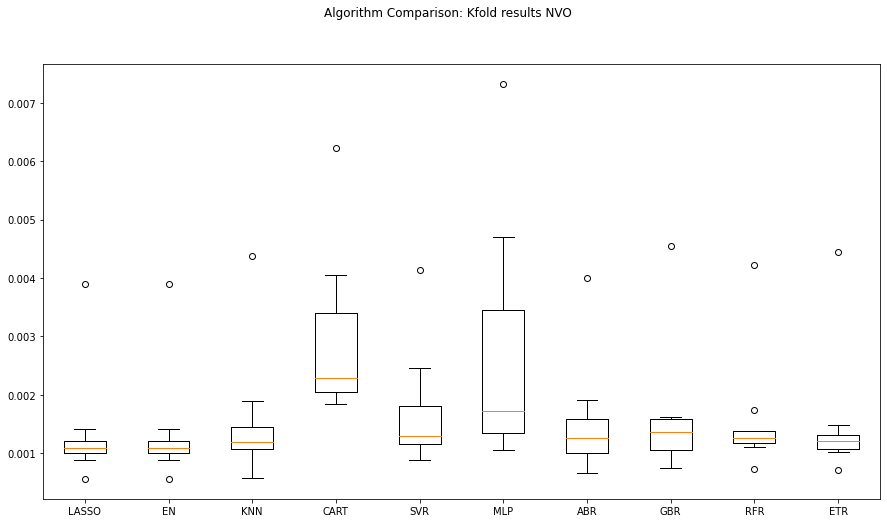

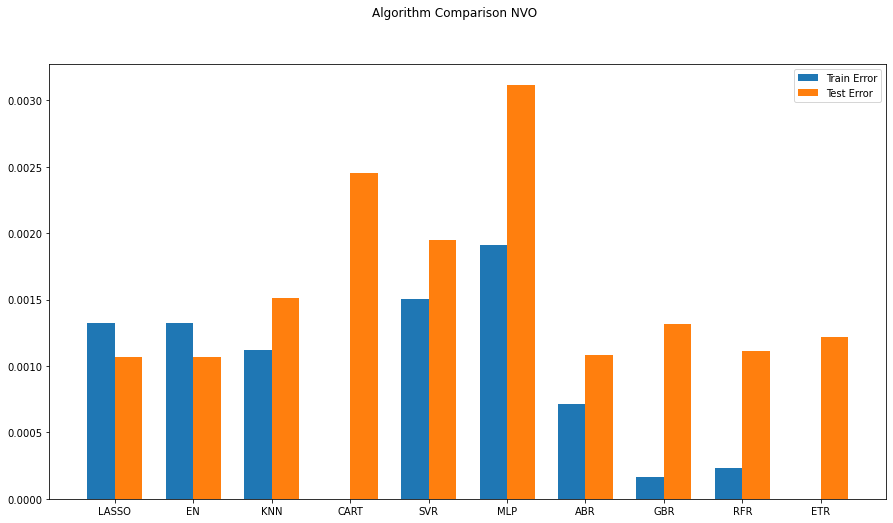

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0012595905972792598
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

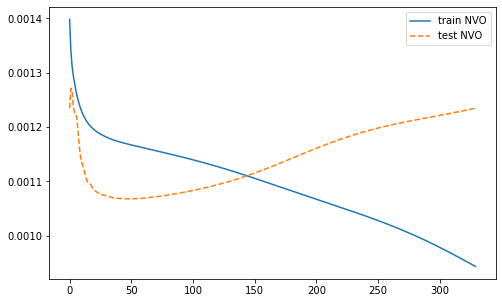

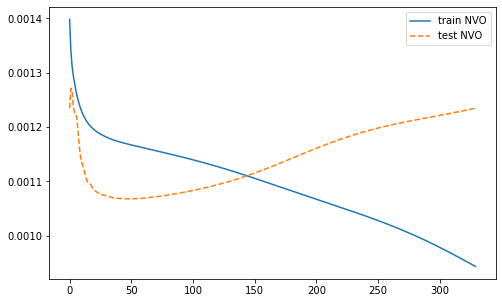

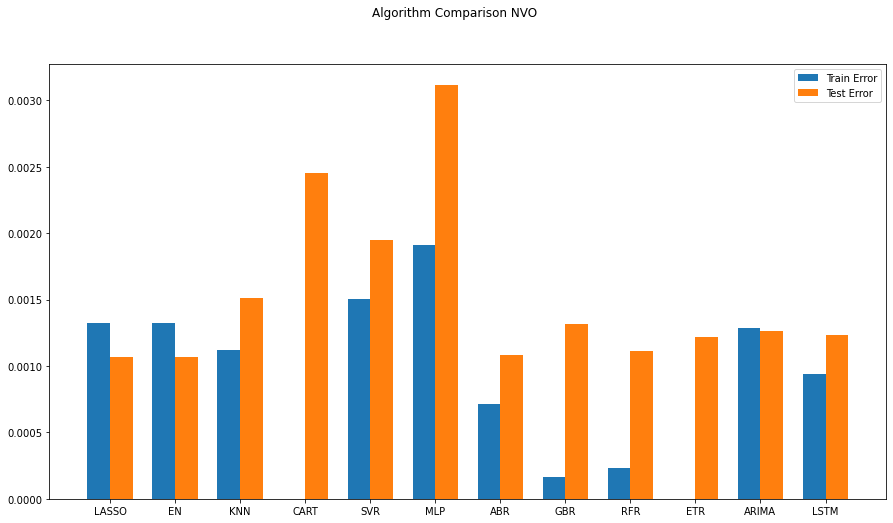

ARIMA(0, 0, 0) MSE=0.0012612
ARIMA(0, 0, 1) MSE=0.0012549
ARIMA(1, 0, 0) MSE=0.0012568
ARIMA(1, 0, 1) MSE=0.0012364
ARIMA(2, 0, 0) MSE=0.0012347
ARIMA(2, 0, 1) MSE=0.0012328
Best ARIMA(2, 0, 1) MSE=0.0012328
0.0012595905972792598


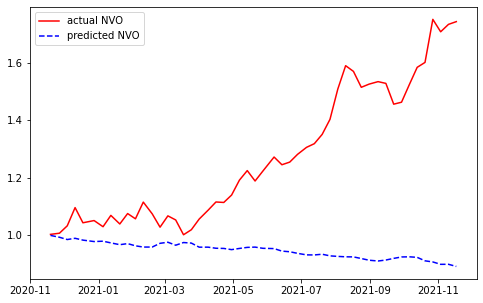

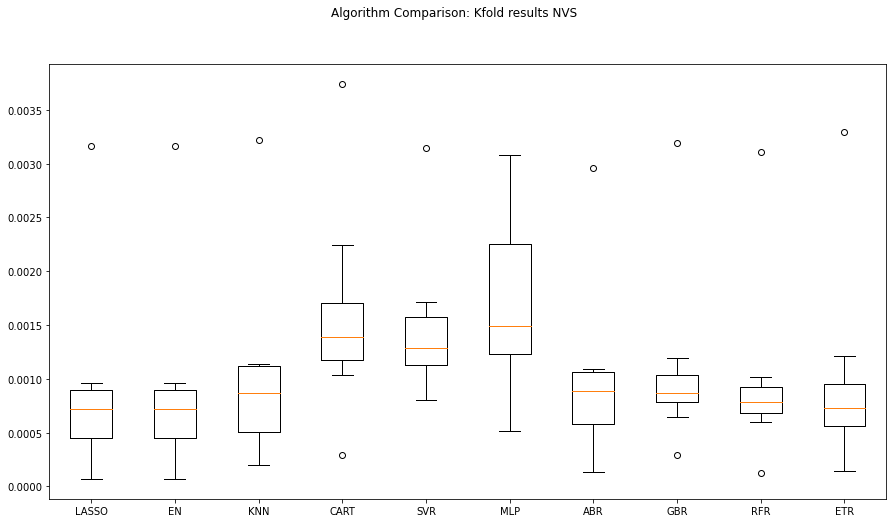

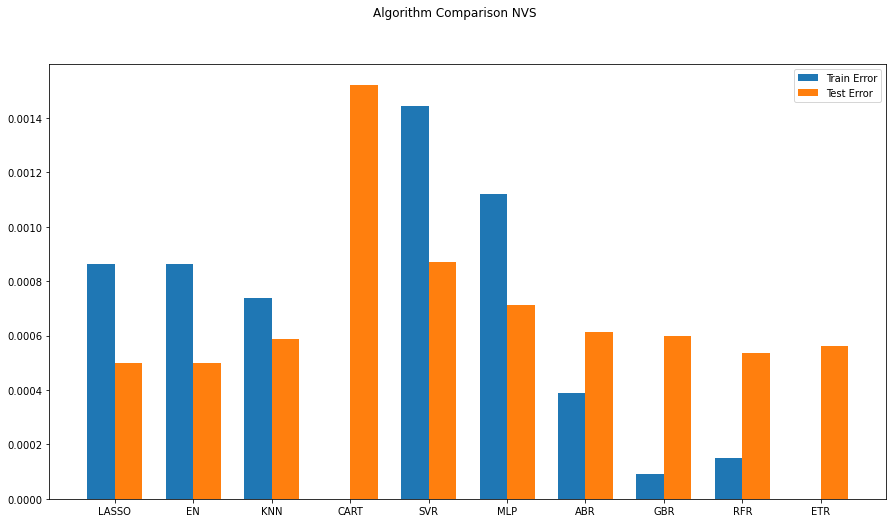

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0005043412048610935
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

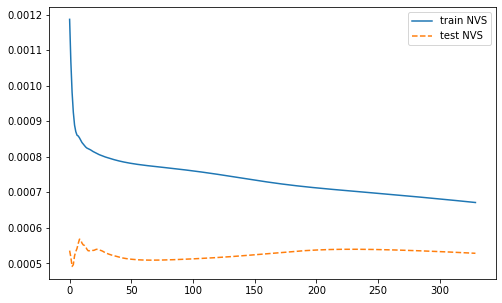

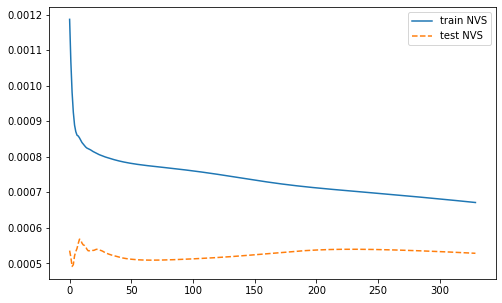

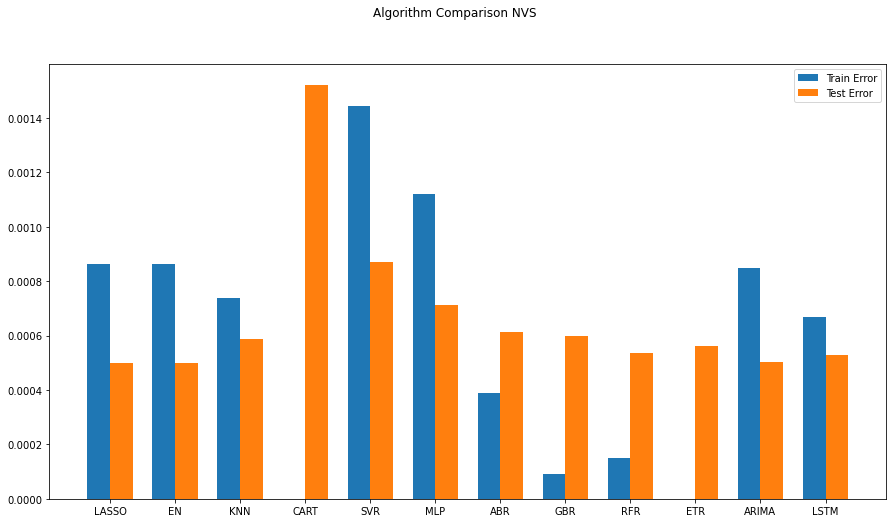

ARIMA(0, 0, 0) MSE=0.0008452
ARIMA(0, 0, 1) MSE=0.0008346
ARIMA(1, 0, 0) MSE=0.0008377
ARIMA(1, 0, 1) MSE=0.0008122
ARIMA(2, 0, 0) MSE=0.0008241
ARIMA(2, 0, 1) MSE=0.0008079
Best ARIMA(2, 0, 1) MSE=0.0008079
0.0005043412048610935


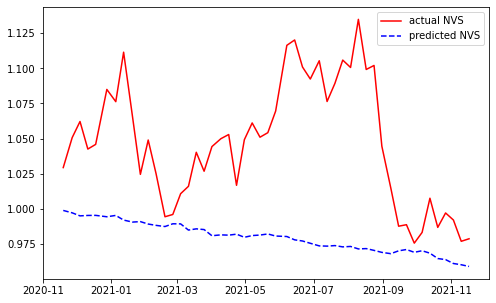

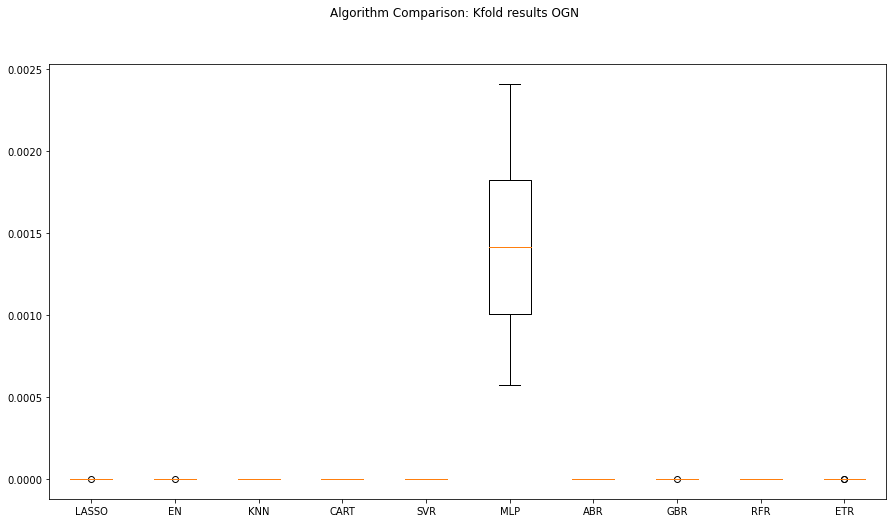

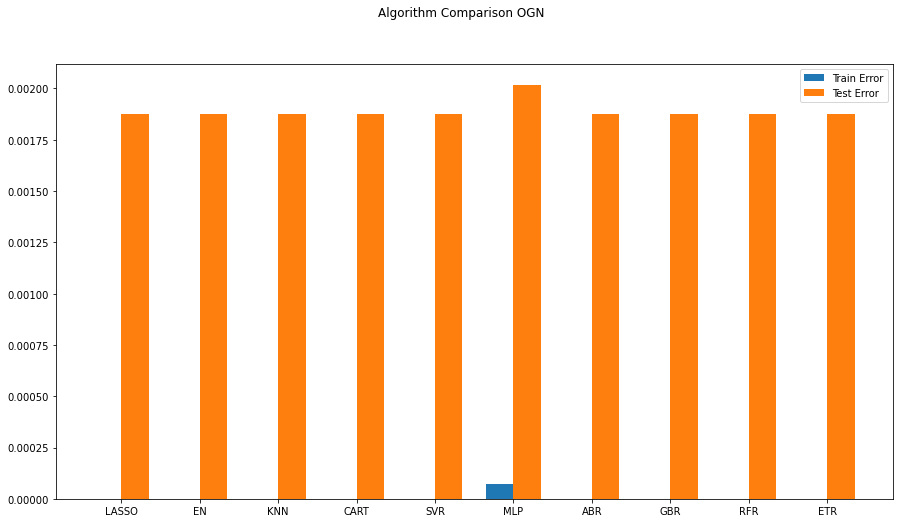

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0018776912611772197
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

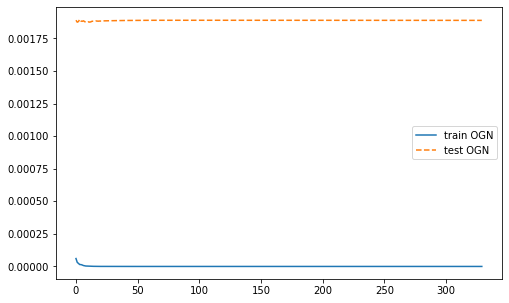

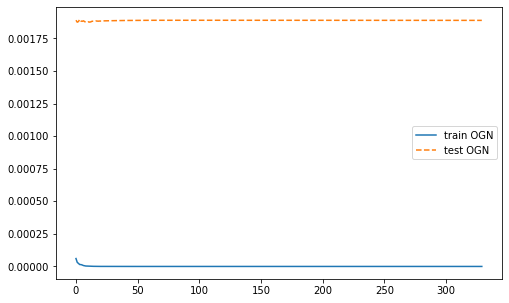

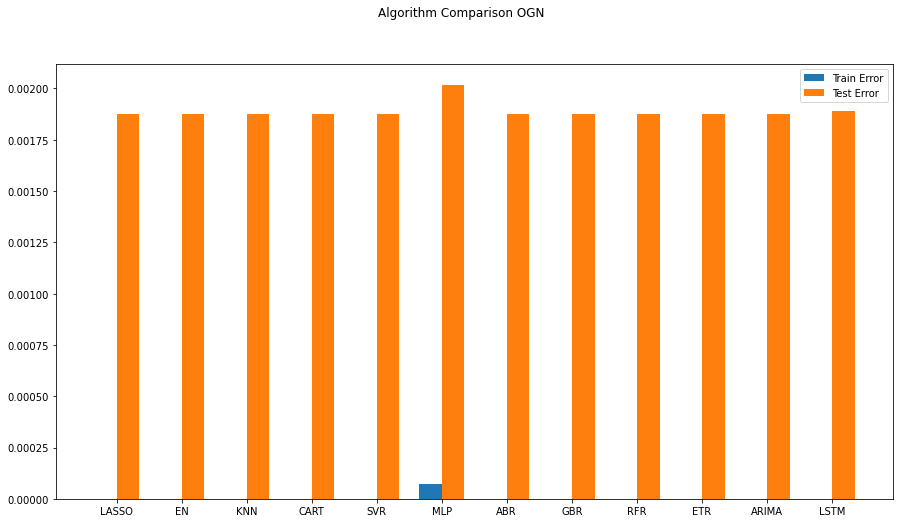

ARIMA(0, 0, 0) MSE=0.0000000
ARIMA(0, 0, 1) MSE=0.0000000
ARIMA(1, 0, 0) MSE=0.0000000
ARIMA(1, 0, 1) MSE=0.0000000
ARIMA(2, 0, 0) MSE=0.0000000
ARIMA(2, 0, 1) MSE=0.0000000
Best ARIMA(2, 0, 1) MSE=0.0000000
0.0018776912611772197


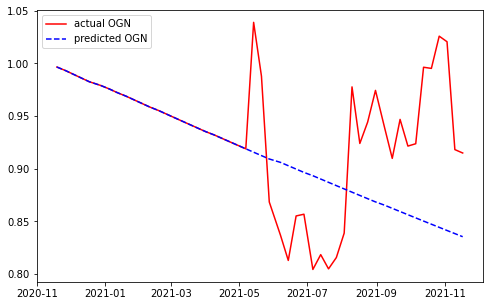

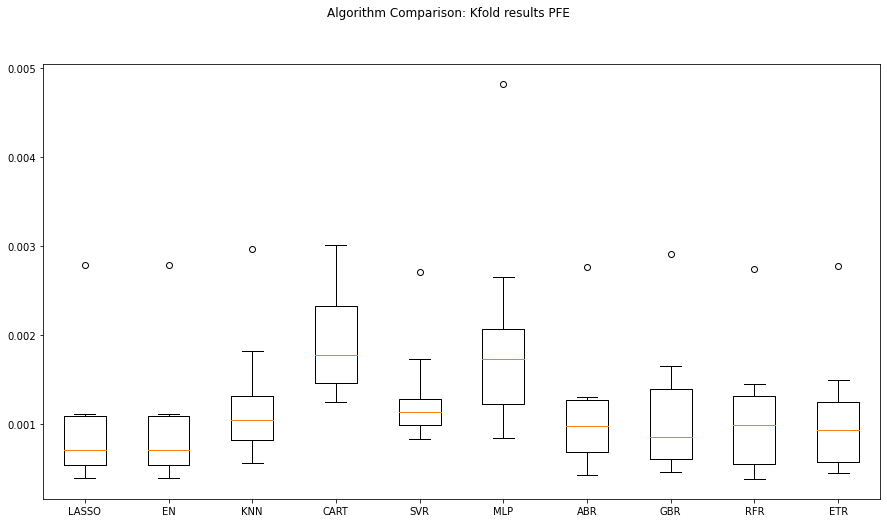

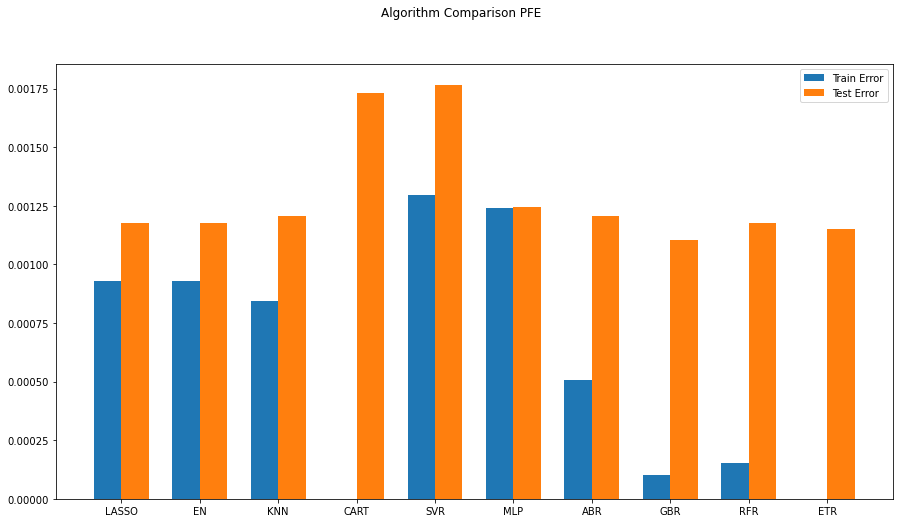

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0012310098757775008
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

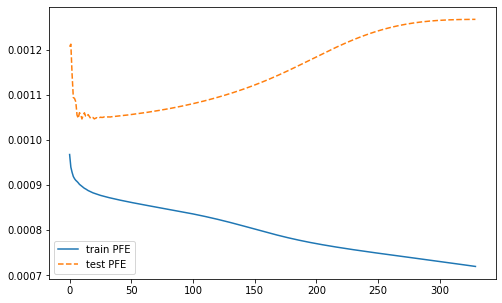

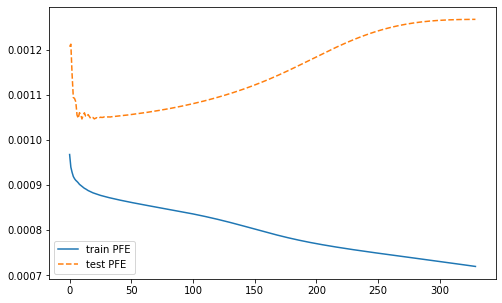

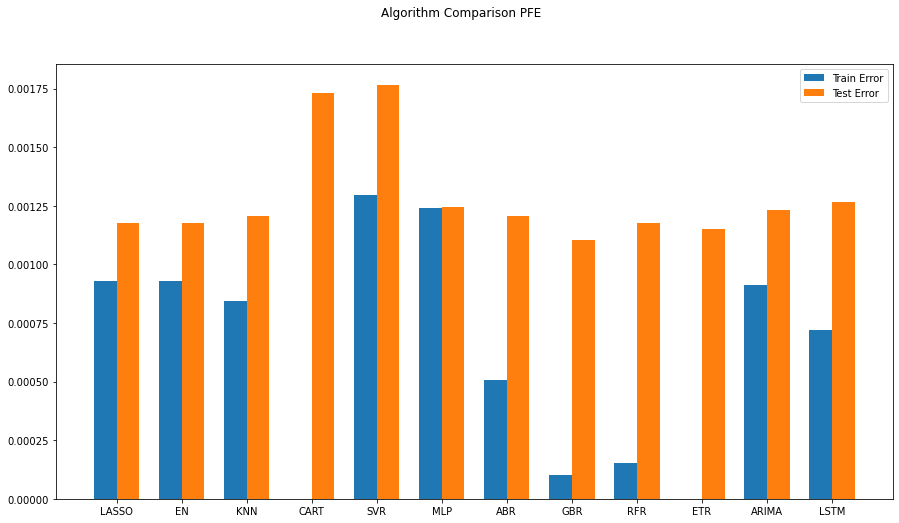

ARIMA(0, 0, 0) MSE=0.0009070
ARIMA(0, 0, 1) MSE=0.0009070
ARIMA(1, 0, 0) MSE=0.0009070
ARIMA(1, 0, 1) MSE=0.0009051
ARIMA(2, 0, 0) MSE=0.0009060
ARIMA(2, 0, 1) MSE=0.0009025
Best ARIMA(2, 0, 1) MSE=0.0009025
0.0012310098757775008


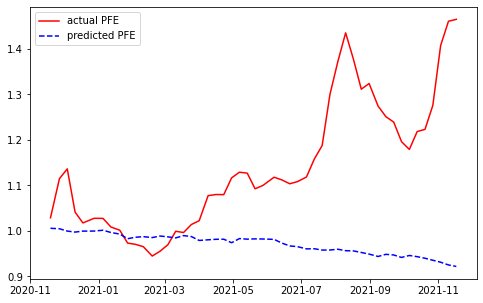

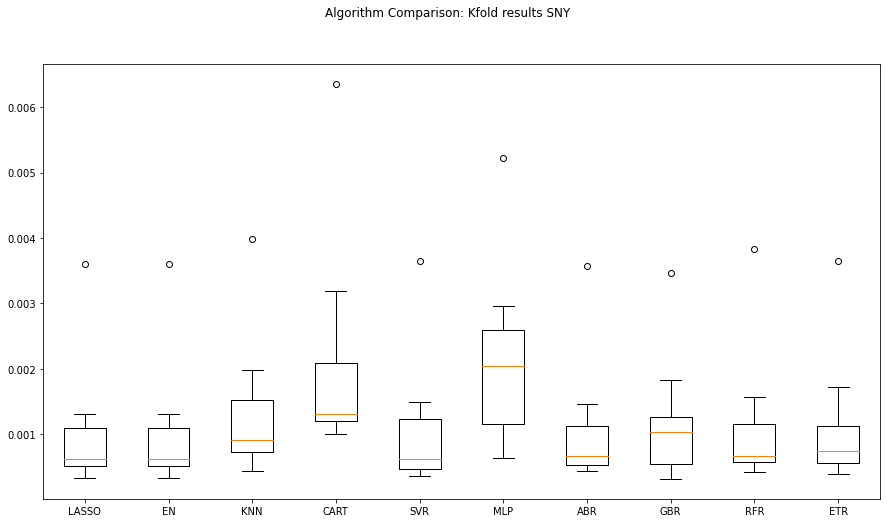

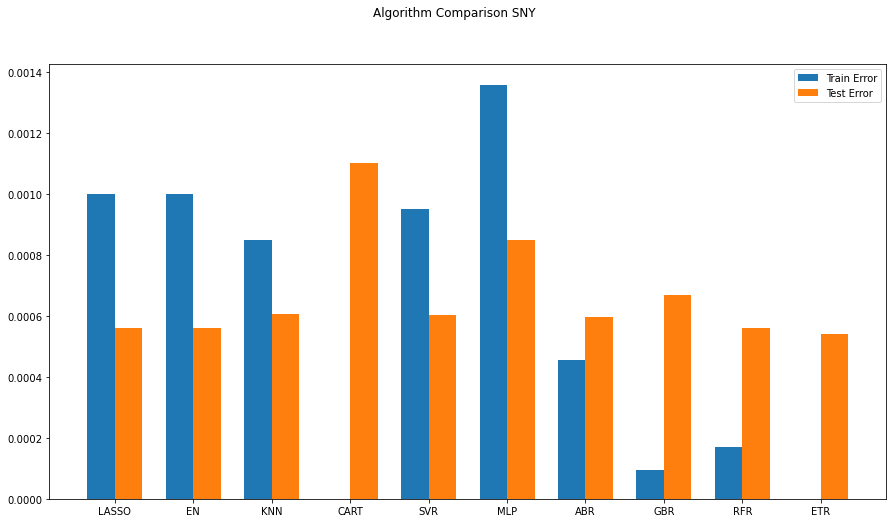

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0005680613405950656
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

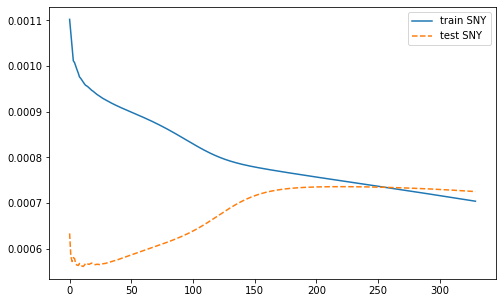

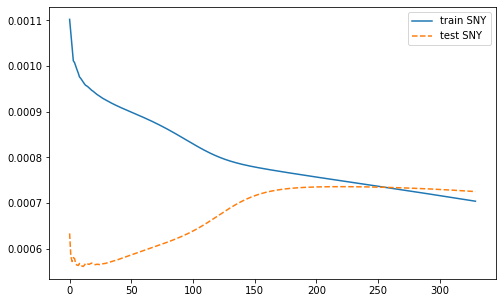

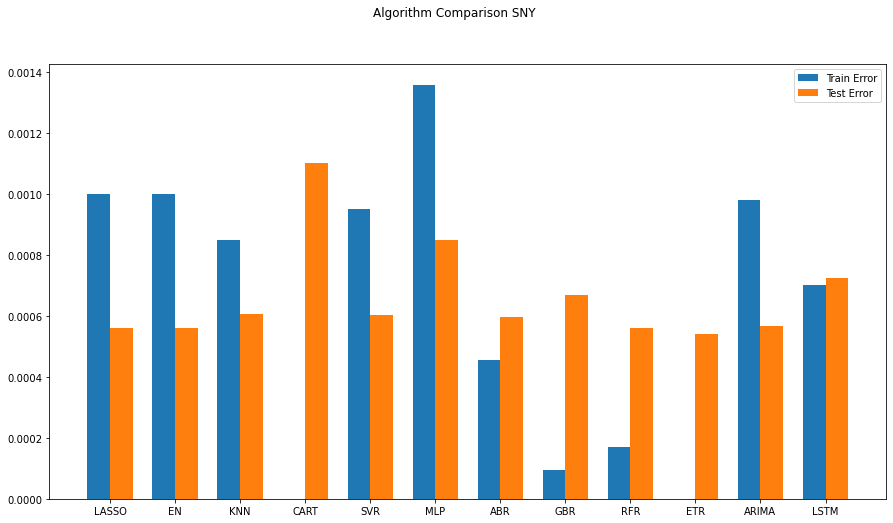

ARIMA(0, 0, 0) MSE=0.0009758
ARIMA(0, 0, 1) MSE=0.0009705
ARIMA(1, 0, 0) MSE=0.0009726
ARIMA(1, 0, 1) MSE=0.0009493
ARIMA(2, 0, 0) MSE=0.0009535
ARIMA(2, 0, 1) MSE=0.0009488
Best ARIMA(2, 0, 1) MSE=0.0009488
0.0005680613405950656


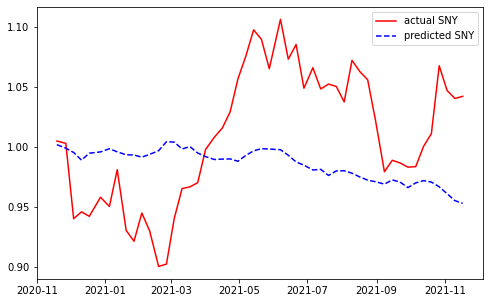

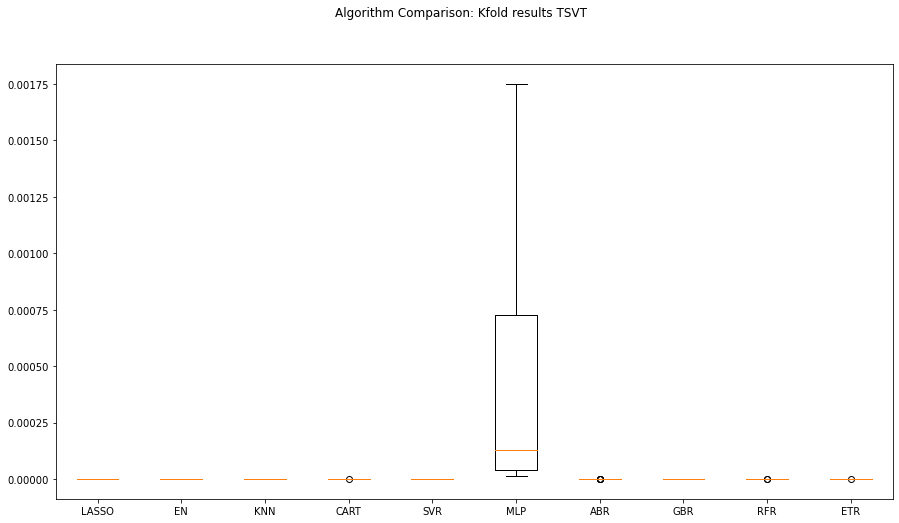

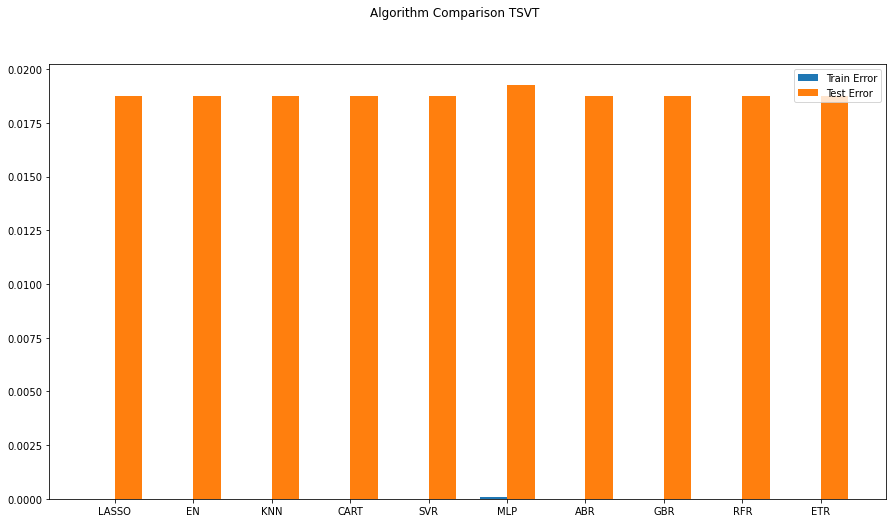

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.018729480191353443
(51, 2, 6)
[[[0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0.]
  [0. 

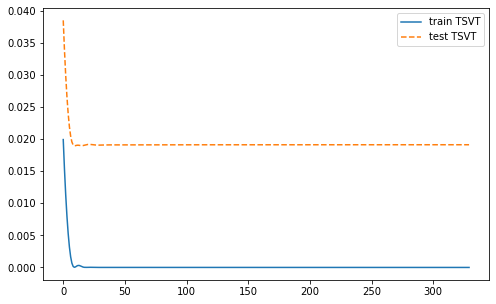

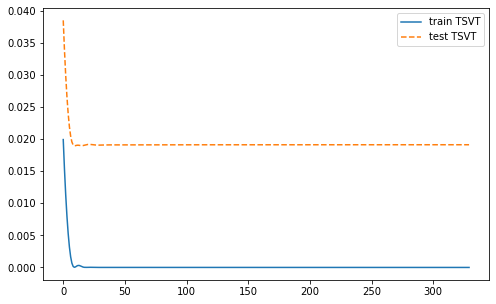

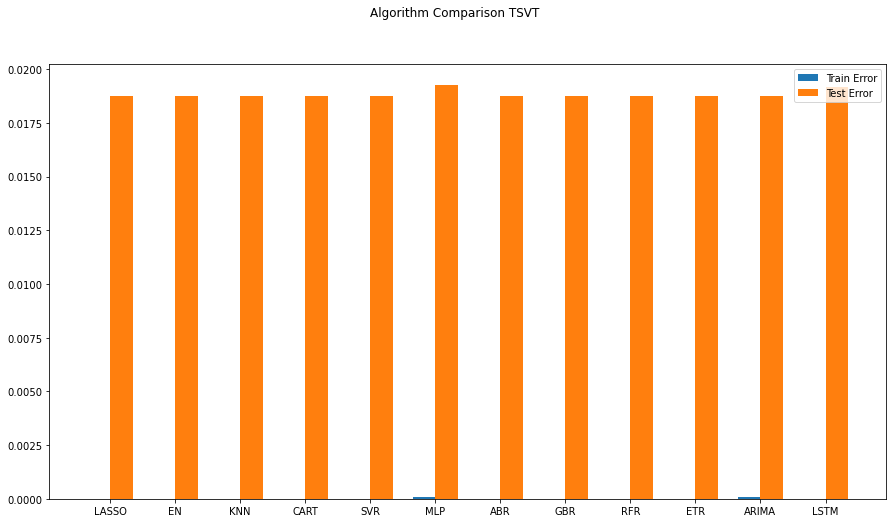

ARIMA(0, 0, 0) MSE=0.0000000
ARIMA(0, 0, 1) MSE=0.0000000
ARIMA(1, 0, 0) MSE=0.0000000
ARIMA(1, 0, 1) MSE=0.0000000
ARIMA(2, 0, 0) MSE=0.0000000
ARIMA(2, 0, 1) MSE=0.0000000
Best ARIMA(1, 0, 1) MSE=0.0000000
0.018729480191353443


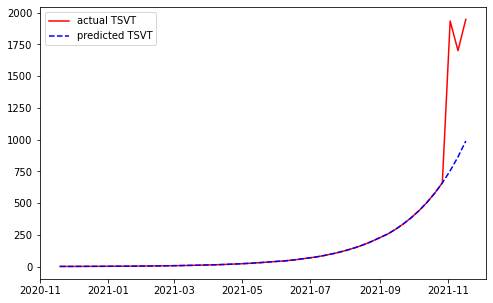

In [71]:
# This is one by one
# LSTM Network
def create_LSTMmodel(learn_rate = 0.01, momentum=0): # create model
        model = Sequential()
        model.add(LSTM(50, input_shape=(X_train_LSTM.shape[1],X_train_LSTM.shape[2])))
        model.add(Dense(1))

        #More cells can be added if needed model.add(Dense(1))
        optimizer = SGD(lr=learn_rate, momentum=momentum) 
        model.compile(loss='mse', optimizer='adam')
        return model
    
def evaluate_arima_model(arima_order):
#predicted = list() 
    modelARIMA=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=arima_order) 
    model_fit = modelARIMA.fit()
    error = mean_squared_error(Y_temp, model_fit.fittedvalues)
    return error

# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(p_values, d_values, q_values): 
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q) 
                try:
                    mse = evaluate_arima_model(order) 
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.7f' % (order,mse))
                except: 
                    continue
    print('Best ARIMA%s MSE=%.7f' % (best_cfg, best_score))
    

    
seq_len = 2 #Length of the seq for the LSTM

for i in stk_tickers:
    try:
        X_temp1 = X_train.filter(regex=i, axis=1)
        X_temp2 = X_train.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
        X_temp = pd.concat([X_temp1, X_temp2], axis=1)

        #X_temp = X_train
        Y_temp = Y_train.filter(regex=i, axis=1)

        X_temp_test1 = X_test.filter(regex=i, axis=1)
        X_temp_test2 = X_test.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
        X_temp_test = pd.concat([X_temp_test1, X_temp_test2], axis=1)

        #X_temp_test = X_test
        Y_temp_test = Y_test.filter(regex=i, axis=1)

        temp = X.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
        temp2 = X.filter(regex=i, axis=1)
        X_temp_fulX = pd.concat([temp2, temp], axis=1)
        #X_temp_fulX = X

        #Arima_temp = X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
        #Arima_temp_test = X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]

        names = []

        kfold_results = [] 
        test_results = [] 
        train_results = []
        # Model testing
        for name, model in models:
            names.append(name)
            ## k-fold analysis:
            kfold = KFold(n_splits=num_folds)
            #converted mean squared error to positive. The lower the better
            cv_results = -1* cross_val_score(model, X_temp, Y_temp, cv=kfold, scoring=scoring)
            kfold_results.append(cv_results)
            # Full Training period
            res = model.fit(X_temp, Y_temp)
            train_result = mean_squared_error(res.predict(X_temp), Y_temp) 
            train_results.append(train_result)
            # Test results
            test_result = mean_squared_error(res.predict(X_temp_test), Y_temp_test) 
            test_results.append(test_result)
        # Comparition starts by ticker
        for j in range(0,1):
            fig = pyplot.figure()
            fig.suptitle(f'Algorithm Comparison: Kfold results {i}')
            ax = fig.add_subplot(111)
            pyplot.boxplot(kfold_results)
            ax.set_xticklabels(names)
            fig.set_size_inches(15,8)
            plt.savefig(f"../readme_images/{i}_comparison_Single.png")
            pyplot.show()
        # Error testing
        for k in range(0,1):
            fig = pyplot.figure()
            ind = np.arange(len(names)) # the x locations for the groups
            width = 0.35 # the width of the bars
            fig.suptitle(f'Algorithm Comparison {i}')
            ax = fig.add_subplot(111)
            pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
            pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
            fig.set_size_inches(15,8)
            pyplot.legend()
            ax.set_xticks(ind)
            ax.set_xticklabels(names)
            plt.savefig(f"../readme_images/{i}_error_testing_Single.png")
            pyplot.show()

        # ARIMA and LSTM
        for arimalstm in range(0,1):
    #         X_train_ARIMA=X_temp.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
    #         X_test_ARIMA=X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
    #         X_train_ARIMA=Arima_temp.loc[:, Arima_temp.columns != i]
    #         X_test_ARIMA=Arima_temp_test.loc[:, Arima_temp.columns != i]
    #         X_train_ARIMA=X_temp.loc[:, X_temp.columns != i]
    #         X_test_ARIMA=X_temp_test.loc[:, X_temp_test.columns != i]
            X_train_ARIMA=X_temp.loc[:, ['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
            X_test_ARIMA=X_temp_test.loc[:, ['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]

            tr_len = len(X_train_ARIMA)
            te_len = len(X_test_ARIMA)
            to_len = len(X_temp_fulX)

            print(X_train_ARIMA)

            X_train_ARIMA.index=pd.DatetimeIndex(X_train_ARIMA.index).to_period('W')

            Y_temp.index=pd.DatetimeIndex(Y_temp.index).to_period('W')

            modelARIMA=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=[1,0,0])
            model_fit = modelARIMA.fit(trend='nc')

            error_Training_ARIMA = mean_squared_error(Y_temp, model_fit.fittedvalues)
            predicted = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
            error_Test_ARIMA = mean_squared_error(Y_temp_test,predicted)
            print(error_Test_ARIMA)

            #seq_len = 2 #Length of the seq for the LSTM
            Y_train_LSTM, Y_test_LSTM = np.array(Y_temp)[seq_len-1:], np.array(Y_temp_test) 
            X_train_LSTM = np.zeros((X_temp.shape[0]+1-seq_len, seq_len, X_temp.shape[1]))
            X_test_LSTM = np.zeros((X_temp_test.shape[0], seq_len, X_temp_fulX.shape[1]))
            print(X_test_LSTM.shape)
            print(X_test_LSTM)

            for l in range(seq_len):
                X_train_LSTM[:, l, :] = np.array(X_temp)[l:X_temp.shape[0]+l+1-seq_len, :]
                X_test_LSTM[:, l, :] = np.array(X_temp_fulX)[X_temp.shape[0]+l-1:X_temp_fulX.shape[0]+l+1-seq_len, :]
            print(X_test_LSTM.shape)
            print(X_test_LSTM)

            LSTMModel = create_LSTMmodel(learn_rate = 0.01, momentum=0)
            LSTMModel_fit = LSTMModel.fit(X_train_LSTM, Y_train_LSTM, validation_data=(X_test_LSTM, Y_test_LSTM),epochs=330, batch_size=72, verbose=0, shuffle=False)

            for m in range(seq_len):
                pyplot.plot(LSTMModel_fit.history['loss'], label=f'train {i}', )
                pyplot.plot(LSTMModel_fit.history['val_loss'], '--',label=f'test {i}',)
                pyplot.legend()
                plt.savefig(f"../readme_images/{i}_train_test_Single.png")
                pyplot.show()

            error_Training_LSTM = mean_squared_error(Y_train_LSTM,LSTMModel.predict(X_train_LSTM))
            predicted = LSTMModel.predict(X_test_LSTM)
            error_Test_LSTM = mean_squared_error(Y_temp_test,predicted)

            test_results.append(error_Test_ARIMA)
            test_results.append(error_Test_LSTM)
            train_results.append(error_Training_ARIMA)
            train_results.append(error_Training_LSTM)
            names.append("ARIMA")
            names.append("LSTM")

            for n in range(0,1):
                fig = pyplot.figure()
                ind = np.arange(len(names)) # the x locations for the groups
                width = 0.35 # the width of the bars
                fig.suptitle(f'Algorithm Comparison {i}')
                ax = fig.add_subplot(111)
                pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
                pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
                fig.set_size_inches(15,8)
                pyplot.legend()
                ax.set_xticks(ind)
                ax.set_xticklabels(names)
                plt.savefig(f"../readme_images/{i}_train_test_error_Single.png")
                pyplot.show()

            p_values = [0, 1, 2]
            d_values = range(0, 2)
            q_values = range(0, 2)
            #warnings.filterwarnings("ignore")
            evaluate_models(p_values, d_values, q_values)

            modelARIMA_tuned=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=[2,0,1])
            model_fit_tuned = modelARIMA_tuned.fit(trend='nc')
            # estimate accuracy on validation set
            predicted_tuned = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
            print(mean_squared_error(Y_temp_test,predicted_tuned))

            # plotting the actual data versus predicted data
            for o in range(0,1):
                predicted_tuned.index = Y_temp_test.index
                pyplot.plot(np.exp(Y_temp_test).cumprod(), 'r', label=f'actual {i}',)
                # plotting t, a separately
                pyplot.plot(np.exp(predicted_tuned).cumprod(), 'b--', label=f'predicted {i}')
                pyplot.legend()
                pyplot.rcParams["figure.figsize"] = (8,5)
                plt.savefig(f"../readme_images/{i}_predictions_Single.png")
                pyplot.show()
    except:
        pass
    

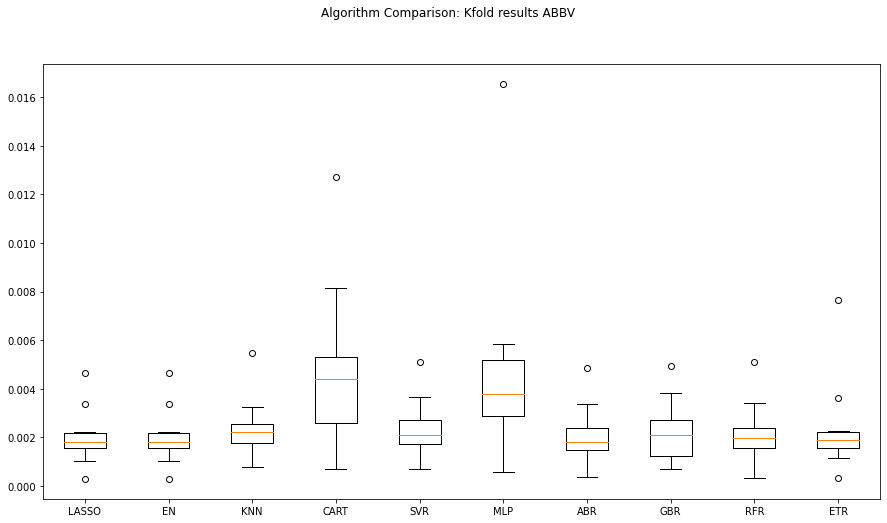

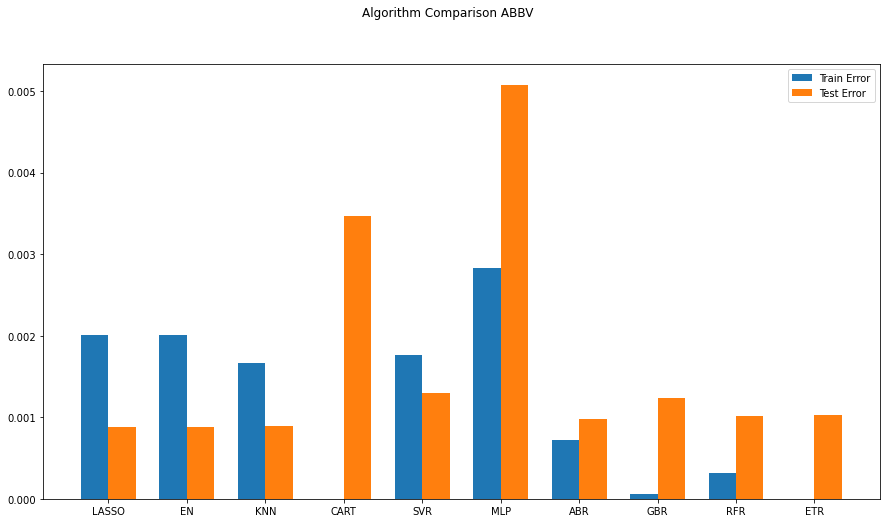

                AMGN       AZN      BIIB       BMY      CRXT      GILD  \
2016-11-22  0.001967  0.003780 -0.000648  0.000757 -0.020242  0.000291   
2016-11-30 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242 -0.010259   
2016-12-07 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242 -0.012562   
2016-12-14  0.051757  0.054210  0.003324  0.057340 -0.020242  0.045887   
2016-12-21 -0.017093 -0.008464 -0.011030  0.003243 -0.020242 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242 -0.005702   
2020-10-22 -0.030370 -0.011291 -0.050538  0.005611 -0.020242 -0.037050   
2020-10-29 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242 -0.035910   
2020-11-05  0.062939  0.077041  0.292538  0.095906 -0.020242  0.018619   
2020-11-12  0.022043  0.030002 -0.308677 -0.015811 -0.020242  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

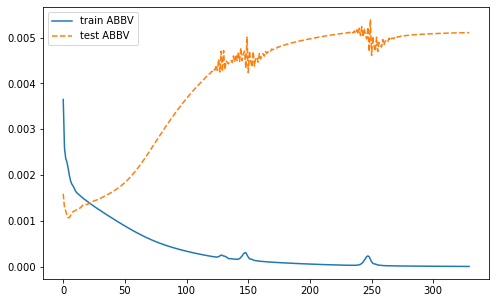

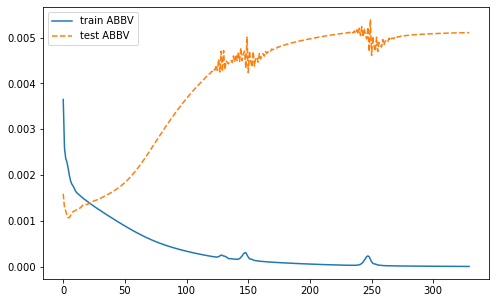

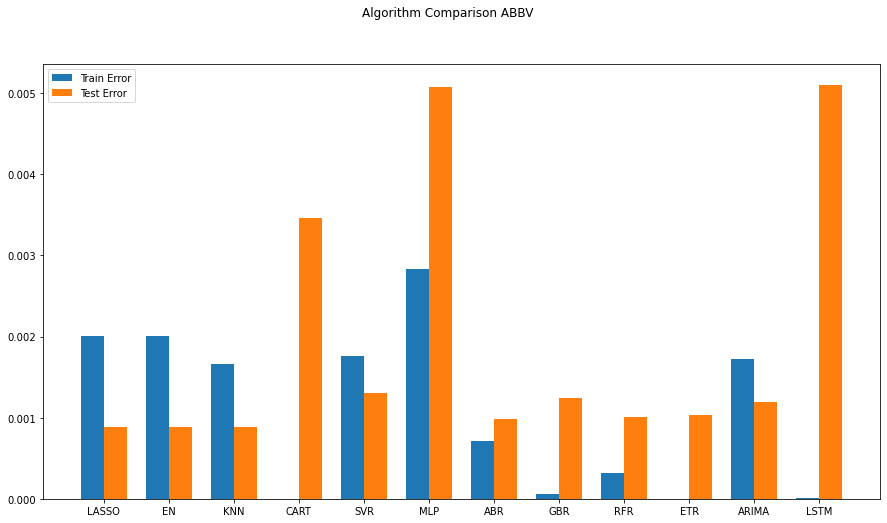

Best ARIMANone MSE=inf
0.0011896960599948408


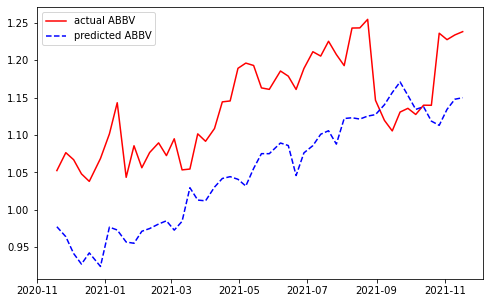

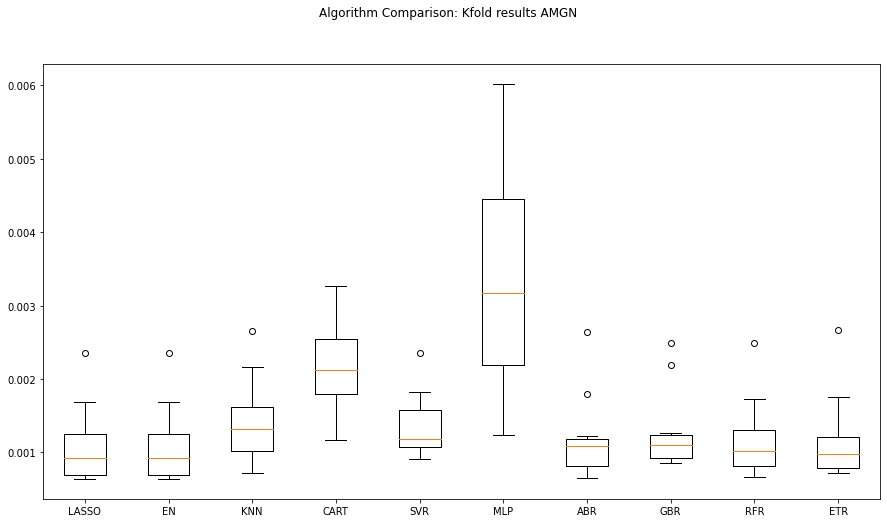

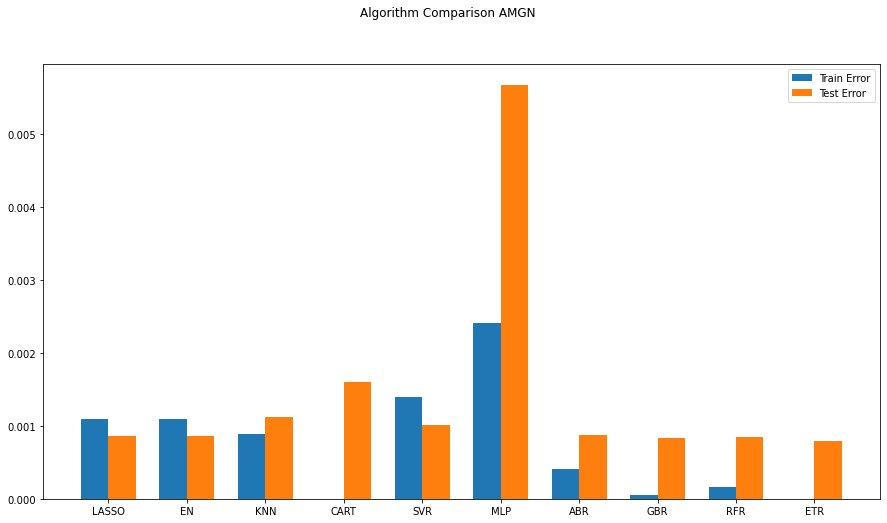

                ABBV       AZN      BIIB       BMY      CRXT      GILD  \
2016-11-22  0.003566  0.003780 -0.000648  0.000757 -0.020242  0.000291   
2016-11-30  0.031240 -0.011033 -0.078579 -0.001947 -0.020242 -0.010259   
2016-12-07 -0.013412 -0.011156 -0.030277 -0.021491 -0.020242 -0.012562   
2016-12-14  0.027620  0.054210  0.003324  0.057340 -0.020242  0.045887   
2016-12-21 -0.003574 -0.008464 -0.011030  0.003243 -0.020242 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.028884 -0.022166 -0.019666 -0.020242 -0.005702   
2020-10-22 -0.010853 -0.011291 -0.050538  0.005611 -0.020242 -0.037050   
2020-10-29 -0.044134 -0.017277 -0.083284 -0.047869 -0.020242 -0.035910   
2020-11-05  0.149625  0.077041  0.292538  0.095906 -0.020242  0.018619   
2020-11-12  0.040886  0.030002 -0.308677 -0.015811 -0.020242  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

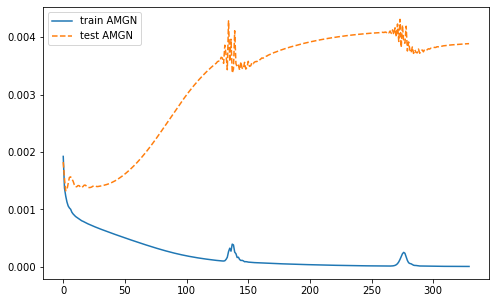

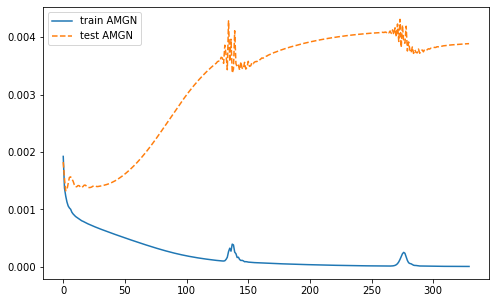

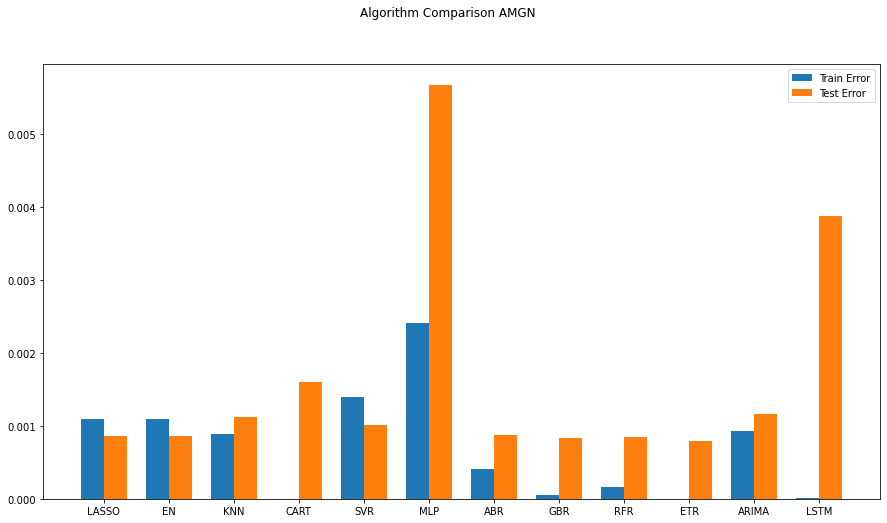

Best ARIMANone MSE=inf
0.001162130477287724


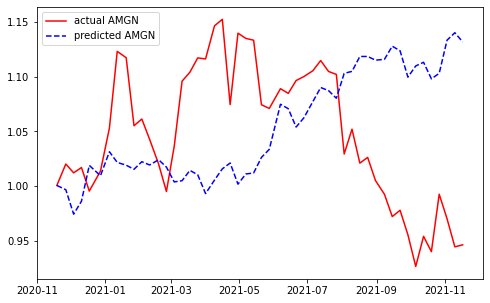

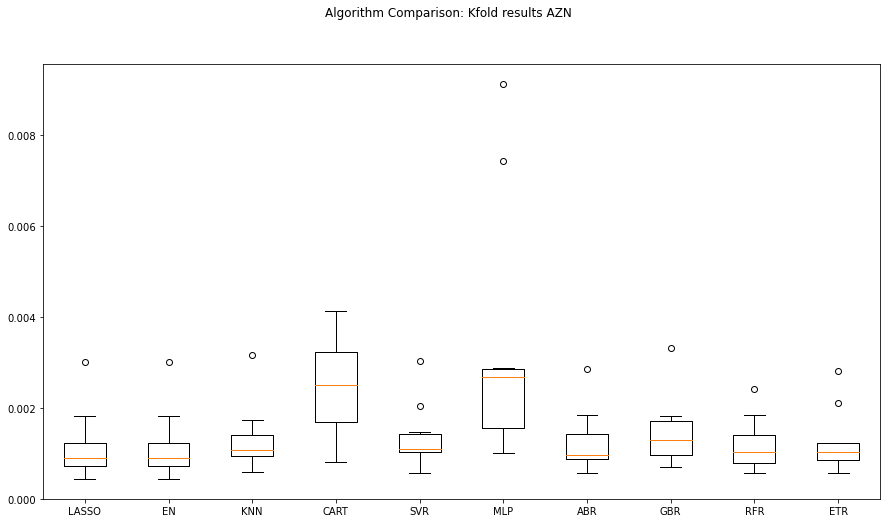

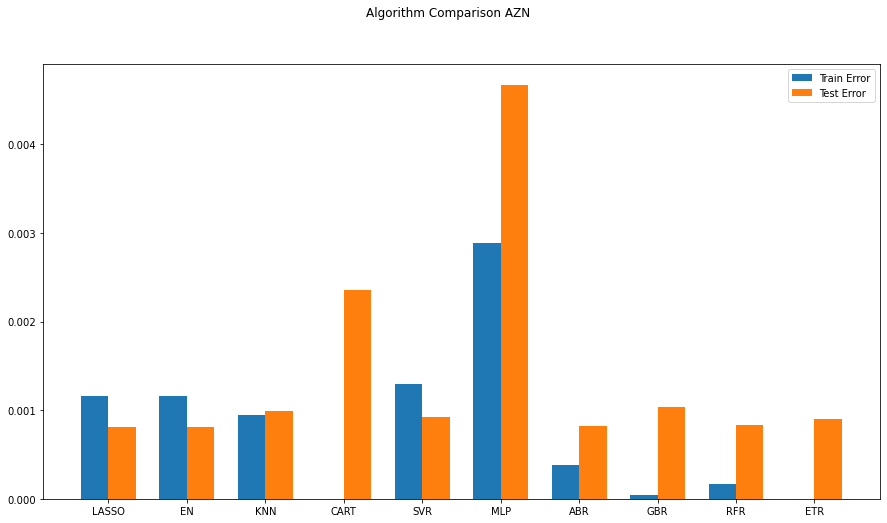

                ABBV      AMGN      BIIB       BMY      CRXT      GILD  \
2016-11-22  0.003566  0.001967 -0.000648  0.000757 -0.020242  0.000291   
2016-11-30  0.031240 -0.001803 -0.078579 -0.001947 -0.020242 -0.010259   
2016-12-07 -0.013412 -0.020193 -0.030277 -0.021491 -0.020242 -0.012562   
2016-12-14  0.027620  0.051757  0.003324  0.057340 -0.020242  0.045887   
2016-12-21 -0.003574 -0.017093 -0.011030  0.003243 -0.020242 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.022166 -0.019666 -0.020242 -0.005702   
2020-10-22 -0.010853 -0.030370 -0.050538  0.005611 -0.020242 -0.037050   
2020-10-29 -0.044134 -0.045589 -0.083284 -0.047869 -0.020242 -0.035910   
2020-11-05  0.149625  0.062939  0.292538  0.095906 -0.020242  0.018619   
2020-11-12  0.040886  0.022043 -0.308677 -0.015811 -0.020242  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

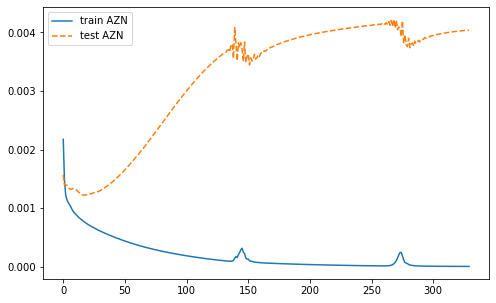

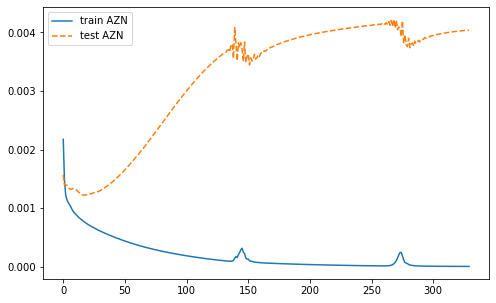

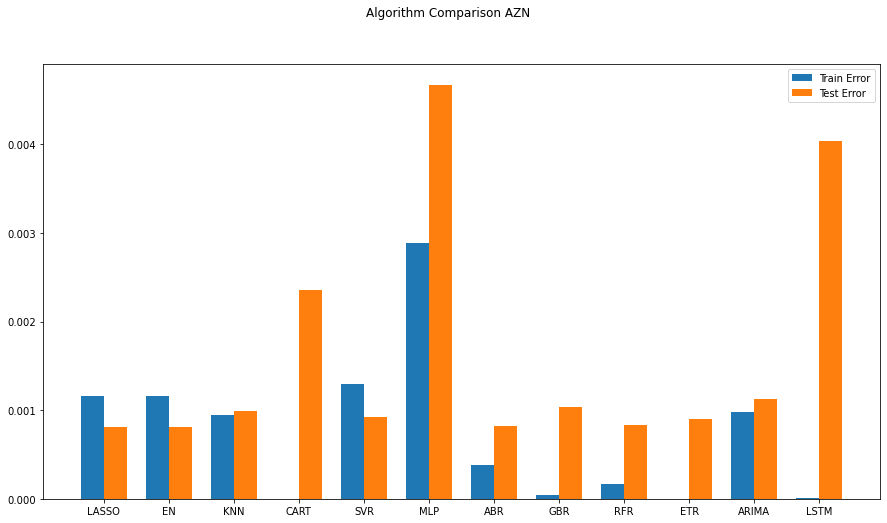

Best ARIMANone MSE=inf
0.0011228061138226291


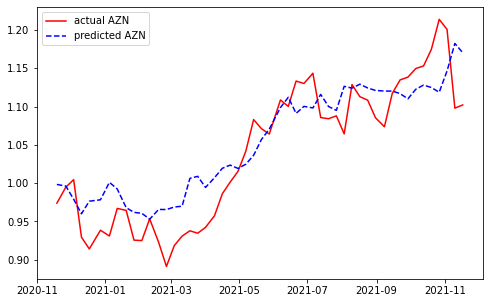

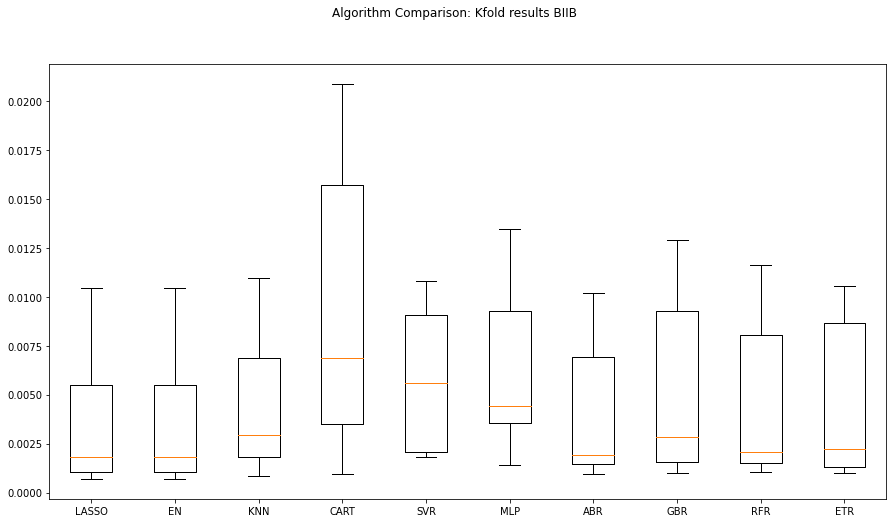

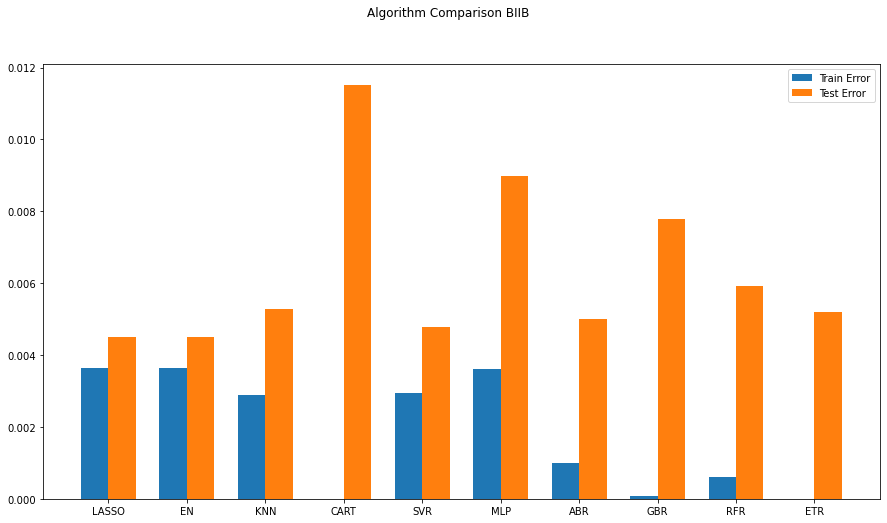

                ABBV      AMGN       AZN       BMY      CRXT      GILD  \
2016-11-22  0.003566  0.001967  0.003780  0.000757 -0.020242  0.000291   
2016-11-30  0.031240 -0.001803 -0.011033 -0.001947 -0.020242 -0.010259   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.021491 -0.020242 -0.012562   
2016-12-14  0.027620  0.051757  0.054210  0.057340 -0.020242  0.045887   
2016-12-21 -0.003574 -0.017093 -0.008464  0.003243 -0.020242 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.019666 -0.020242 -0.005702   
2020-10-22 -0.010853 -0.030370 -0.011291  0.005611 -0.020242 -0.037050   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.047869 -0.020242 -0.035910   
2020-11-05  0.149625  0.062939  0.077041  0.095906 -0.020242  0.018619   
2020-11-12  0.040886  0.022043  0.030002 -0.015811 -0.020242  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

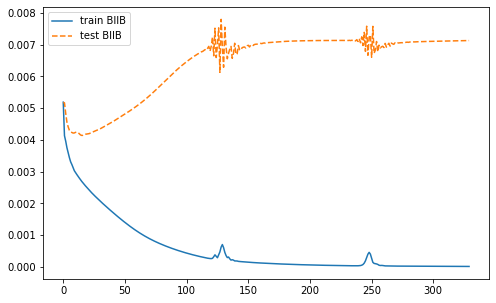

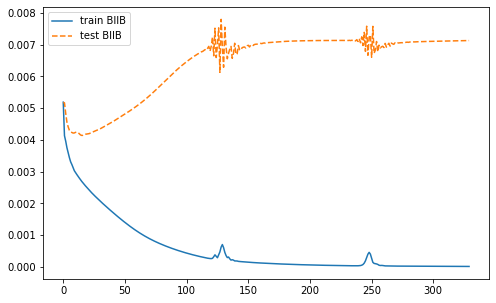

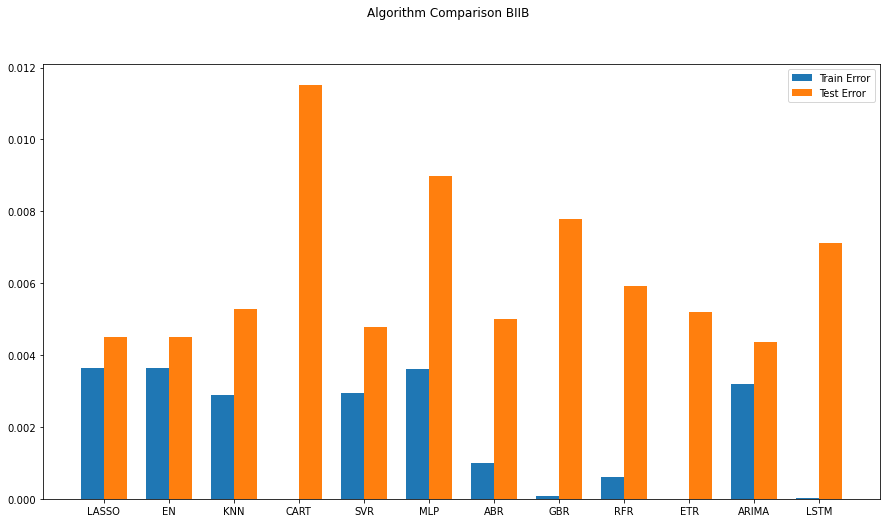

Best ARIMANone MSE=inf
0.004373476080890792


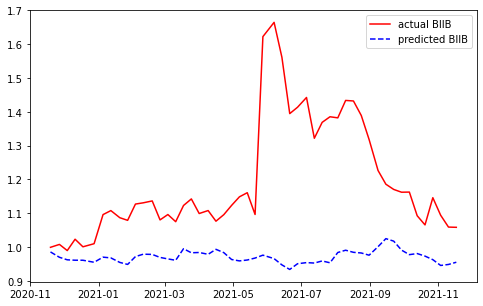

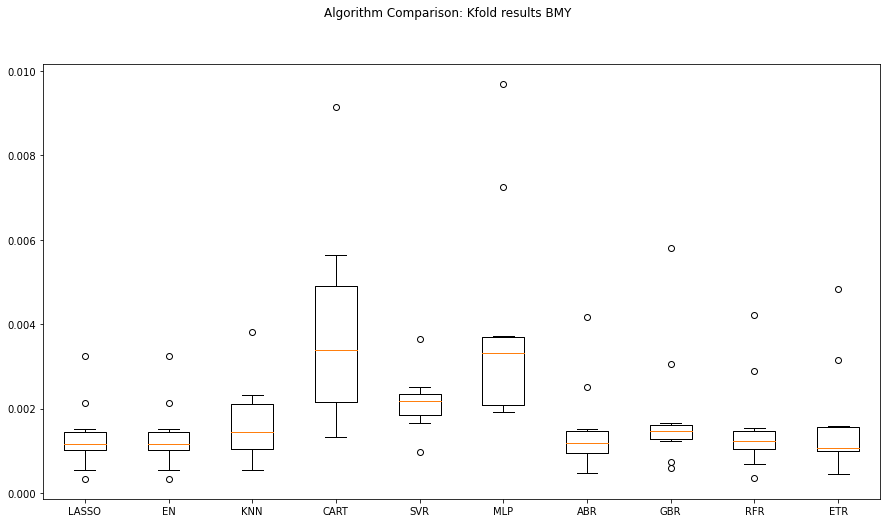

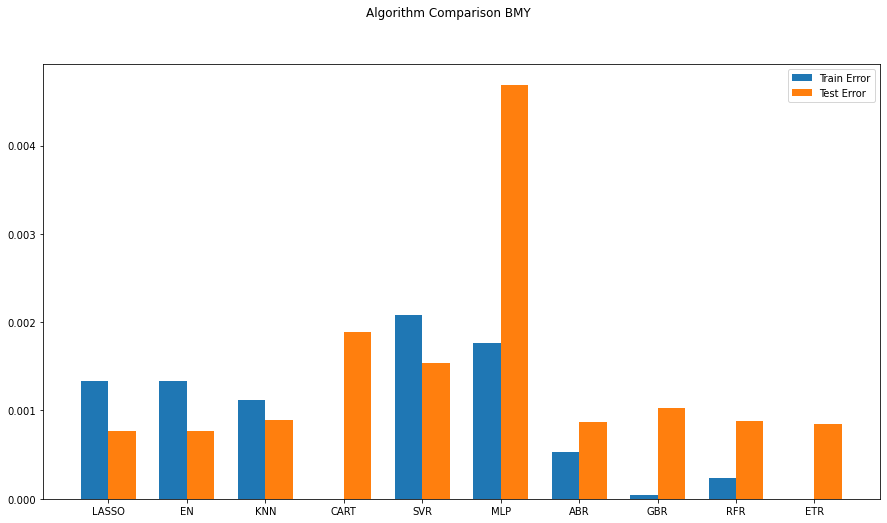

                ABBV      AMGN       AZN      BIIB      CRXT      GILD  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648 -0.020242  0.000291   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.020242 -0.010259   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.020242 -0.012562   
2016-12-14  0.027620  0.051757  0.054210  0.003324 -0.020242  0.045887   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030 -0.020242 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.020242 -0.005702   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538 -0.020242 -0.037050   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.020242 -0.035910   
2020-11-05  0.149625  0.062939  0.077041  0.292538 -0.020242  0.018619   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.020242  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

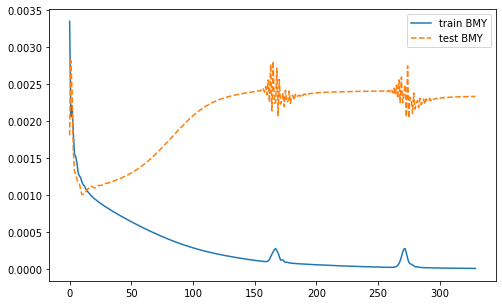

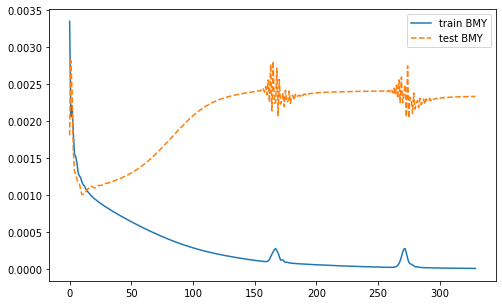

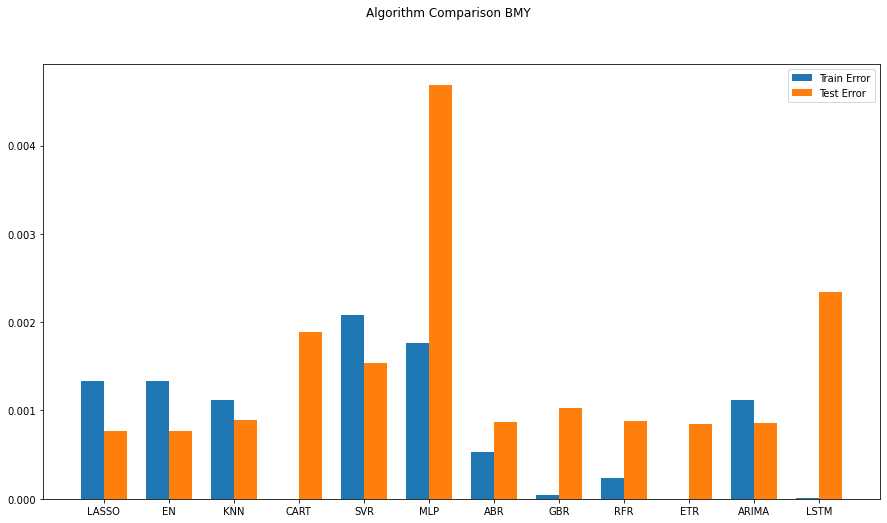

Best ARIMANone MSE=inf
0.0008565199586737588


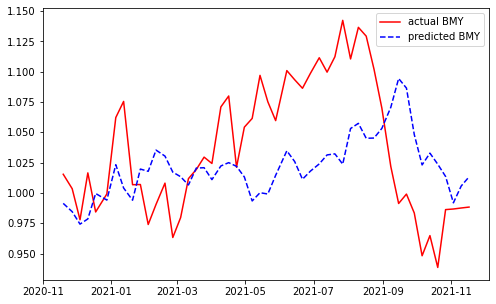

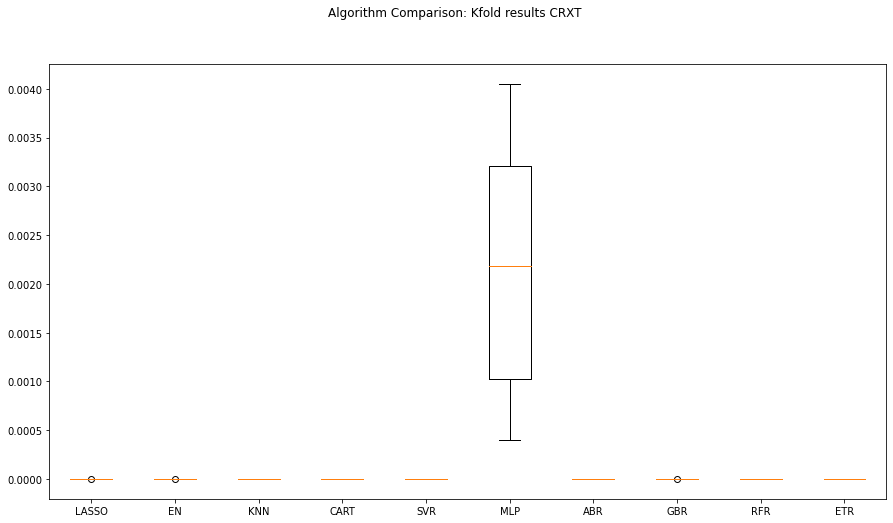

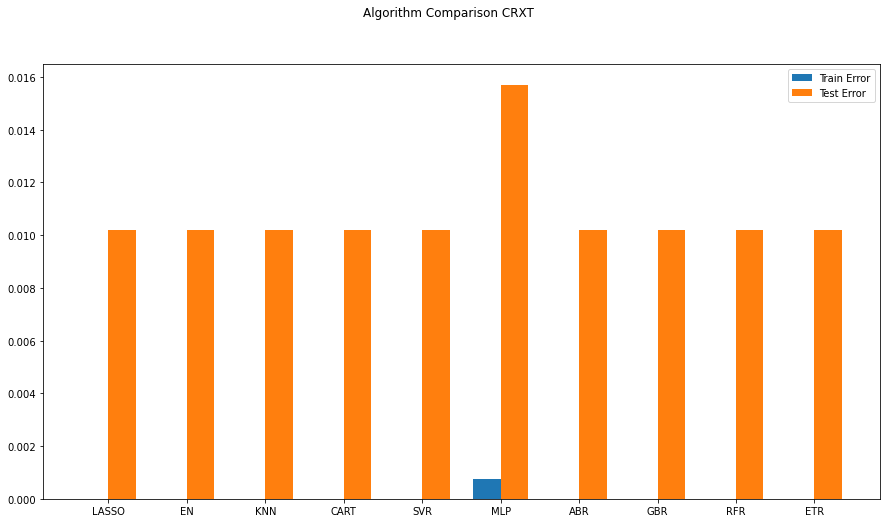

                ABBV      AMGN       AZN      BIIB       BMY      GILD  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757  0.000291   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.010259   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.012562   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340  0.045887   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.005702   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.037050   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.035910   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906  0.018619   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

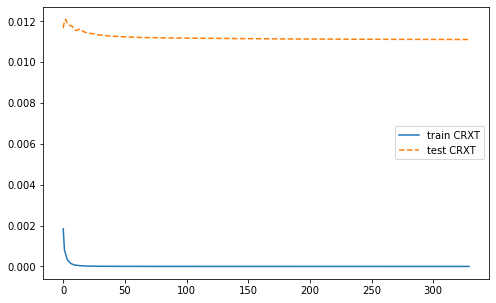

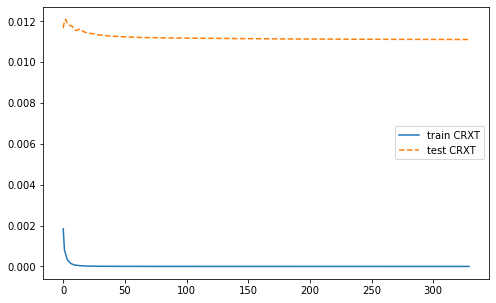

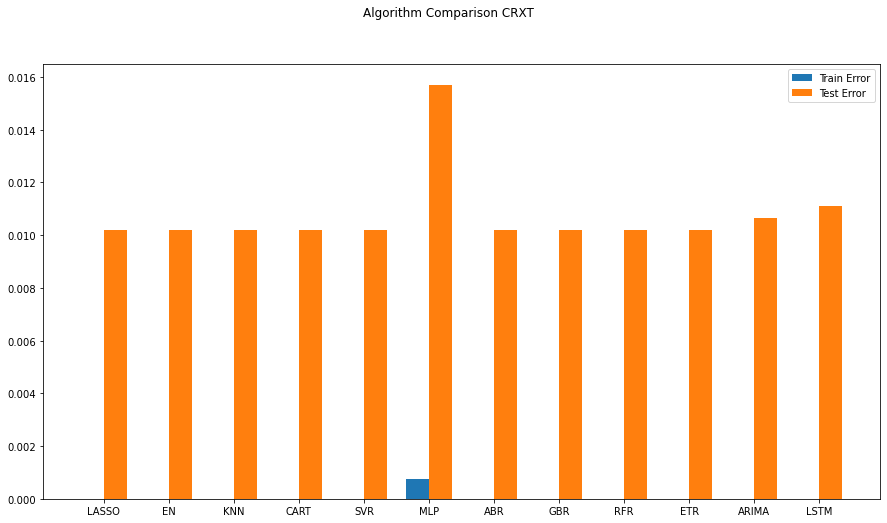

Best ARIMANone MSE=inf
0.010667692675470221


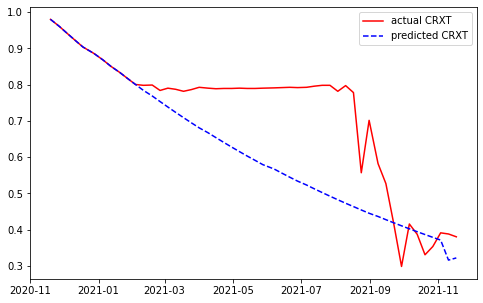

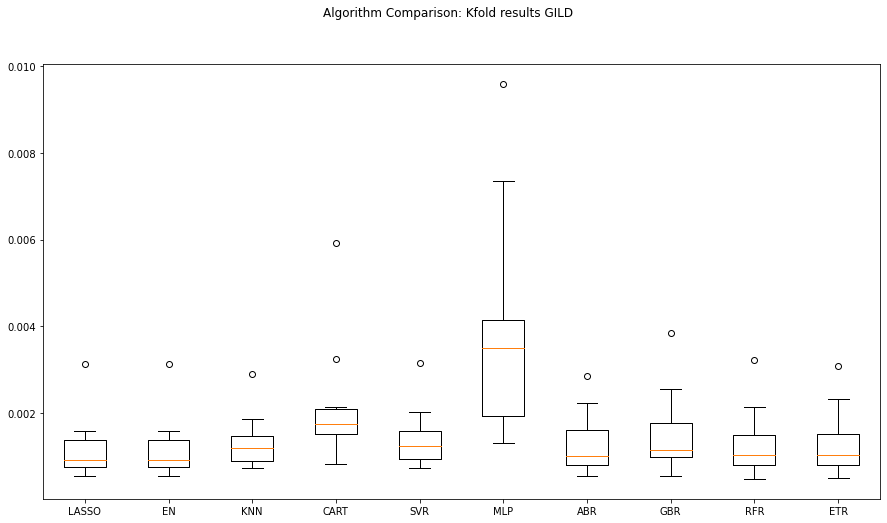

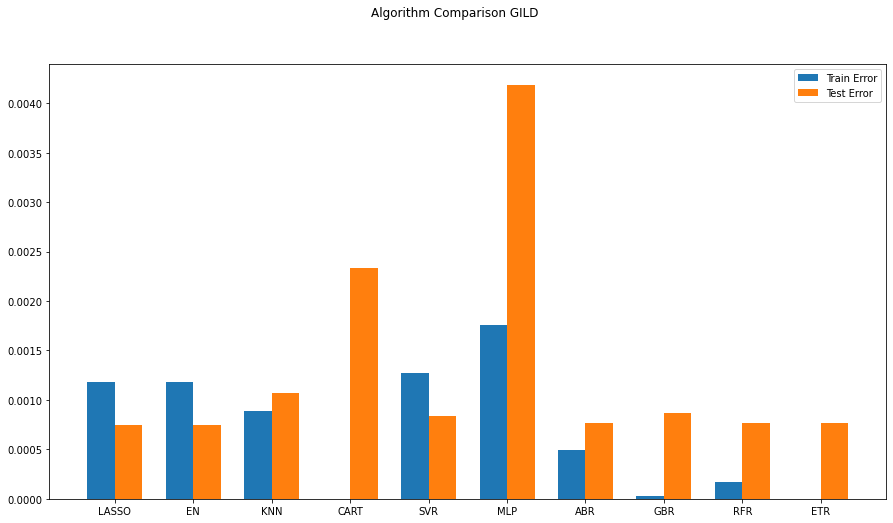

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

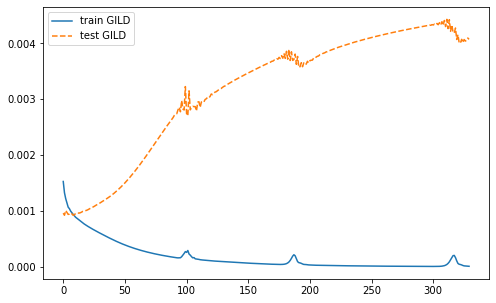

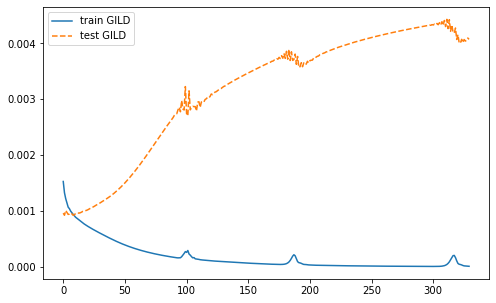

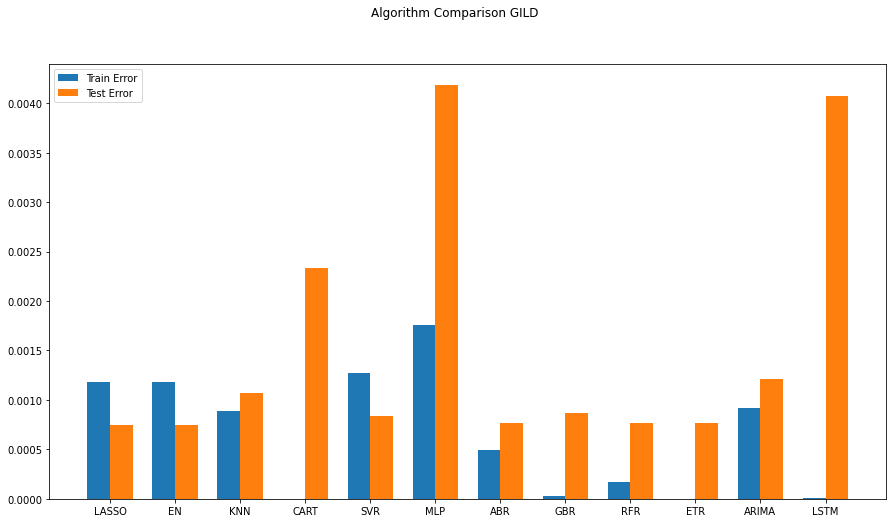

Best ARIMANone MSE=inf
0.0012102523207571491


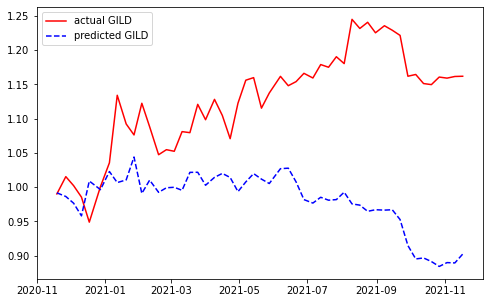

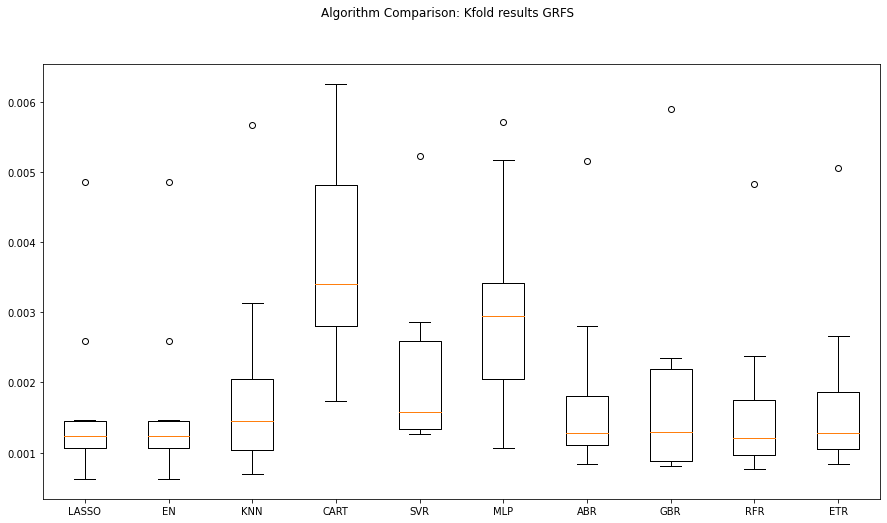

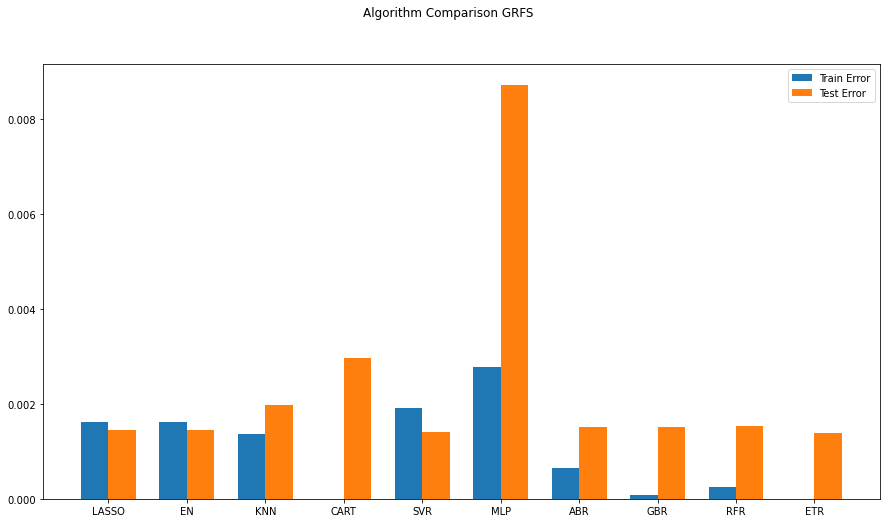

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22  0.000291  0.001406  

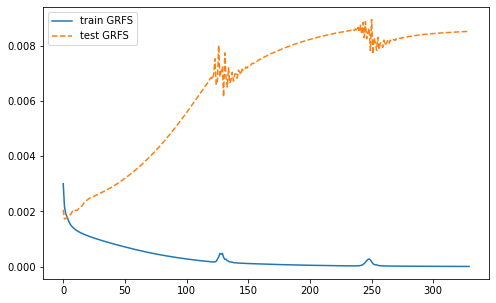

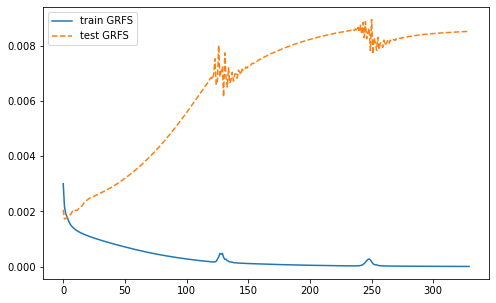

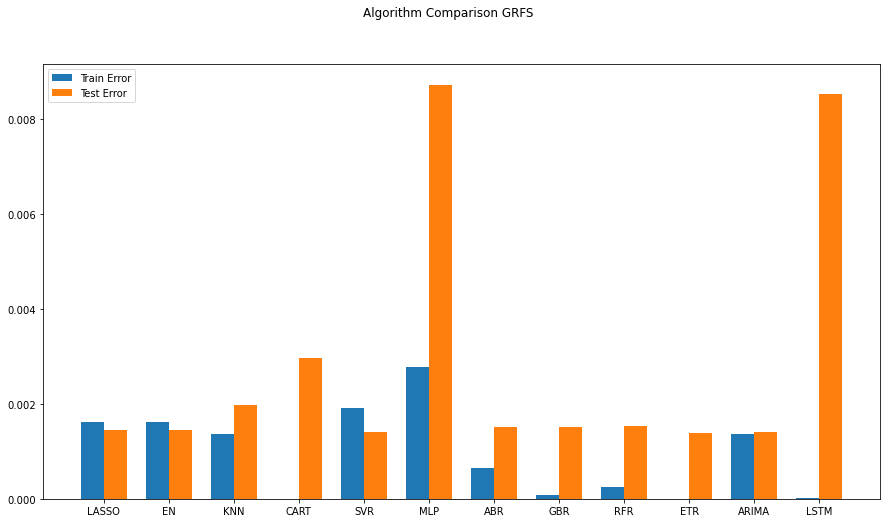

Best ARIMANone MSE=inf
0.0014045689130270898


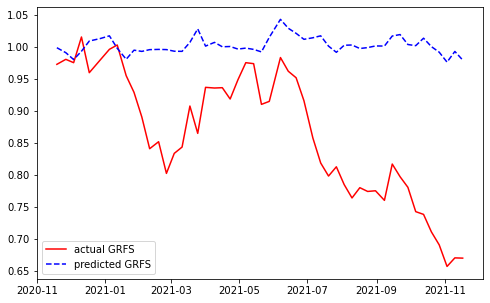

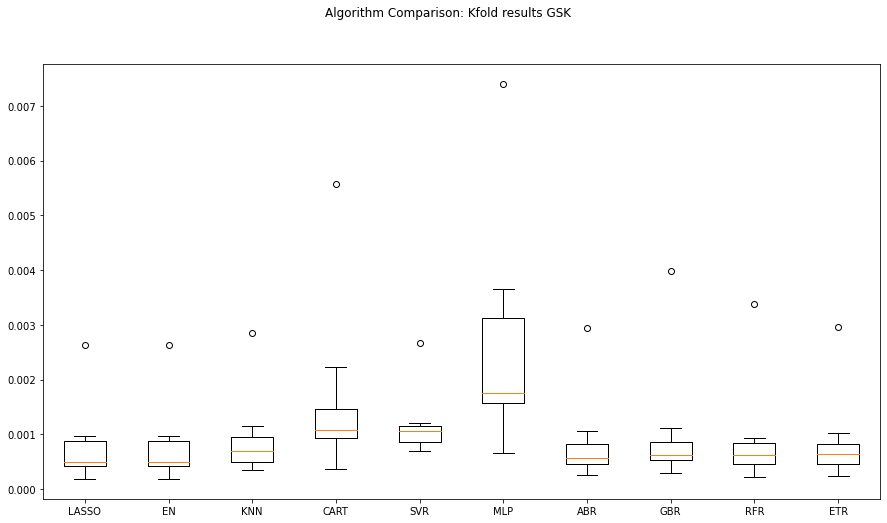

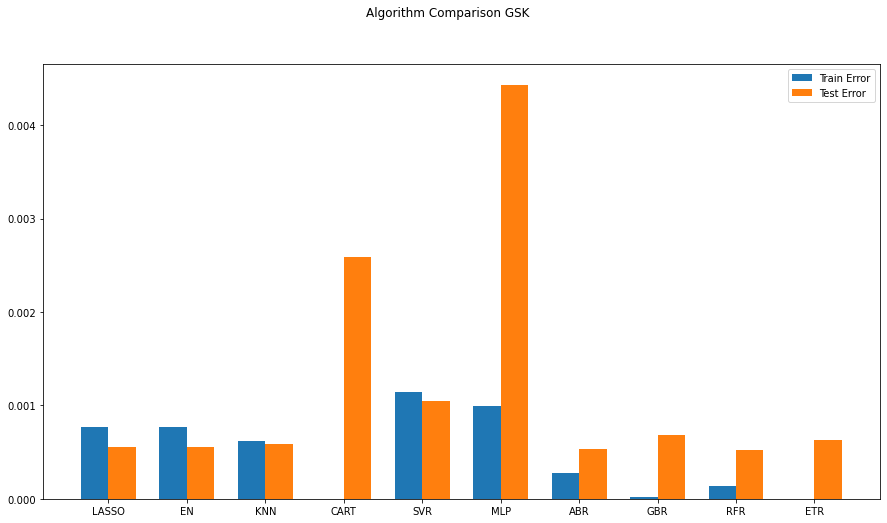

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       HCM      HZNP  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

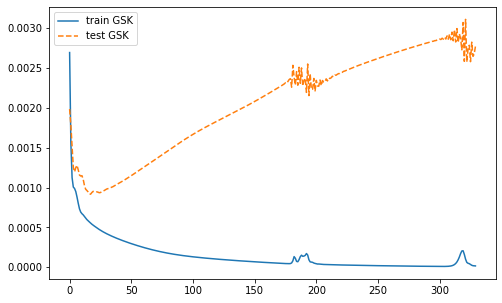

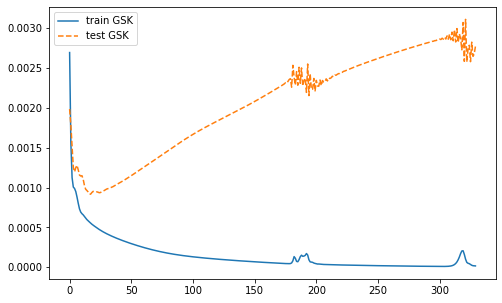

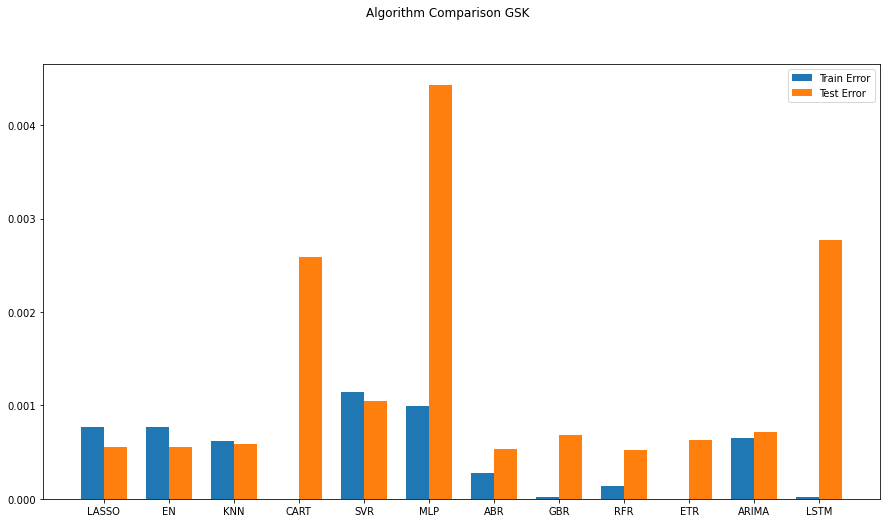

Best ARIMANone MSE=inf
0.0007157569884835082


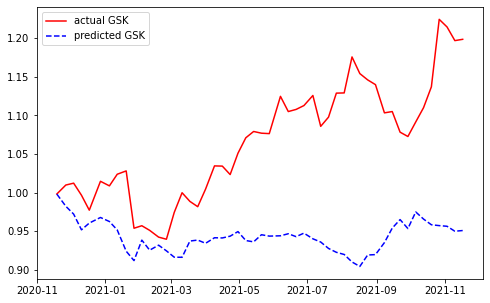

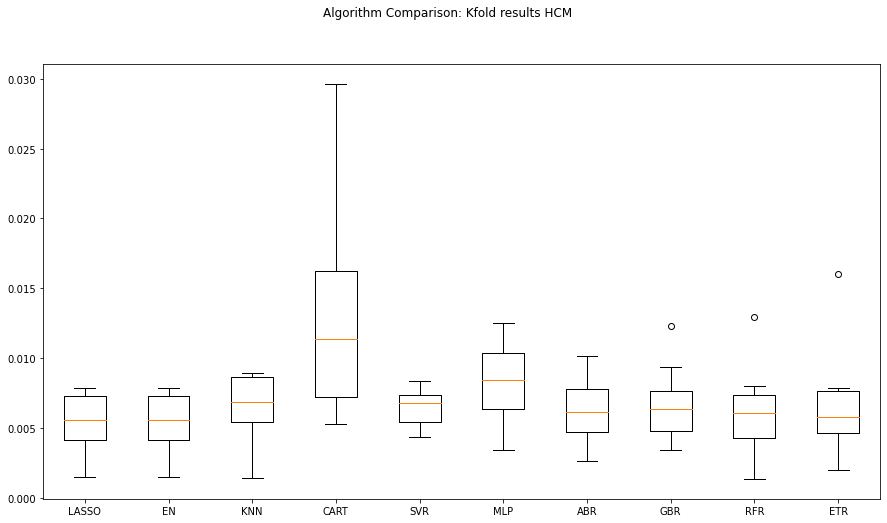

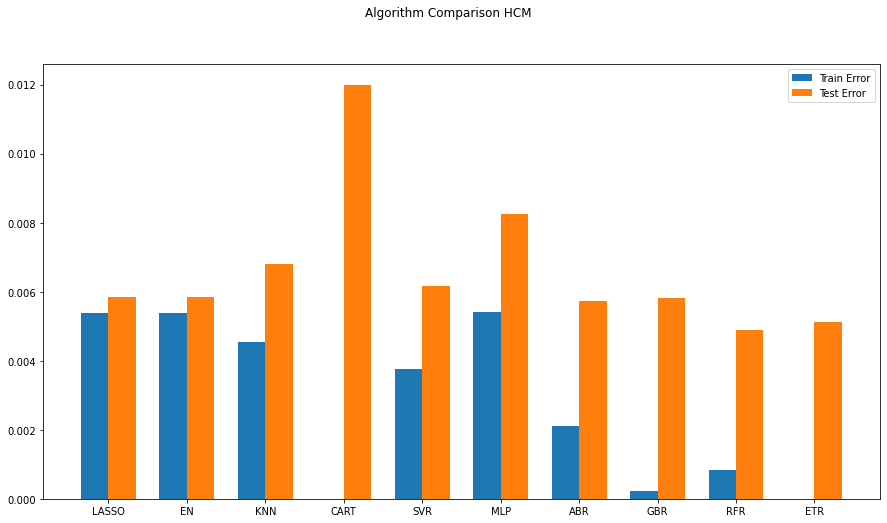

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK      HZNP  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

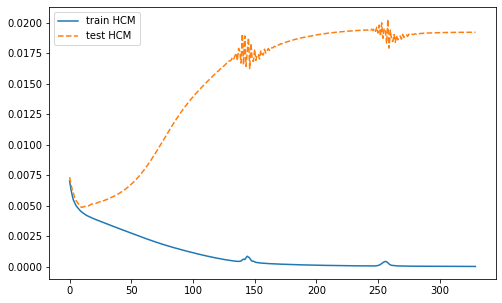

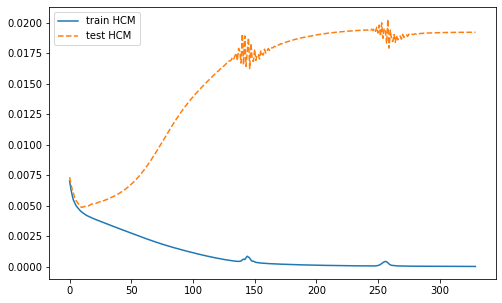

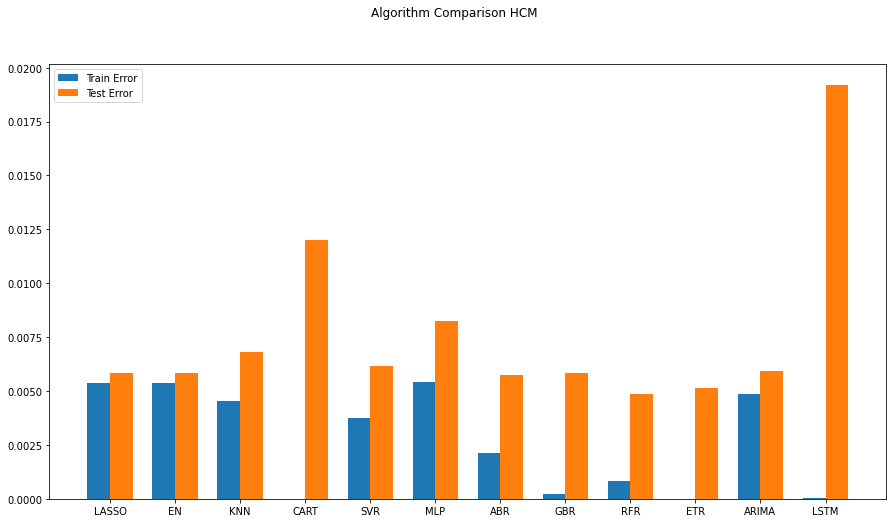

Best ARIMANone MSE=inf
0.005928827088380721


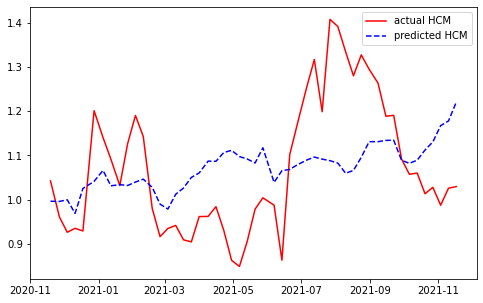

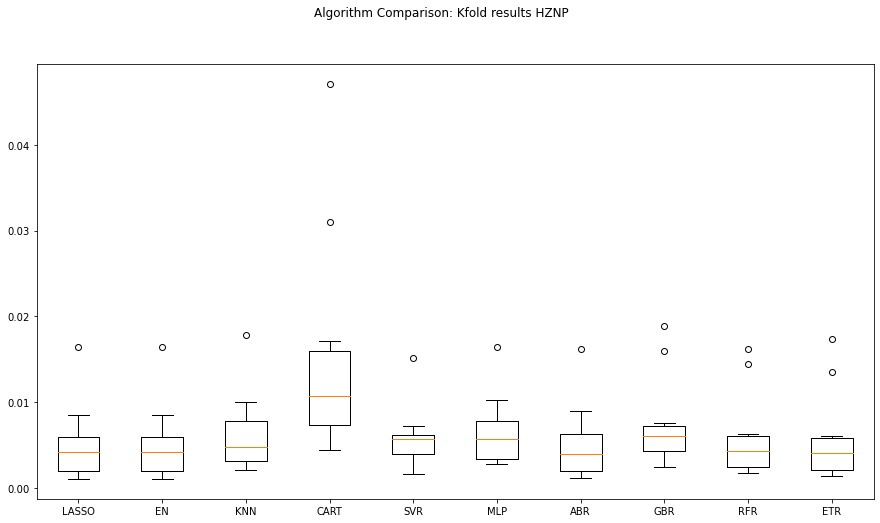

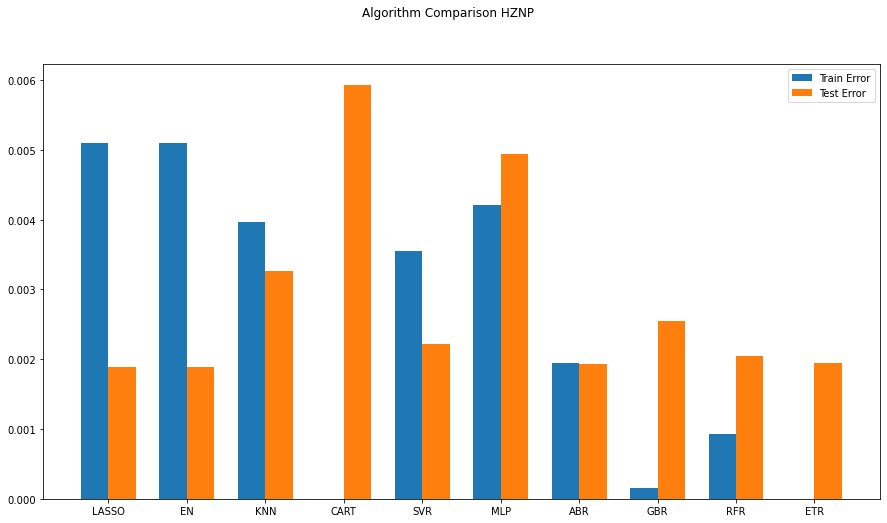

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

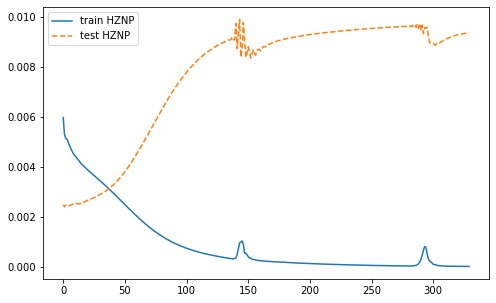

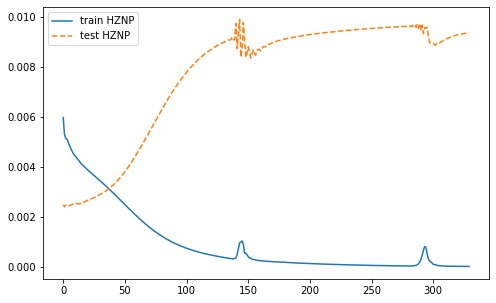

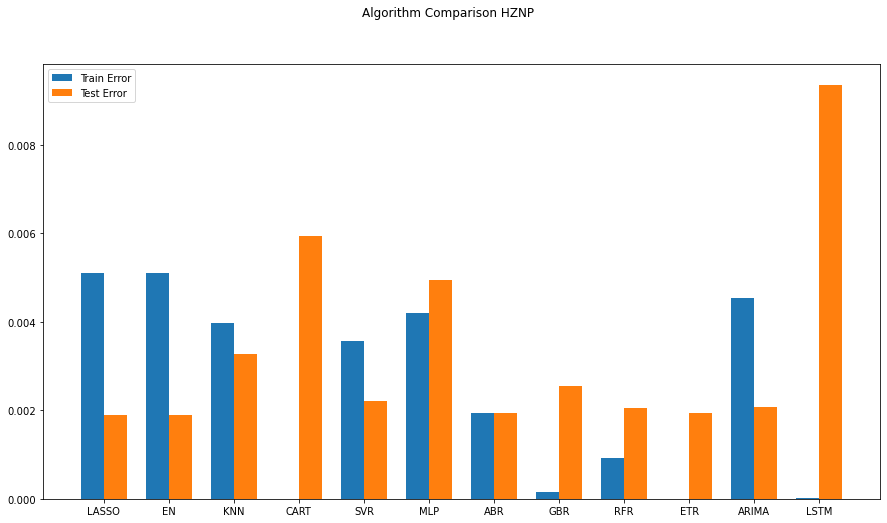

Best ARIMANone MSE=inf
0.0020848393128125825


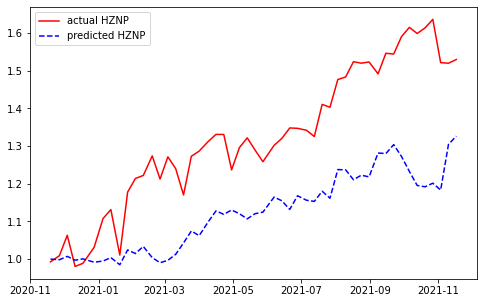

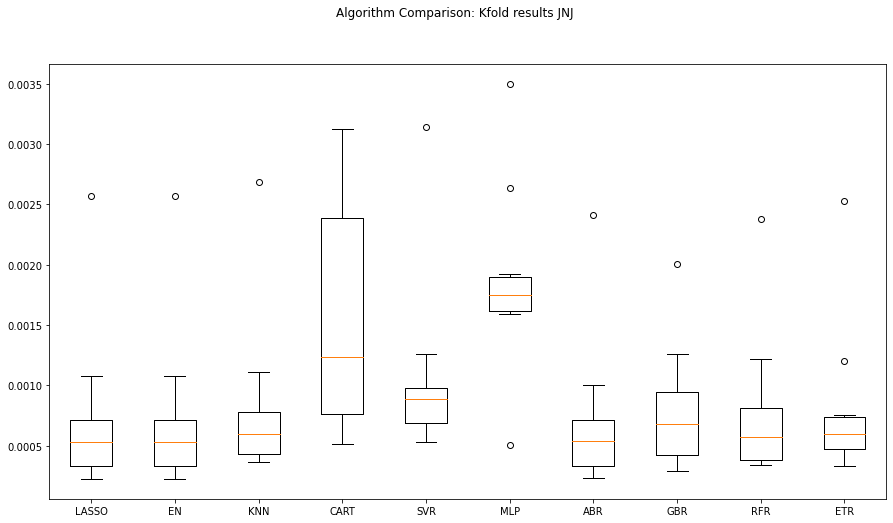

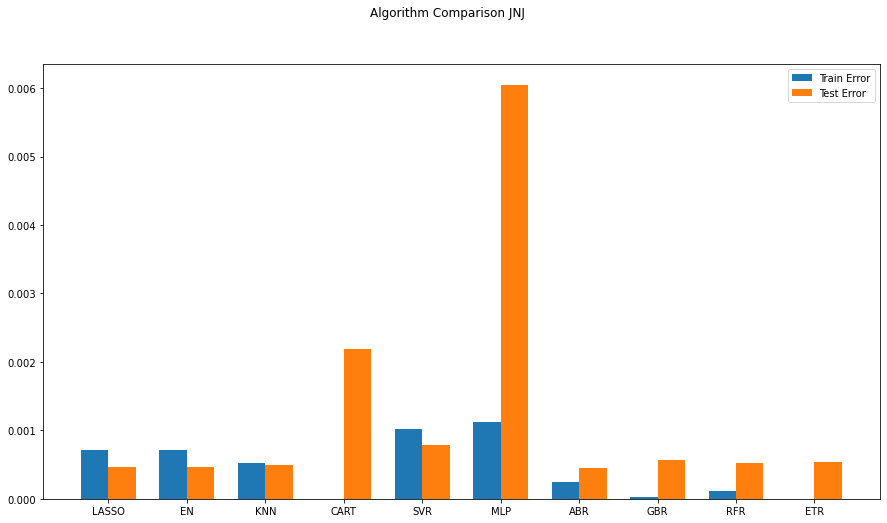

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

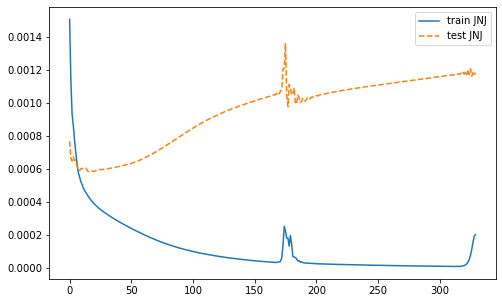

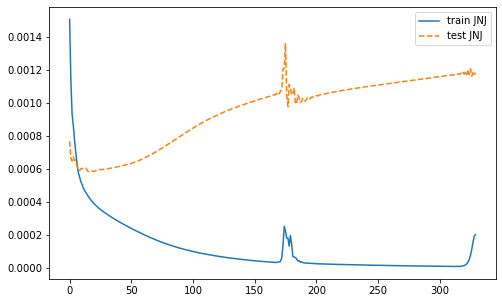

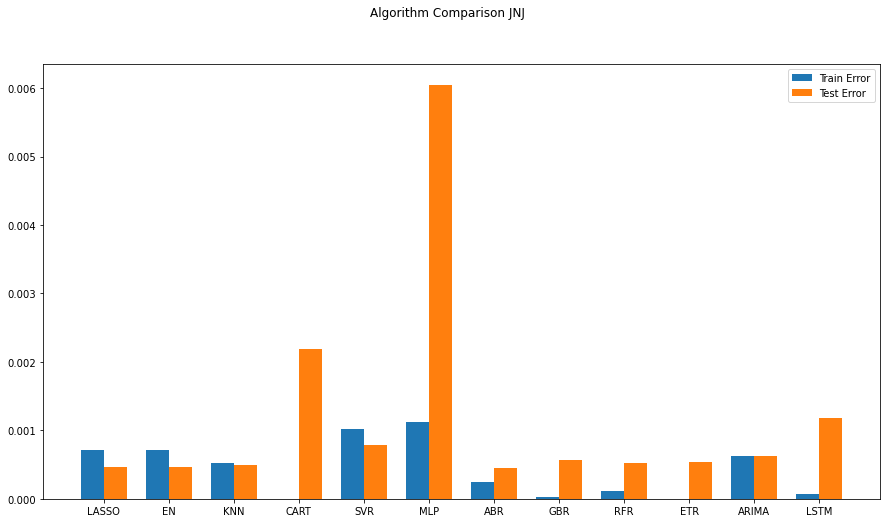

Best ARIMANone MSE=inf
0.00062352615837458


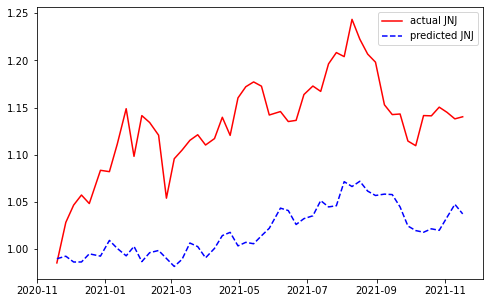

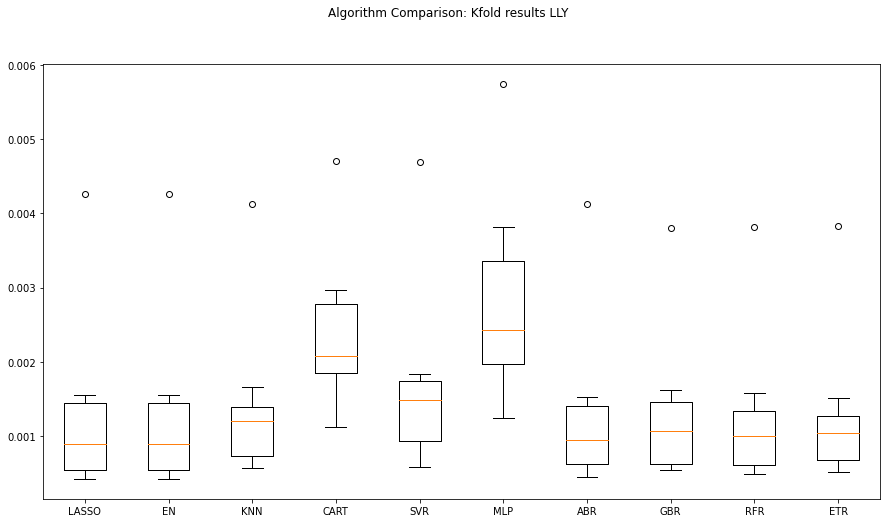

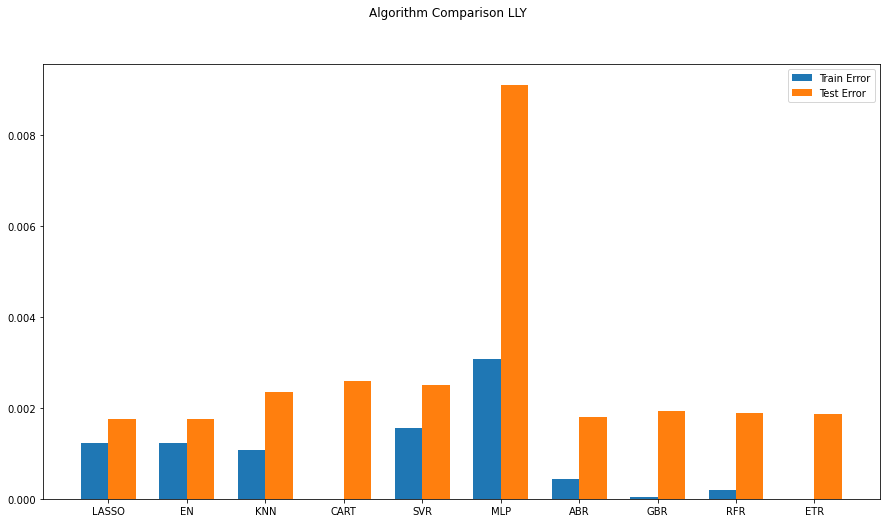

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

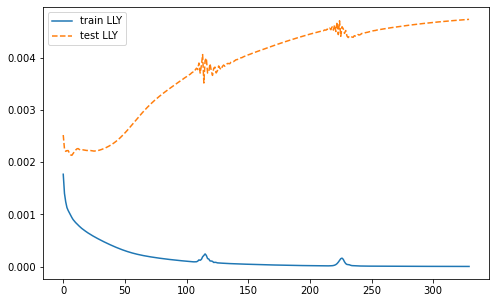

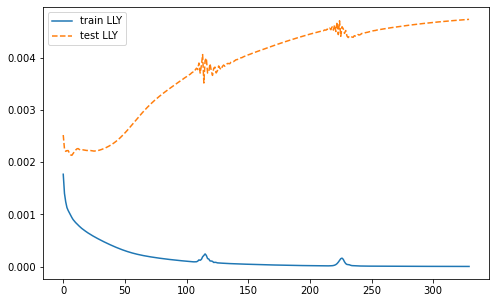

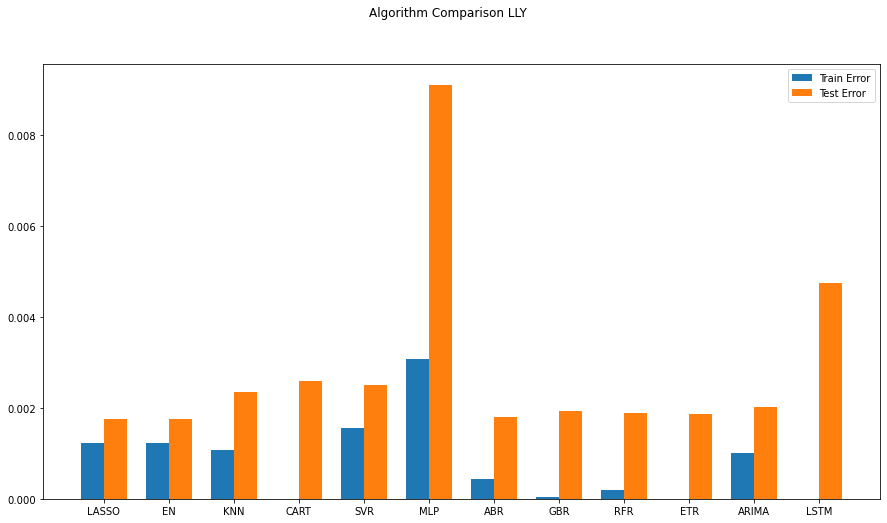

Best ARIMANone MSE=inf
0.0020136028645300627


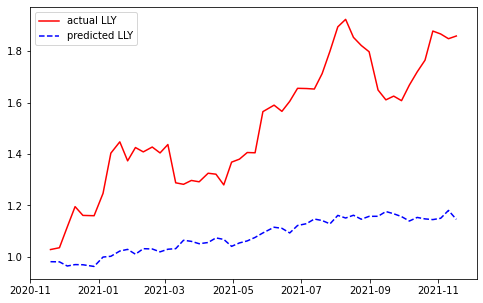

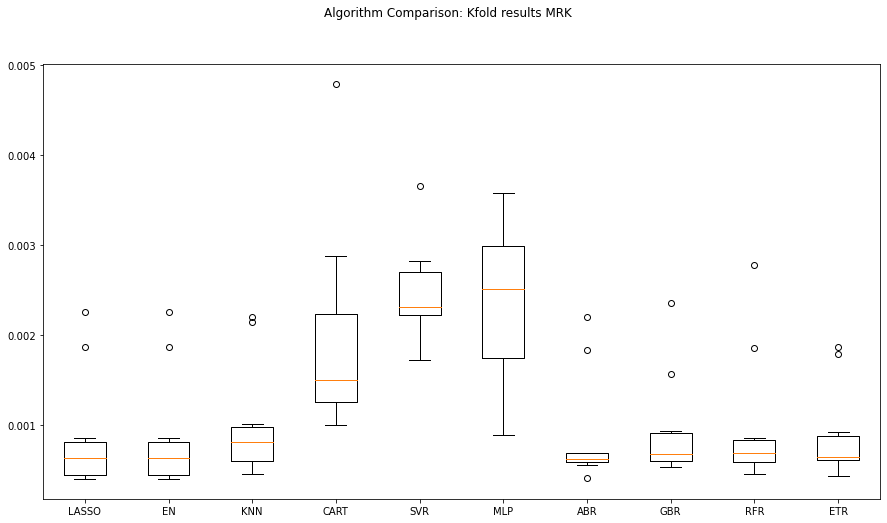

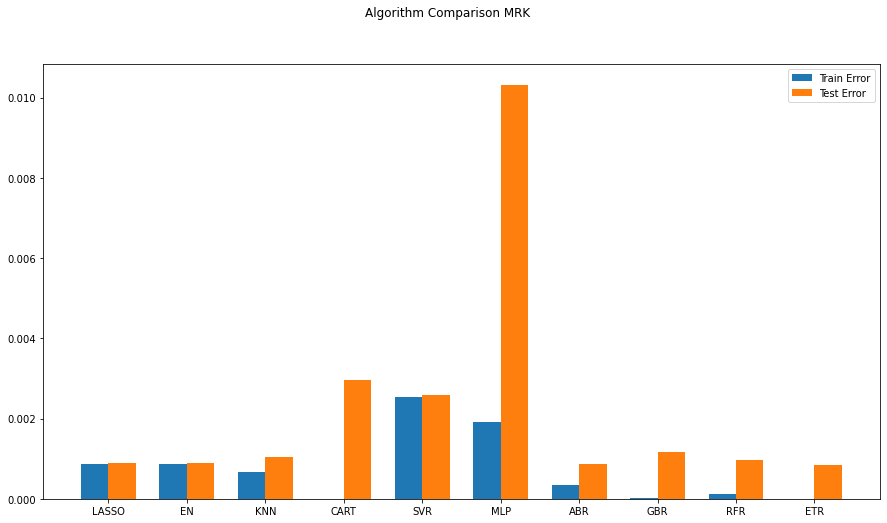

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

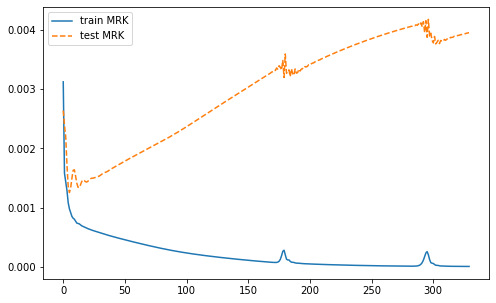

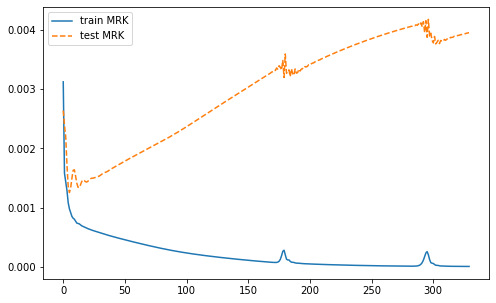

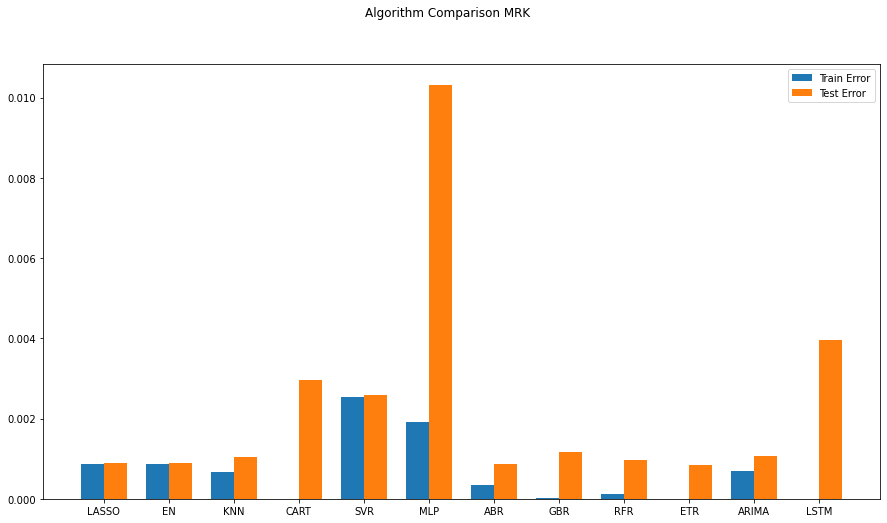

Best ARIMANone MSE=inf
0.001054453033924986


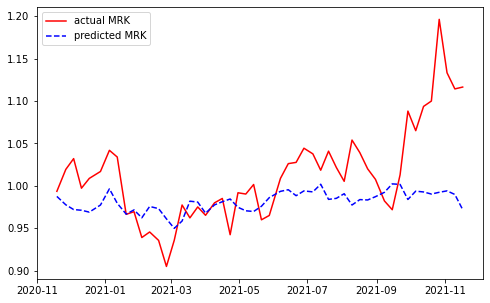

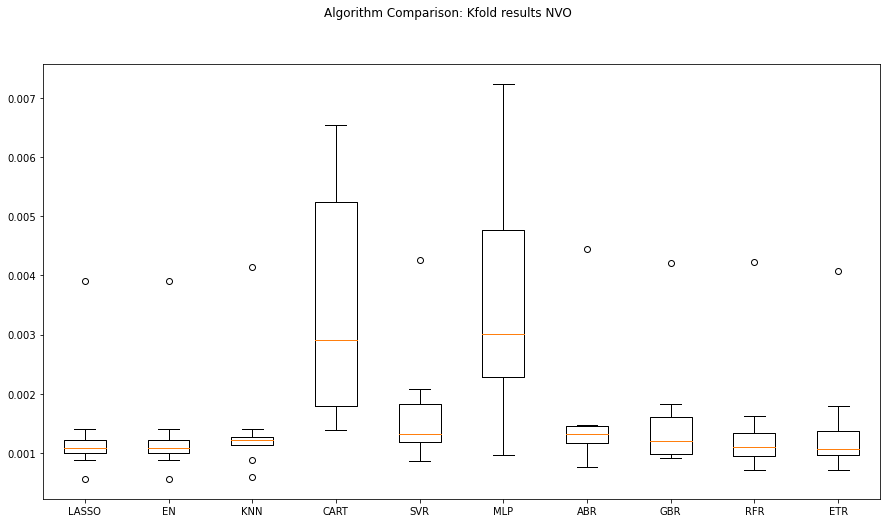

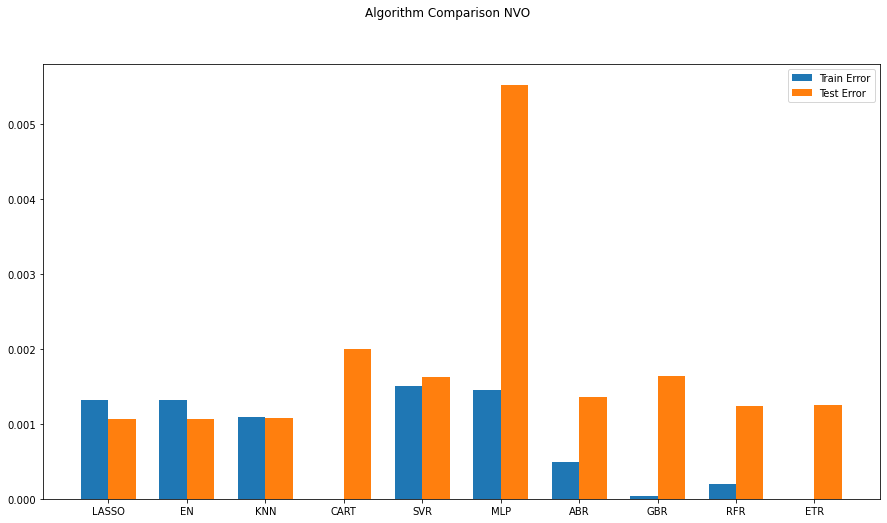

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

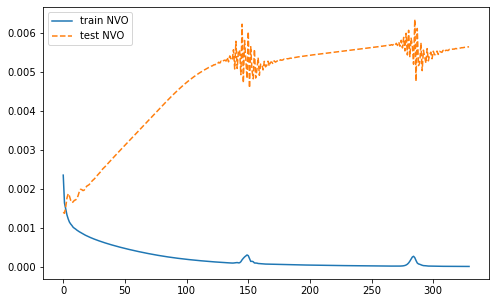

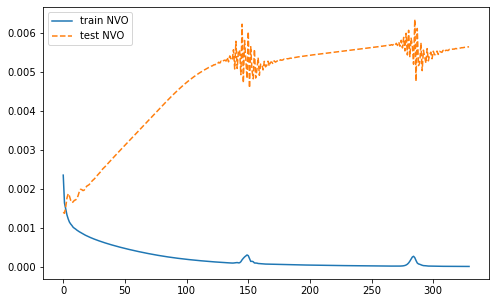

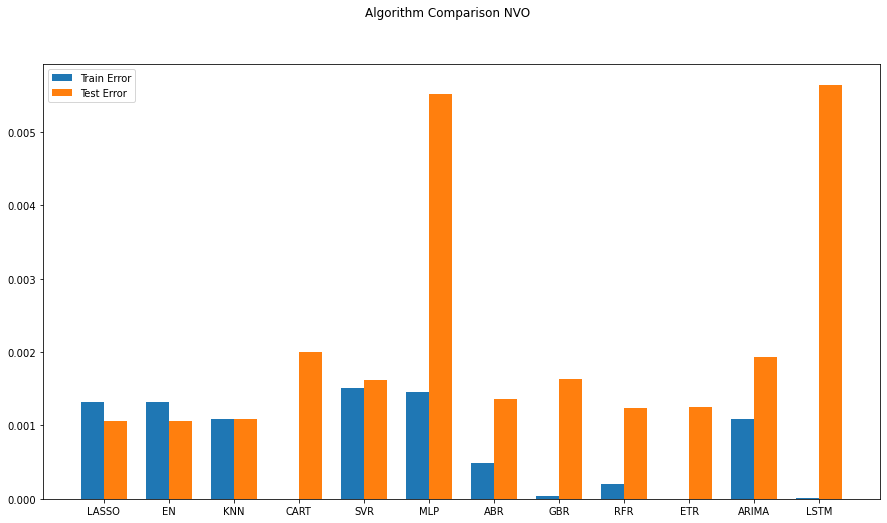

Best ARIMANone MSE=inf
0.0019380483122484842


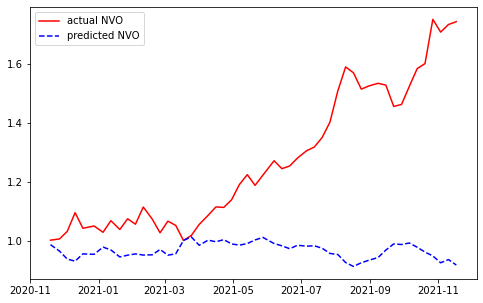

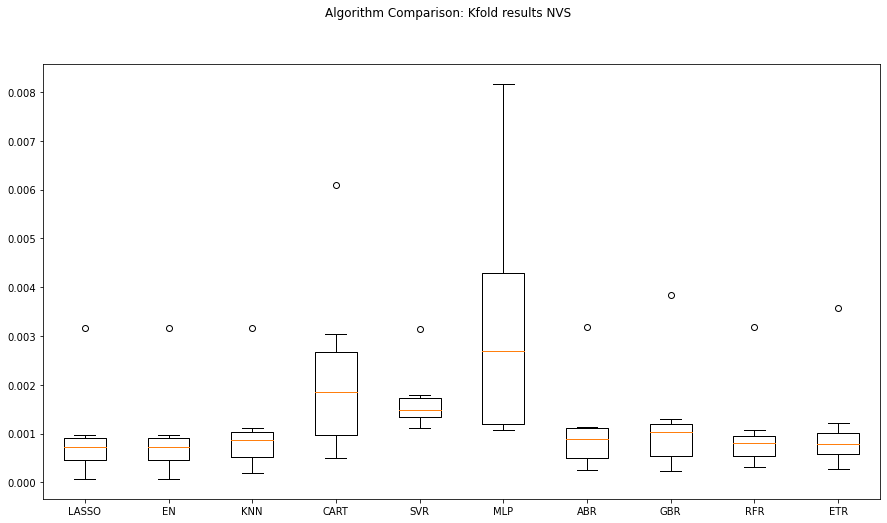

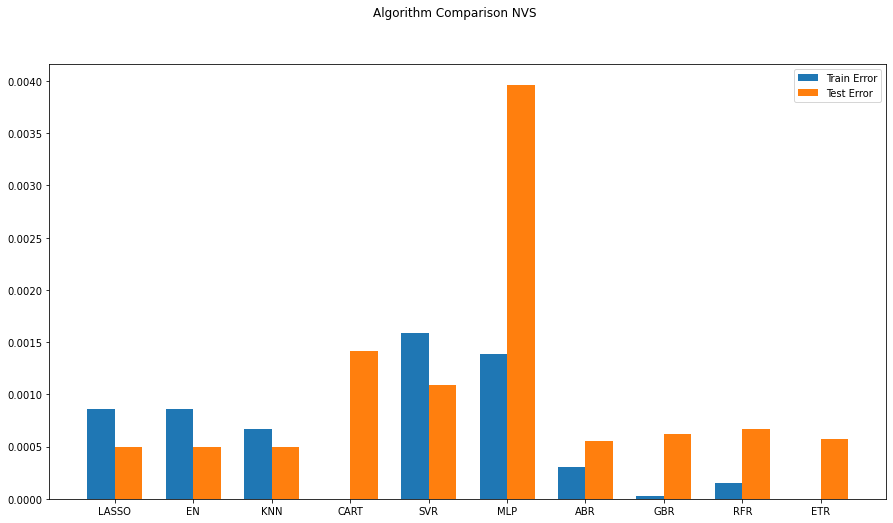

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       OGN  \
2016-11-22  0.000291 -0.000570  

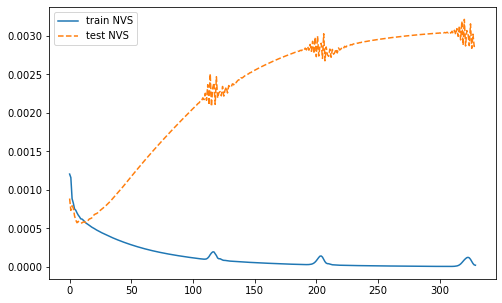

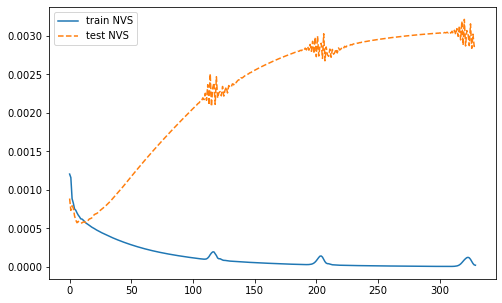

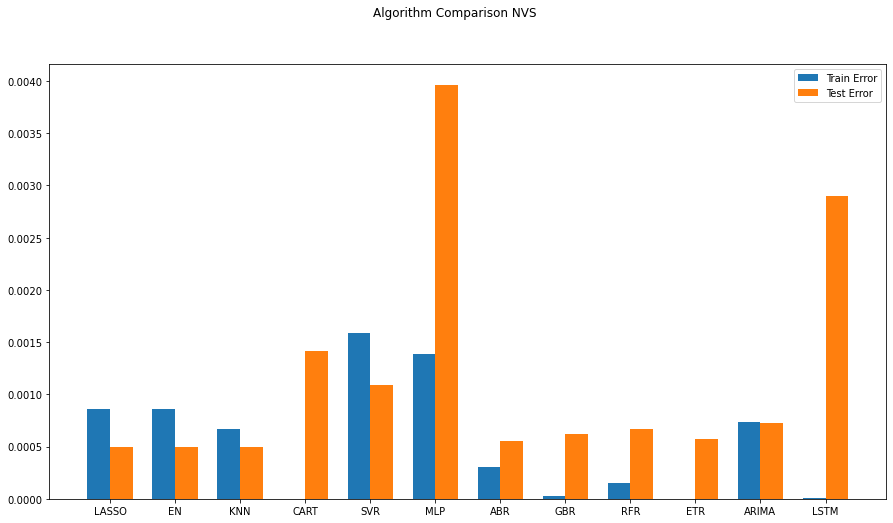

Best ARIMANone MSE=inf
0.0007218327750601438


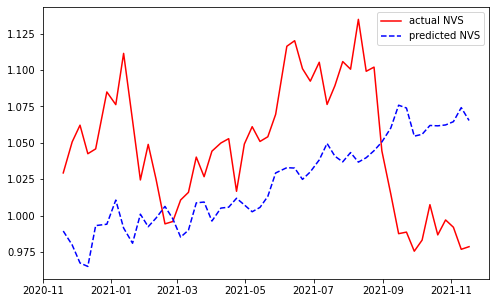

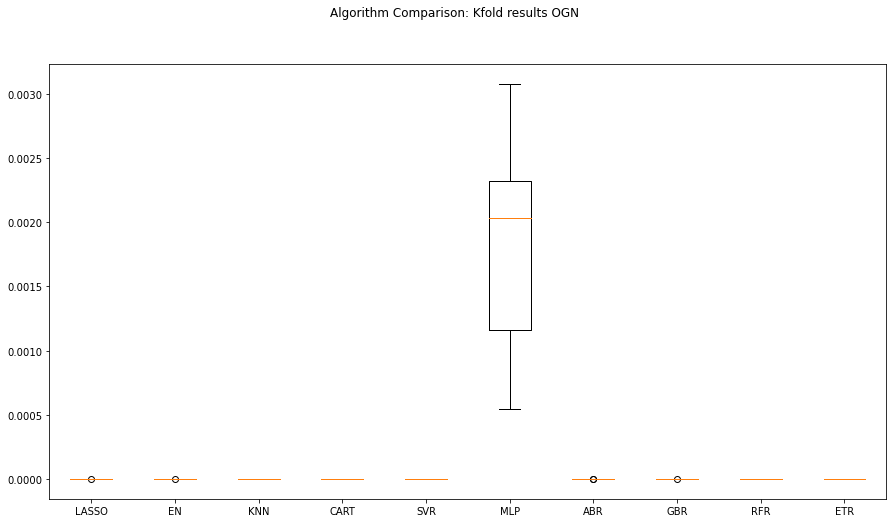

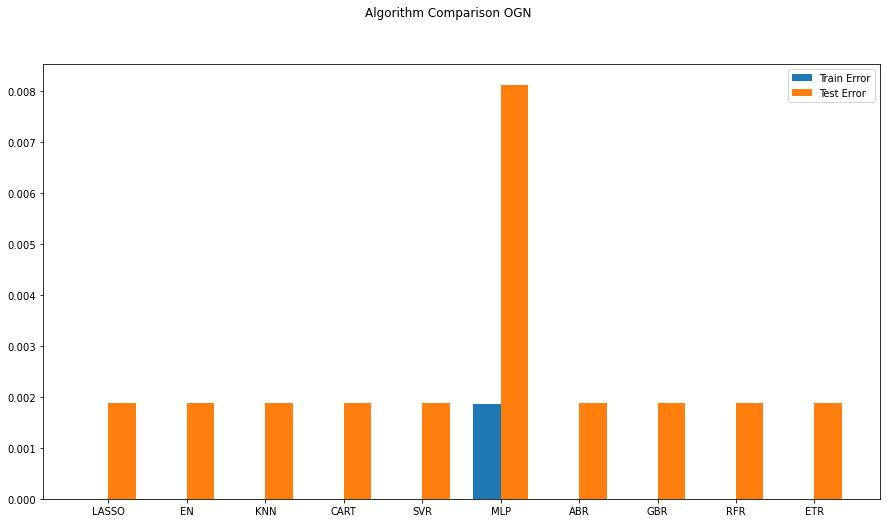

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       NVS  \
2016-11-22  0.000291 -0.000570  

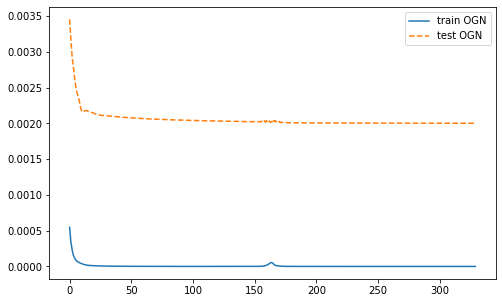

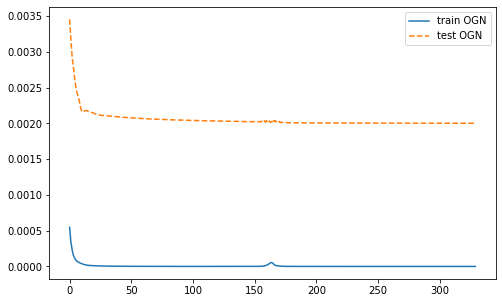

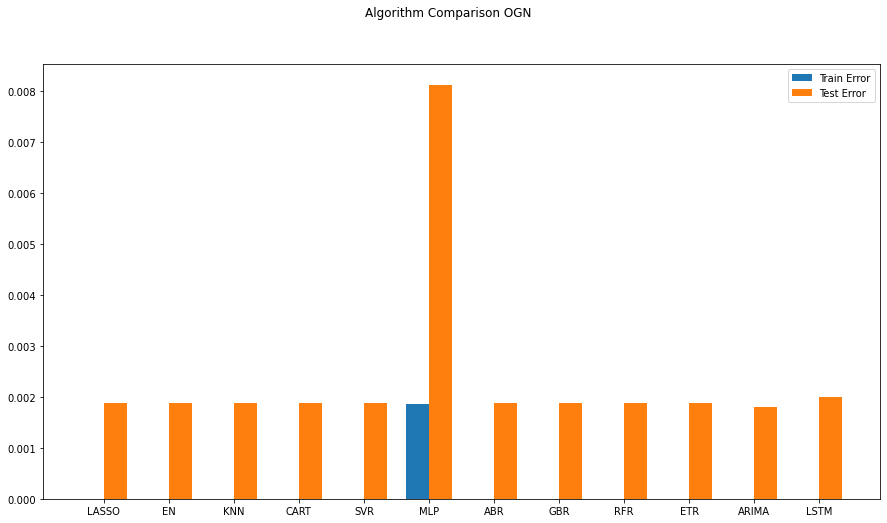

Best ARIMANone MSE=inf
0.0017942525815399484


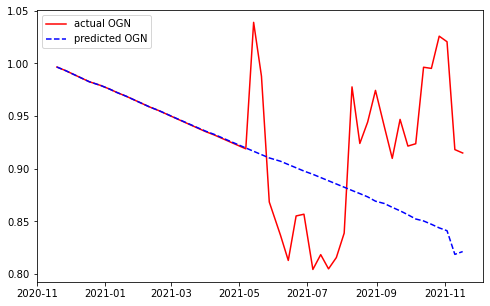

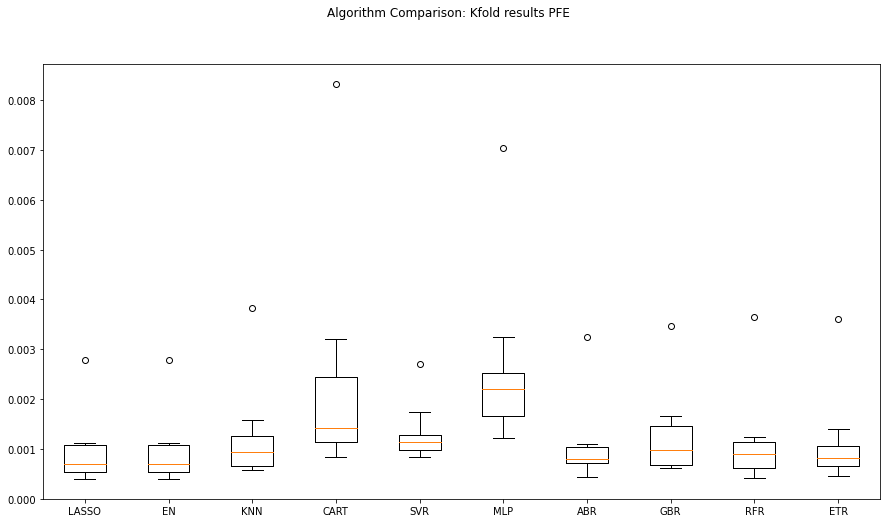

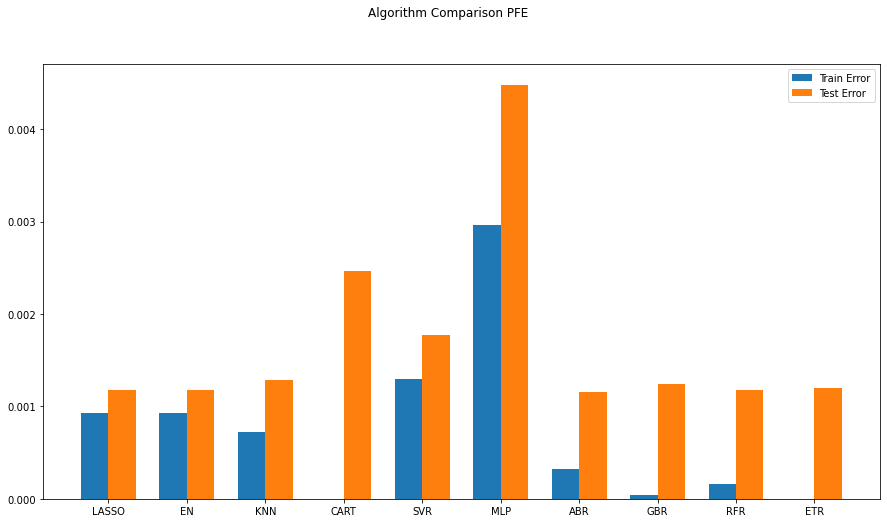

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       NVS  \
2016-11-22  0.000291 -0.000570  

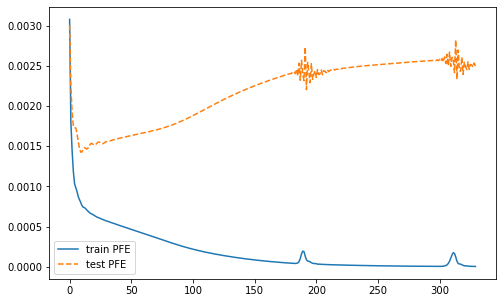

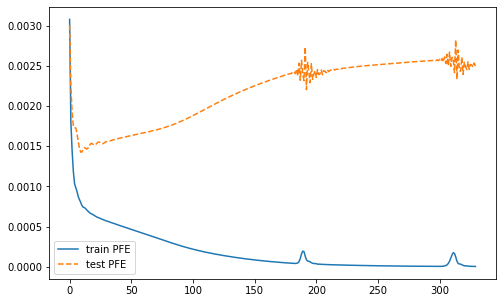

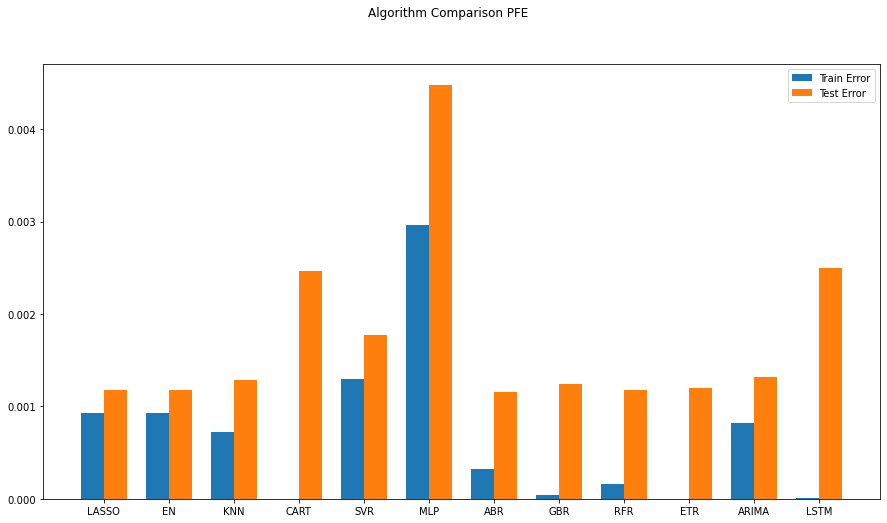

Best ARIMANone MSE=inf
0.001322315291218416


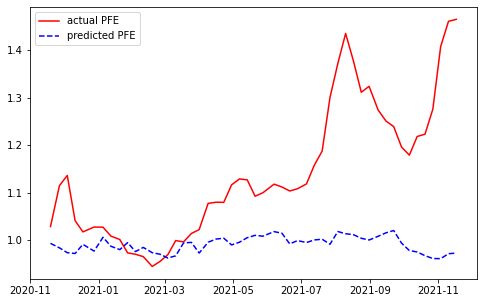

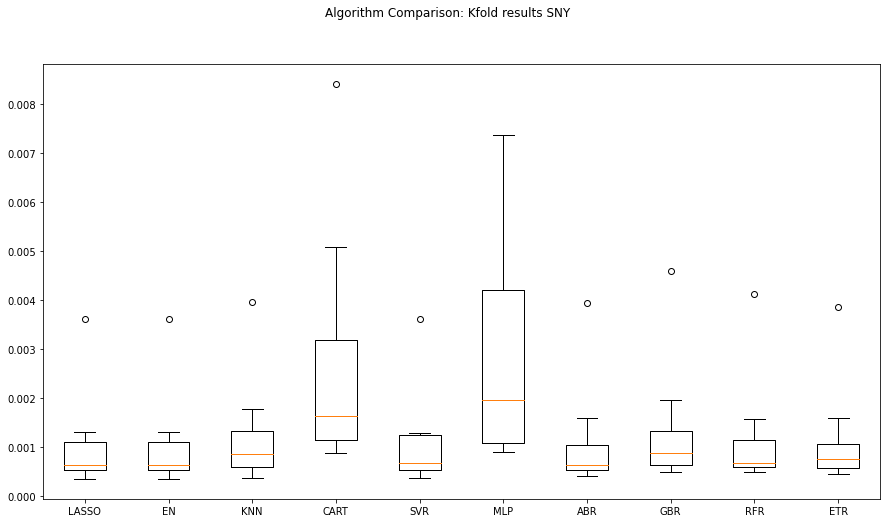

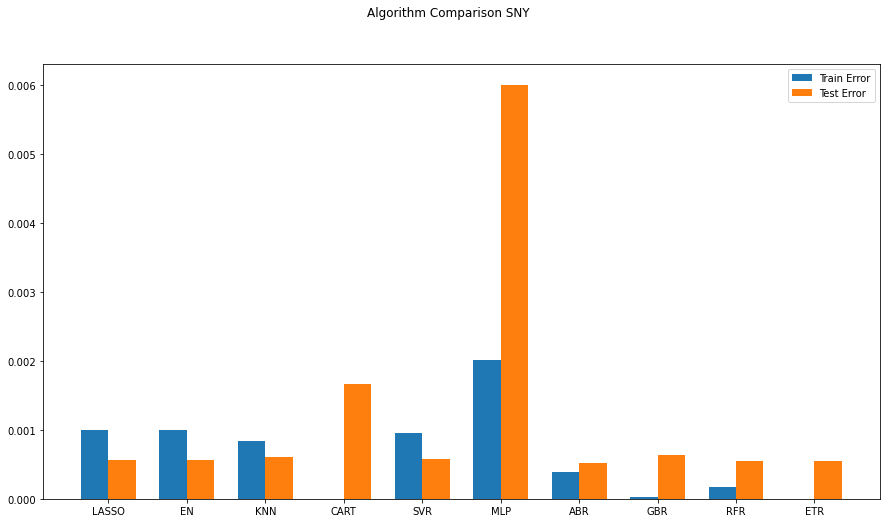

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       NVS  \
2016-11-22  0.000291 -0.000570  

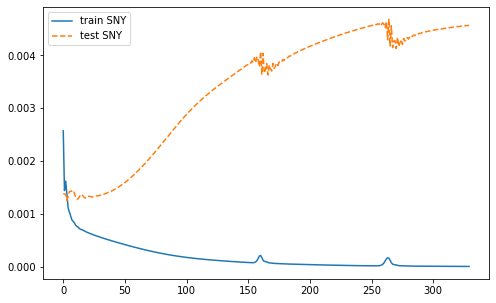

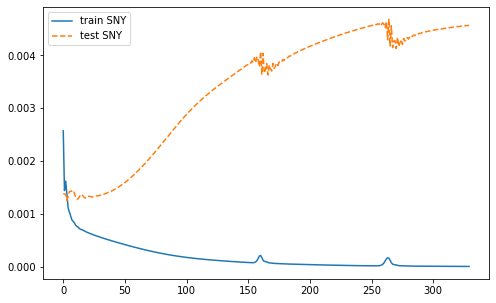

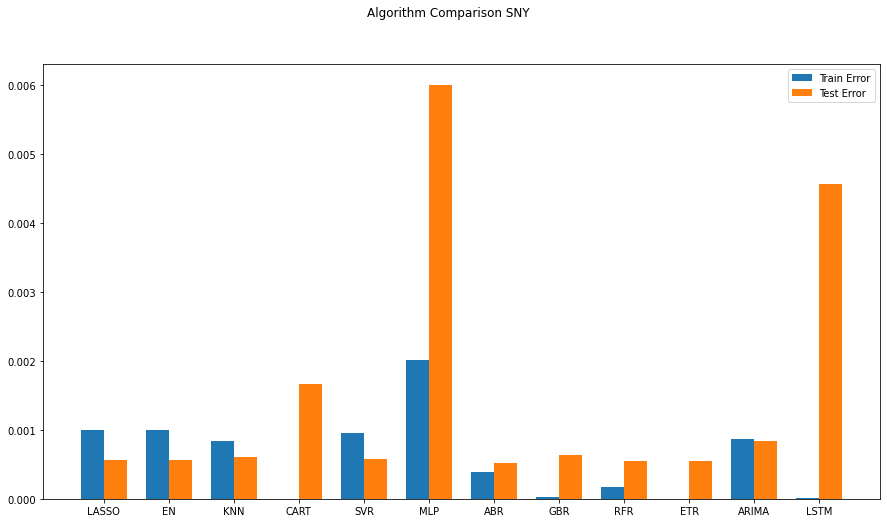

Best ARIMANone MSE=inf
0.0008445881045320701


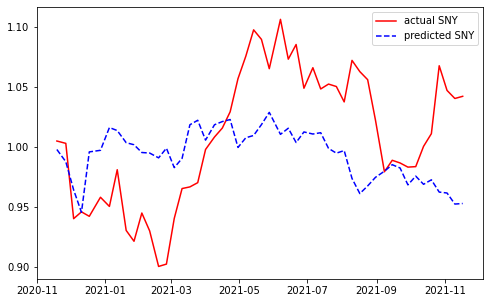

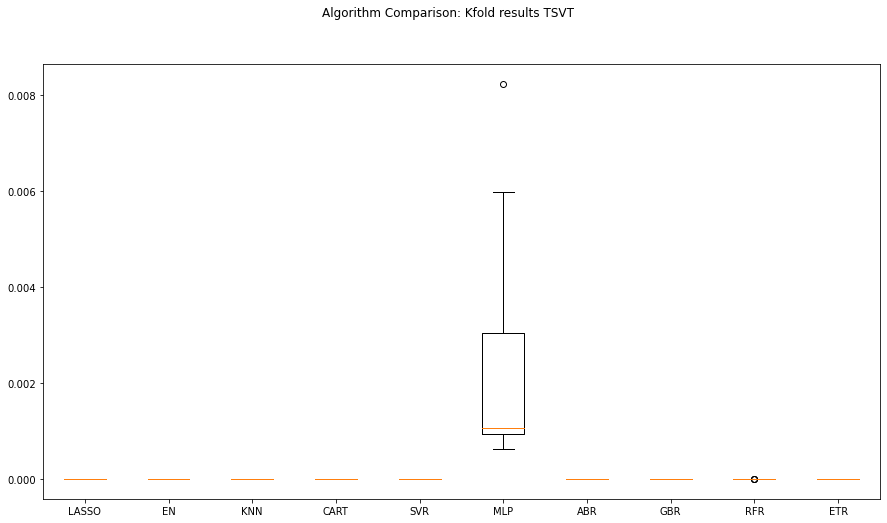

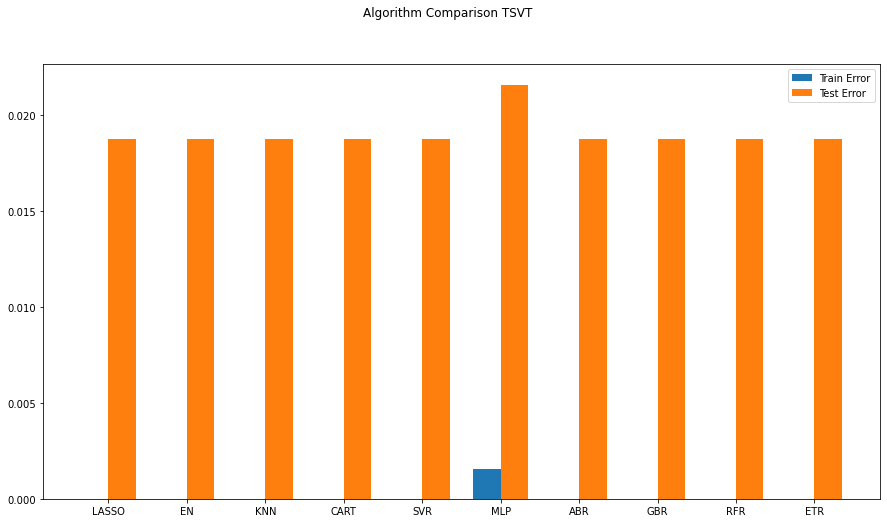

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       NVS  \
2016-11-22  0.000291 -0.000570  

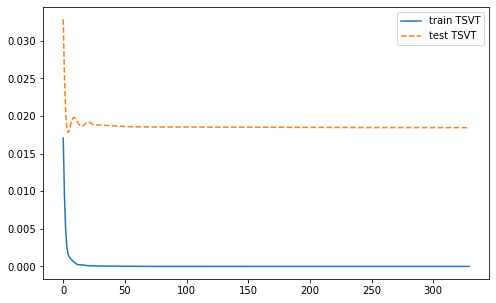

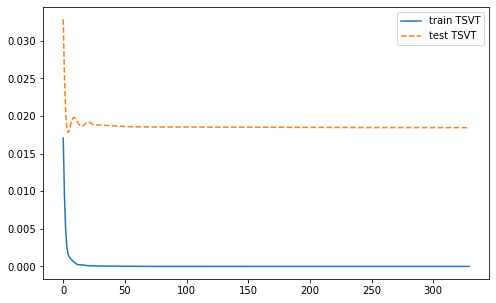

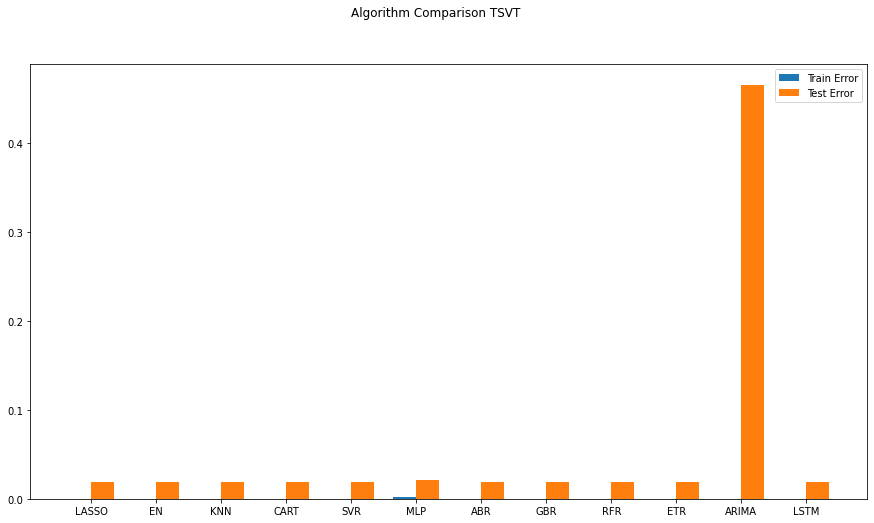

Best ARIMANone MSE=inf
0.46623473182518094


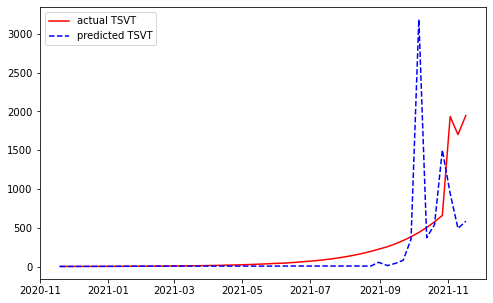

In [72]:
# Free for all
# Need to remove LR model
# LSTM Network
def create_LSTMmodel(learn_rate = 0.01, momentum=0): # create model
        model = Sequential()
        model.add(LSTM(50, input_shape=(X_train_LSTM.shape[1],X_train_LSTM.shape[2])))
        model.add(Dense(1))

        #More cells can be added if needed model.add(Dense(1))
        optimizer = SGD(lr=learn_rate, momentum=momentum) 
        model.compile(loss='mse', optimizer='adam')
        return model
    
def evaluate_arima_model(arima_order):
#predicted = list() 
    modelARIMA=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=arima_order) 
    model_fit = modelARIMA.fit()
    error = mean_squared_error(Y_temp, model_fit.fittedvalues)
    return error

# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(p_values, d_values, q_values): 
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q) 
                try:
                    mse = evaluate_arima_model(order) 
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.7f' % (order,mse))
                except: 
                    continue
    print('Best ARIMA%s MSE=%.7f' % (best_cfg, best_score))
    

    
seq_len = 2 #Length of the seq for the LSTM

for i in stk_tickers:
    try:
        #X_temp = X_train.filter(regex=i, axis=1)
        X_temp = X_train
        Y_temp = Y_train.filter(regex=i, axis=1)
        #_temp_test = X_test.filter(regex=i, axis=1)
        X_temp_test = X_test
        Y_temp_test = Y_test.filter(regex=i, axis=1)

        #temp = X.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
        #temp2 = X.filter(regex=i, axis=1)
        #X_temp_fulX = pd.concat([temp2, temp], axis=1)
        X_temp_fulX = X

        Arima_temp = X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
        Arima_temp_test = X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]

        names = []

        kfold_results = [] 
        test_results = [] 
        train_results = []
        # Model testing
        for name, model in models:
            names.append(name)
            ## k-fold analysis:
            kfold = KFold(n_splits=num_folds)
            #converted mean squared error to positive. The lower the better
            cv_results = -1* cross_val_score(model, X_temp, Y_temp, cv=kfold, scoring=scoring)
            kfold_results.append(cv_results)
            # Full Training period
            res = model.fit(X_temp, Y_temp)
            train_result = mean_squared_error(res.predict(X_temp), Y_temp) 
            train_results.append(train_result)
            # Test results
            test_result = mean_squared_error(res.predict(X_temp_test), Y_temp_test) 
            test_results.append(test_result)
        # Comparition starts by ticker
        for j in range(0,1):
            fig = pyplot.figure()
            fig.suptitle(f'Algorithm Comparison: Kfold results {i}')
            ax = fig.add_subplot(111)
            pyplot.boxplot(kfold_results)
            ax.set_xticklabels(names)
            fig.set_size_inches(15,8)
            plt.savefig(f"../readme_images/{i}_Kfold_comparison_ALL.png")
            pyplot.show()
        # Error testing
        for k in range(0,1):
            fig = pyplot.figure()
            ind = np.arange(len(names)) # the x locations for the groups
            width = 0.35 # the width of the bars
            fig.suptitle(f'Algorithm Comparison {i}')
            ax = fig.add_subplot(111)
            pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
            pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
            fig.set_size_inches(15,8)
            pyplot.legend()
            ax.set_xticks(ind)
            ax.set_xticklabels(names)
            plt.savefig(f"../readme_images/{i}_train_test_error_comparison_ALL.png")
            pyplot.show()

        # ARIMA and LSTM
        for arimalstm in range(0,1):

    #         X_train_ARIMA=X_temp.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
    #         X_test_ARIMA=X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
            X_train_ARIMA=Arima_temp.loc[:, Arima_temp.columns != i]
            X_test_ARIMA=Arima_temp_test.loc[:, Arima_temp.columns != i]

            tr_len = len(X_train_ARIMA)
            te_len = len(X_test_ARIMA)
            to_len = len(X_temp_fulX)

            print(X_train_ARIMA)

            X_train_ARIMA.index=pd.DatetimeIndex(X_train_ARIMA.index).to_period('W')

            Y_temp.index=pd.DatetimeIndex(Y_temp.index).to_period('W')

            modelARIMA=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=[1,0,0])
            model_fit = modelARIMA.fit(trend='nc')

            error_Training_ARIMA = mean_squared_error(Y_temp, model_fit.fittedvalues)
            predicted = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
            error_Test_ARIMA = mean_squared_error(Y_temp_test,predicted)
            print(error_Test_ARIMA)

            #seq_len = 2 #Length of the seq for the LSTM
            Y_train_LSTM, Y_test_LSTM = np.array(Y_temp)[seq_len-1:], np.array(Y_temp_test) 
            X_train_LSTM = np.zeros((X_temp.shape[0]+1-seq_len, seq_len, X_temp.shape[1]))
            X_test_LSTM = np.zeros((X_temp_test.shape[0], seq_len, X_temp_fulX.shape[1]))
            print(X_test_LSTM.shape)
            print(X_test_LSTM)

            for l in range(seq_len):
                X_train_LSTM[:, l, :] = np.array(X_temp)[l:X_temp.shape[0]+l+1-seq_len, :]
                X_test_LSTM[:, l, :] = np.array(X_temp_fulX)[X_temp.shape[0]+l-1:X_temp_fulX.shape[0]+l+1-seq_len, :]
            print(X_test_LSTM.shape)
            print(X_test_LSTM)

            LSTMModel = create_LSTMmodel(learn_rate = 0.01, momentum=0)
            LSTMModel_fit = LSTMModel.fit(X_train_LSTM, Y_train_LSTM, validation_data=(X_test_LSTM, Y_test_LSTM),epochs=330, batch_size=72, verbose=0, shuffle=False)

            for m in range(seq_len):
                pyplot.plot(LSTMModel_fit.history['loss'], label=f'train {i}', )
                pyplot.plot(LSTMModel_fit.history['val_loss'], '--',label=f'test {i}',)
                pyplot.legend()
                plt.savefig(f"../readme_images/{i}_train_test_LSTM_ALL.png")
                pyplot.show()

            error_Training_LSTM = mean_squared_error(Y_train_LSTM,LSTMModel.predict(X_train_LSTM))
            predicted = LSTMModel.predict(X_test_LSTM)
            error_Test_LSTM = mean_squared_error(Y_temp_test,predicted)

            test_results.append(error_Test_ARIMA)
            test_results.append(error_Test_LSTM)
            train_results.append(error_Training_ARIMA)
            train_results.append(error_Training_LSTM)
            names.append("ARIMA")
            names.append("LSTM")

            for n in range(0,1):
                fig = pyplot.figure()
                ind = np.arange(len(names)) # the x locations for the groups
                width = 0.35 # the width of the bars
                fig.suptitle(f'Algorithm Comparison {i}')
                ax = fig.add_subplot(111)
                pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
                pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
                fig.set_size_inches(15,8)
                pyplot.legend()
                ax.set_xticks(ind)
                ax.set_xticklabels(names)
                plt.savefig(f"../readme_images/{i}_train_test_error_comparison_ALL.png")
                pyplot.show()

            p_values = [0, 1, 2]
            d_values = range(0, 2)
            q_values = range(0, 2)
            #warnings.filterwarnings("ignore")
            evaluate_models(p_values, d_values, q_values)

            modelARIMA_tuned=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=[2,0,1])
            model_fit_tuned = modelARIMA_tuned.fit(trend='nc')
            # estimate accuracy on validation set
            predicted_tuned = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
            print(mean_squared_error(Y_temp_test,predicted_tuned))

            # plotting the actual data versus predicted data
            for o in range(0,1):
                predicted_tuned.index = Y_temp_test.index
                pyplot.plot(np.exp(Y_temp_test).cumprod(), 'r', label=f'actual {i}',)
                # plotting t, a separately
                pyplot.plot(np.exp(predicted_tuned).cumprod(), 'b--', label=f'predicted {i}')
                pyplot.legend()
                pyplot.rcParams["figure.figsize"] = (8,5)
                plt.savefig(f"../readme_images/{i}_actual_predicted_ALL.png")
                pyplot.show()
    except:
        pass

In [89]:
#X_train.loc[:, stk_tickers]
Arima_temp = X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
Arima_temp.loc[:, Arima_temp.columns != 'ABBV']

#X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
#X_train

,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,HZNP,...,NVS,OGN,PFE,SNY,TSVT,DEXJPUS,DEXUSUK,SP500,DJIA,VIXCLS
2016-11-21,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,0.006450,...,0.001827,-0.003531,0.002839,0.001751,0.135236,0.000166,-0.000044,0.002655,0.002188,0.001585
2016-11-29,0.003087,-0.023313,-0.050084,-0.006543,-0.020242,-0.001468,0.021189,-0.004172,0.040021,-0.018824,...,-0.016824,-0.003531,0.011026,0.006948,0.135236,0.016089,0.006498,0.000780,0.005124,0.038725
2016-12-06,-0.006114,-0.026557,-0.039100,-0.005873,-0.020242,-0.032581,-0.059077,-0.015271,0.139093,-0.040723,...,0.000000,-0.003531,-0.011342,0.005425,0.135236,0.010584,0.015946,0.003428,0.006785,-0.089976
2016-12-13,0.022217,0.062951,-0.013068,0.020142,-0.020242,0.038598,-0.006162,0.019964,-0.018238,-0.301466,...,0.032247,-0.003531,0.039452,0.006374,0.135236,0.011167,-0.001654,0.026536,0.033679,0.075924
2016-12-20,-0.007781,-0.024855,-0.006248,0.033540,-0.020242,-0.010612,0.072832,-0.003909,-0.025545,0.061608,...,0.010337,-0.003531,0.000609,-0.051654,0.135236,0.022307,-0.026117,-0.000423,0.003180,-0.105186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-14,-0.080881,-0.006372,0.011379,0.009554,-0.020242,0.019072,0.037761,0.016803,-0.030940,-0.002860,...,0.017189,-0.003531,0.010637,0.032594,0.135236,-0.008434,0.008405,0.020041,0.007411,-0.060981
2020-10-21,-0.037208,-0.030930,-0.072119,-0.016030,-0.020242,-0.061826,0.036387,-0.051279,-0.068531,-0.078187,...,-0.038356,-0.003531,0.005951,-0.039283,0.135236,-0.004770,0.009172,-0.015341,-0.010690,0.081789
2020-10-28,-0.056555,-0.011507,-0.096144,-0.038548,-0.020242,-0.025058,-0.093578,-0.040409,-0.023028,0.039469,...,-0.071168,-0.003531,-0.044954,-0.063603,0.135236,-0.002393,-0.011171,-0.049075,-0.061808,0.340702
2020-11-04,0.062477,0.076627,0.375658,0.124684,-0.020242,0.019395,0.026885,0.074339,0.077286,0.046285,...,0.066642,-0.003531,0.051674,0.092074,0.135236,0.000575,0.001845,0.051366,0.048852,-0.309095
